# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


In [2]:
alpha = 0.15

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

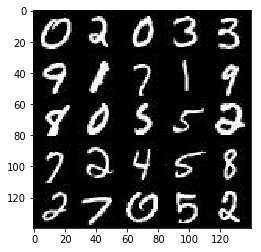

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

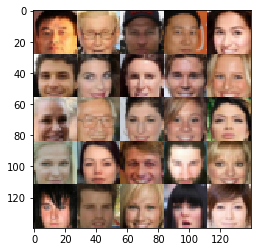

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    img = tf.placeholder(tf.float32, shape=[None, image_width, image_height, image_channels], name='input_z')
    inputs_z = tf.placeholder(tf.float32, shape=[None, z_dim], name='input_z')
    lr = tf.placeholder(tf.float32, name='lr')
    return img, inputs_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
#     print('discriminator')
#     print('images: ', images)
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is ?x28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', 
                              kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        relu1 = tf.maximum(0.02 * x1, x1)
        relu1 = tf.layers.dropout(relu1, rate=0.5)
        # 14x14x64
#         print(x1)
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same', 
                              kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.02 * bn2, bn2)
        relu2 = tf.layers.dropout(relu2, rate=0.5)
        # 7x7x128
#         print(x2)
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same', 
                              kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.02 * bn3, bn3)
        relu3 = tf.layers.dropout(relu3, rate=0.5)
        # 4x4x256 
#         print(x3)
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
#         print(logits)
        out = tf.sigmoid(logits)
#         print('discriminator out: ', out)
        return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
#     print('generator')
#     print('out_channel_dim: ', out_channel_dim)
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
#         x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
#         print(x1)
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
#         print(x2)
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x128 now
#         print(x3)

        x4 = tf.layers.conv2d_transpose(x3, 64, 5, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=1, padding='same')
        # 28x28x3 now
#         print(logits)3
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
#     print('Generator for fake images...')
    g_model = generator(input_z, out_channel_dim)
#     print('Passing discriminator with real images...')
    d_model_real, d_logits_real = discriminator(input_real)
#     print('Passing discriminator with fake images...')
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in update_ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
# tf.reset_default_graph()
show_every=20
print_every=1

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    print(epoch_count)
    print(batch_size)
    print(z_dim)
    print(learning_rate)
    print(beta1)
    print(data_shape)
    print(data_image_mode)
    
    

    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    input_real, input_z, learning_rate_ = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print('Starting Session...')
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            print('Epoch :', epoch_i)
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps +=1
                
                batch_images = batch_images*2.0
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z})

                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)

                
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

2
64
30
0.001
0.4
(60000, 28, 28, 1)
L
Starting Session...
Epoch : 0
Epoch 1/2... Discriminator Loss: 15.6208... Generator Loss: 0.0000
Epoch 1/2... Discriminator Loss: 9.0676... Generator Loss: 0.0002
Epoch 1/2... Discriminator Loss: 3.1156... Generator Loss: 3.0856
Epoch 1/2... Discriminator Loss: 8.0054... Generator Loss: 0.0005
Epoch 1/2... Discriminator Loss: 0.7265... Generator Loss: 1.3715
Epoch 1/2... Discriminator Loss: 1.0292... Generator Loss: 1.2111
Epoch 1/2... Discriminator Loss: 0.5375... Generator Loss: 3.9218
Epoch 1/2... Discriminator Loss: 3.2712... Generator Loss: 0.1677
Epoch 1/2... Discriminator Loss: 2.1505... Generator Loss: 9.4128
Epoch 1/2... Discriminator Loss: 0.3546... Generator Loss: 2.6493
Epoch 1/2... Discriminator Loss: 0.4817... Generator Loss: 1.7825
Epoch 1/2... Discriminator Loss: 1.5662... Generator Loss: 0.7328
Epoch 1/2... Discriminator Loss: 2.3180... Generator Loss: 5.8899
Epoch 1/2... Discriminator Loss: 2.3334... Generator Loss: 0.8717
Epoch 

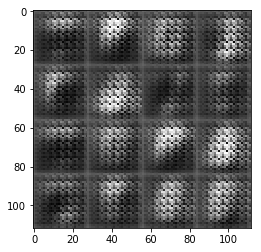

Epoch 1/2... Discriminator Loss: 0.6501... Generator Loss: 1.8380
Epoch 1/2... Discriminator Loss: 1.2884... Generator Loss: 0.7988
Epoch 1/2... Discriminator Loss: 0.9662... Generator Loss: 2.1217
Epoch 1/2... Discriminator Loss: 1.7815... Generator Loss: 0.4475
Epoch 1/2... Discriminator Loss: 1.7089... Generator Loss: 1.7101
Epoch 1/2... Discriminator Loss: 2.7239... Generator Loss: 0.1279
Epoch 1/2... Discriminator Loss: 2.6157... Generator Loss: 3.5681
Epoch 1/2... Discriminator Loss: 2.2232... Generator Loss: 0.5533
Epoch 1/2... Discriminator Loss: 1.3289... Generator Loss: 1.8077
Epoch 1/2... Discriminator Loss: 1.8193... Generator Loss: 0.3076
Epoch 1/2... Discriminator Loss: 1.6719... Generator Loss: 1.5953
Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 0.6314
Epoch 1/2... Discriminator Loss: 0.8222... Generator Loss: 1.4861
Epoch 1/2... Discriminator Loss: 1.3087... Generator Loss: 0.6197
Epoch 1/2... Discriminator Loss: 1.2389... Generator Loss: 1.6094
Epoch 1/2.

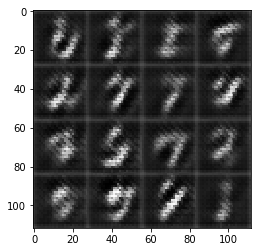

Epoch 1/2... Discriminator Loss: 1.3207... Generator Loss: 1.2700
Epoch 1/2... Discriminator Loss: 1.4415... Generator Loss: 0.5087
Epoch 1/2... Discriminator Loss: 1.5859... Generator Loss: 2.4874
Epoch 1/2... Discriminator Loss: 1.9187... Generator Loss: 0.2208
Epoch 1/2... Discriminator Loss: 1.8620... Generator Loss: 2.8884
Epoch 1/2... Discriminator Loss: 1.7599... Generator Loss: 0.3773
Epoch 1/2... Discriminator Loss: 1.1094... Generator Loss: 1.5529
Epoch 1/2... Discriminator Loss: 1.0405... Generator Loss: 0.9657
Epoch 1/2... Discriminator Loss: 0.9580... Generator Loss: 1.2174
Epoch 1/2... Discriminator Loss: 1.0976... Generator Loss: 0.7437
Epoch 1/2... Discriminator Loss: 0.8341... Generator Loss: 1.4085
Epoch 1/2... Discriminator Loss: 0.8064... Generator Loss: 1.0416
Epoch 1/2... Discriminator Loss: 1.0010... Generator Loss: 0.8551
Epoch 1/2... Discriminator Loss: 1.3553... Generator Loss: 0.8101
Epoch 1/2... Discriminator Loss: 1.3556... Generator Loss: 1.1402
Epoch 1/2.

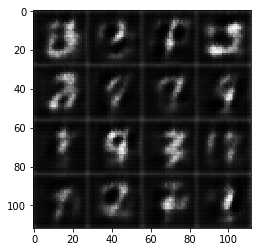

Epoch 1/2... Discriminator Loss: 1.2962... Generator Loss: 1.3949
Epoch 1/2... Discriminator Loss: 1.3425... Generator Loss: 0.4806
Epoch 1/2... Discriminator Loss: 1.0882... Generator Loss: 1.4747
Epoch 1/2... Discriminator Loss: 1.1613... Generator Loss: 0.6159
Epoch 1/2... Discriminator Loss: 1.0978... Generator Loss: 1.5265
Epoch 1/2... Discriminator Loss: 1.1069... Generator Loss: 0.6818
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 1.0649
Epoch 1/2... Discriminator Loss: 1.2750... Generator Loss: 0.6878
Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 0.8401
Epoch 1/2... Discriminator Loss: 1.2076... Generator Loss: 0.9922
Epoch 1/2... Discriminator Loss: 1.3328... Generator Loss: 0.5451
Epoch 1/2... Discriminator Loss: 1.1909... Generator Loss: 1.7594
Epoch 1/2... Discriminator Loss: 1.4927... Generator Loss: 0.3705
Epoch 1/2... Discriminator Loss: 1.4588... Generator Loss: 2.0271
Epoch 1/2... Discriminator Loss: 1.8541... Generator Loss: 0.3059
Epoch 1/2.

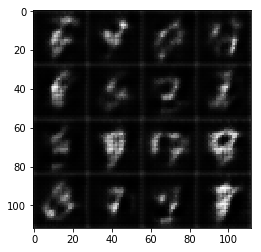

Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.5087
Epoch 1/2... Discriminator Loss: 1.3363... Generator Loss: 1.2697
Epoch 1/2... Discriminator Loss: 1.6046... Generator Loss: 0.4209
Epoch 1/2... Discriminator Loss: 1.4897... Generator Loss: 1.1738
Epoch 1/2... Discriminator Loss: 1.4858... Generator Loss: 0.4308
Epoch 1/2... Discriminator Loss: 1.2366... Generator Loss: 1.5633
Epoch 1/2... Discriminator Loss: 1.4473... Generator Loss: 0.4318
Epoch 1/2... Discriminator Loss: 1.4423... Generator Loss: 1.7019
Epoch 1/2... Discriminator Loss: 1.2075... Generator Loss: 0.5340
Epoch 1/2... Discriminator Loss: 1.0974... Generator Loss: 1.2940
Epoch 1/2... Discriminator Loss: 1.2261... Generator Loss: 0.5685
Epoch 1/2... Discriminator Loss: 1.0757... Generator Loss: 1.4096
Epoch 1/2... Discriminator Loss: 1.3372... Generator Loss: 0.5716
Epoch 1/2... Discriminator Loss: 1.3172... Generator Loss: 1.7041
Epoch 1/2... Discriminator Loss: 1.7872... Generator Loss: 0.2998
Epoch 1/2.

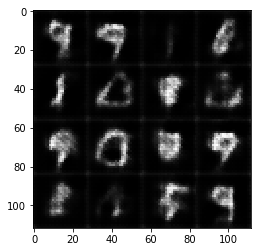

Epoch 1/2... Discriminator Loss: 1.2158... Generator Loss: 0.6923
Epoch 1/2... Discriminator Loss: 1.1501... Generator Loss: 0.9800
Epoch 1/2... Discriminator Loss: 1.3536... Generator Loss: 0.5056
Epoch 1/2... Discriminator Loss: 1.6712... Generator Loss: 1.6707
Epoch 1/2... Discriminator Loss: 1.5974... Generator Loss: 0.3244
Epoch 1/2... Discriminator Loss: 1.3684... Generator Loss: 1.6633
Epoch 1/2... Discriminator Loss: 1.3283... Generator Loss: 0.5004
Epoch 1/2... Discriminator Loss: 1.2336... Generator Loss: 0.9394
Epoch 1/2... Discriminator Loss: 1.3159... Generator Loss: 0.6315
Epoch 1/2... Discriminator Loss: 1.3660... Generator Loss: 0.8817
Epoch 1/2... Discriminator Loss: 1.3895... Generator Loss: 0.5088
Epoch 1/2... Discriminator Loss: 1.4992... Generator Loss: 0.8962
Epoch 1/2... Discriminator Loss: 1.3986... Generator Loss: 0.6248
Epoch 1/2... Discriminator Loss: 1.1684... Generator Loss: 1.0472
Epoch 1/2... Discriminator Loss: 1.2179... Generator Loss: 0.6599
Epoch 1/2.

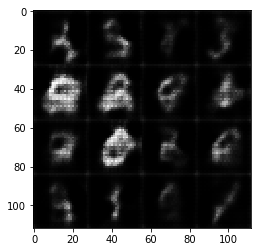

Epoch 1/2... Discriminator Loss: 1.6516... Generator Loss: 0.3536
Epoch 1/2... Discriminator Loss: 1.3528... Generator Loss: 1.3009
Epoch 1/2... Discriminator Loss: 1.3335... Generator Loss: 0.6669
Epoch 1/2... Discriminator Loss: 1.3385... Generator Loss: 0.8412
Epoch 1/2... Discriminator Loss: 1.1262... Generator Loss: 0.8262
Epoch 1/2... Discriminator Loss: 1.0767... Generator Loss: 0.8213
Epoch 1/2... Discriminator Loss: 1.2093... Generator Loss: 0.9352
Epoch 1/2... Discriminator Loss: 1.3266... Generator Loss: 0.5761
Epoch 1/2... Discriminator Loss: 1.4833... Generator Loss: 0.9769
Epoch 1/2... Discriminator Loss: 1.4714... Generator Loss: 0.4071
Epoch 1/2... Discriminator Loss: 1.4066... Generator Loss: 1.2835
Epoch 1/2... Discriminator Loss: 1.4300... Generator Loss: 0.4331
Epoch 1/2... Discriminator Loss: 1.2633... Generator Loss: 1.5096
Epoch 1/2... Discriminator Loss: 1.5138... Generator Loss: 0.4460
Epoch 1/2... Discriminator Loss: 1.3116... Generator Loss: 0.9760
Epoch 1/2.

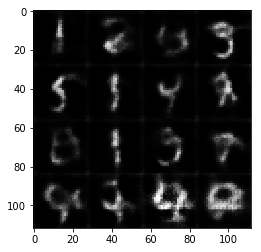

Epoch 1/2... Discriminator Loss: 1.3022... Generator Loss: 1.1654
Epoch 1/2... Discriminator Loss: 1.5476... Generator Loss: 0.4363
Epoch 1/2... Discriminator Loss: 1.3412... Generator Loss: 1.3678
Epoch 1/2... Discriminator Loss: 1.4216... Generator Loss: 0.4306
Epoch 1/2... Discriminator Loss: 1.3117... Generator Loss: 1.0673
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.6407
Epoch 1/2... Discriminator Loss: 1.3080... Generator Loss: 0.8790
Epoch 1/2... Discriminator Loss: 1.2809... Generator Loss: 0.6759
Epoch 1/2... Discriminator Loss: 1.2630... Generator Loss: 0.8684
Epoch 1/2... Discriminator Loss: 1.1794... Generator Loss: 0.9322
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.6387
Epoch 1/2... Discriminator Loss: 1.3741... Generator Loss: 0.9465
Epoch 1/2... Discriminator Loss: 1.3256... Generator Loss: 0.6516
Epoch 1/2... Discriminator Loss: 1.2387... Generator Loss: 0.7112
Epoch 1/2... Discriminator Loss: 1.1188... Generator Loss: 1.1177
Epoch 1/2.

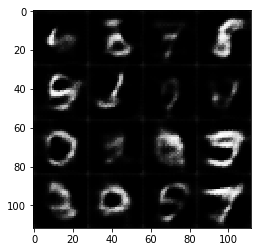

Epoch 1/2... Discriminator Loss: 1.4401... Generator Loss: 1.2547
Epoch 1/2... Discriminator Loss: 1.1554... Generator Loss: 0.6857
Epoch 1/2... Discriminator Loss: 1.3382... Generator Loss: 0.5922
Epoch 1/2... Discriminator Loss: 1.4117... Generator Loss: 1.0724
Epoch 1/2... Discriminator Loss: 1.2603... Generator Loss: 0.5661
Epoch 1/2... Discriminator Loss: 1.2810... Generator Loss: 1.0895
Epoch 1/2... Discriminator Loss: 1.2034... Generator Loss: 0.5905
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 1.1226
Epoch 1/2... Discriminator Loss: 1.2283... Generator Loss: 0.6585
Epoch 1/2... Discriminator Loss: 1.2293... Generator Loss: 0.8966
Epoch 1/2... Discriminator Loss: 1.1830... Generator Loss: 0.7730
Epoch 1/2... Discriminator Loss: 1.1398... Generator Loss: 0.9304
Epoch 1/2... Discriminator Loss: 1.2085... Generator Loss: 0.6797
Epoch 1/2... Discriminator Loss: 1.2853... Generator Loss: 0.9042
Epoch 1/2... Discriminator Loss: 1.2467... Generator Loss: 0.6230
Epoch 1/2.

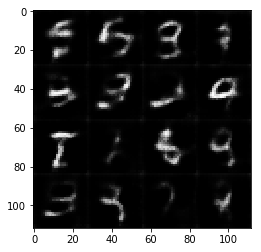

Epoch 1/2... Discriminator Loss: 1.3408... Generator Loss: 1.6115
Epoch 1/2... Discriminator Loss: 1.3738... Generator Loss: 0.4632
Epoch 1/2... Discriminator Loss: 1.4004... Generator Loss: 1.2416
Epoch 1/2... Discriminator Loss: 1.2220... Generator Loss: 0.7197
Epoch 1/2... Discriminator Loss: 1.2381... Generator Loss: 0.7954
Epoch 1/2... Discriminator Loss: 1.2517... Generator Loss: 0.8737
Epoch 1/2... Discriminator Loss: 1.1539... Generator Loss: 0.7178
Epoch 1/2... Discriminator Loss: 1.2352... Generator Loss: 0.7667
Epoch 1/2... Discriminator Loss: 1.1796... Generator Loss: 0.9664
Epoch 1/2... Discriminator Loss: 1.1555... Generator Loss: 0.6237
Epoch 1/2... Discriminator Loss: 1.1698... Generator Loss: 1.3071
Epoch 1/2... Discriminator Loss: 1.4290... Generator Loss: 0.4295
Epoch 1/2... Discriminator Loss: 1.2537... Generator Loss: 1.4099
Epoch 1/2... Discriminator Loss: 1.4660... Generator Loss: 0.4017
Epoch 1/2... Discriminator Loss: 1.3563... Generator Loss: 1.2847
Epoch 1/2.

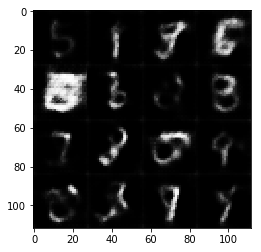

Epoch 1/2... Discriminator Loss: 1.3224... Generator Loss: 0.9432
Epoch 1/2... Discriminator Loss: 1.3612... Generator Loss: 0.5314
Epoch 1/2... Discriminator Loss: 1.3298... Generator Loss: 1.1464
Epoch 1/2... Discriminator Loss: 1.3892... Generator Loss: 0.4565
Epoch 1/2... Discriminator Loss: 1.2267... Generator Loss: 1.2236
Epoch 1/2... Discriminator Loss: 1.3919... Generator Loss: 0.5027
Epoch 1/2... Discriminator Loss: 1.2306... Generator Loss: 1.0214
Epoch 1/2... Discriminator Loss: 1.2358... Generator Loss: 0.5959
Epoch 1/2... Discriminator Loss: 1.2297... Generator Loss: 0.9888
Epoch 1/2... Discriminator Loss: 1.2706... Generator Loss: 0.6543
Epoch 1/2... Discriminator Loss: 1.1541... Generator Loss: 1.0140
Epoch 1/2... Discriminator Loss: 1.3570... Generator Loss: 0.5157
Epoch 1/2... Discriminator Loss: 1.3729... Generator Loss: 0.9368
Epoch 1/2... Discriminator Loss: 1.1934... Generator Loss: 0.6548
Epoch 1/2... Discriminator Loss: 1.2479... Generator Loss: 1.0970
Epoch 1/2.

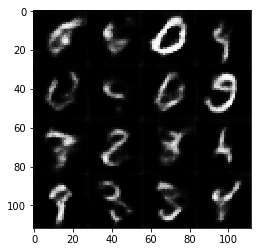

Epoch 1/2... Discriminator Loss: 1.4644... Generator Loss: 1.6532
Epoch 1/2... Discriminator Loss: 1.4402... Generator Loss: 0.4328
Epoch 1/2... Discriminator Loss: 1.3433... Generator Loss: 1.0168
Epoch 1/2... Discriminator Loss: 1.2065... Generator Loss: 0.7403
Epoch 1/2... Discriminator Loss: 1.1860... Generator Loss: 0.8449
Epoch 1/2... Discriminator Loss: 1.2102... Generator Loss: 0.7591
Epoch 1/2... Discriminator Loss: 1.1154... Generator Loss: 0.8865
Epoch 1/2... Discriminator Loss: 1.1739... Generator Loss: 0.7221
Epoch 1/2... Discriminator Loss: 1.0884... Generator Loss: 0.9629
Epoch 1/2... Discriminator Loss: 1.1056... Generator Loss: 0.7870
Epoch 1/2... Discriminator Loss: 1.1842... Generator Loss: 0.8144
Epoch 1/2... Discriminator Loss: 1.3621... Generator Loss: 0.6294
Epoch 1/2... Discriminator Loss: 1.2071... Generator Loss: 0.7635
Epoch 1/2... Discriminator Loss: 1.2343... Generator Loss: 0.7172
Epoch 1/2... Discriminator Loss: 1.2619... Generator Loss: 1.1456
Epoch 1/2.

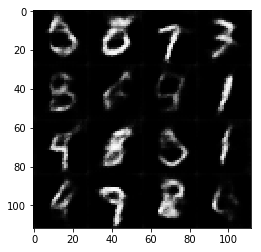

Epoch 1/2... Discriminator Loss: 1.2354... Generator Loss: 0.8426
Epoch 1/2... Discriminator Loss: 1.1945... Generator Loss: 0.6581
Epoch 1/2... Discriminator Loss: 1.2950... Generator Loss: 1.0193
Epoch 1/2... Discriminator Loss: 1.3744... Generator Loss: 0.4777
Epoch 1/2... Discriminator Loss: 1.2642... Generator Loss: 1.2532
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.4801
Epoch 1/2... Discriminator Loss: 1.2144... Generator Loss: 1.4707
Epoch 1/2... Discriminator Loss: 1.3489... Generator Loss: 0.4958
Epoch 1/2... Discriminator Loss: 1.2659... Generator Loss: 0.9891
Epoch 1/2... Discriminator Loss: 1.2790... Generator Loss: 0.6672
Epoch 1/2... Discriminator Loss: 1.2037... Generator Loss: 0.8153
Epoch 1/2... Discriminator Loss: 1.2325... Generator Loss: 0.8112
Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.7977
Epoch 1/2... Discriminator Loss: 1.1837... Generator Loss: 0.7707
Epoch 1/2... Discriminator Loss: 1.1564... Generator Loss: 0.8775
Epoch 1/2.

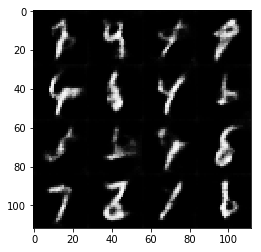

Epoch 1/2... Discriminator Loss: 1.3046... Generator Loss: 0.5151
Epoch 1/2... Discriminator Loss: 1.2208... Generator Loss: 1.1066
Epoch 1/2... Discriminator Loss: 1.1728... Generator Loss: 0.6306
Epoch 1/2... Discriminator Loss: 1.0557... Generator Loss: 1.0397
Epoch 1/2... Discriminator Loss: 1.3155... Generator Loss: 0.5721
Epoch 1/2... Discriminator Loss: 1.2282... Generator Loss: 0.9107
Epoch 1/2... Discriminator Loss: 1.2073... Generator Loss: 0.6158
Epoch 1/2... Discriminator Loss: 1.1652... Generator Loss: 1.1003
Epoch 1/2... Discriminator Loss: 1.3006... Generator Loss: 0.5434
Epoch 1/2... Discriminator Loss: 1.2902... Generator Loss: 1.2041
Epoch 1/2... Discriminator Loss: 1.4495... Generator Loss: 0.4344
Epoch 1/2... Discriminator Loss: 1.3115... Generator Loss: 1.1218
Epoch 1/2... Discriminator Loss: 1.3293... Generator Loss: 0.4904
Epoch 1/2... Discriminator Loss: 1.5068... Generator Loss: 1.5904
Epoch 1/2... Discriminator Loss: 1.5096... Generator Loss: 0.3267
Epoch 1/2.

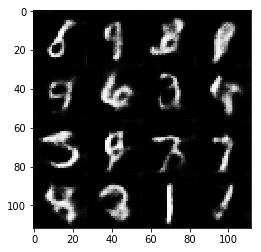

Epoch 1/2... Discriminator Loss: 1.1996... Generator Loss: 0.8586
Epoch 1/2... Discriminator Loss: 1.1718... Generator Loss: 0.7913
Epoch 1/2... Discriminator Loss: 1.1714... Generator Loss: 0.7157
Epoch 1/2... Discriminator Loss: 1.3011... Generator Loss: 0.8864
Epoch 1/2... Discriminator Loss: 1.1639... Generator Loss: 0.7444
Epoch 1/2... Discriminator Loss: 1.2201... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 1.3516... Generator Loss: 0.4584
Epoch 1/2... Discriminator Loss: 1.2968... Generator Loss: 1.4001
Epoch 1/2... Discriminator Loss: 1.4083... Generator Loss: 0.3935
Epoch 1/2... Discriminator Loss: 1.3861... Generator Loss: 1.6106
Epoch 1/2... Discriminator Loss: 1.3693... Generator Loss: 0.4038
Epoch 1/2... Discriminator Loss: 1.2668... Generator Loss: 1.1267
Epoch 1/2... Discriminator Loss: 1.1968... Generator Loss: 0.5785
Epoch 1/2... Discriminator Loss: 1.2502... Generator Loss: 0.9882
Epoch 1/2... Discriminator Loss: 1.3682... Generator Loss: 0.4759
Epoch 1/2.

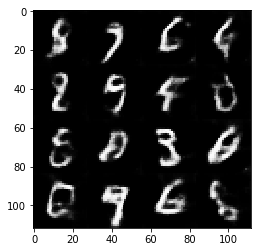

Epoch 1/2... Discriminator Loss: 1.2592... Generator Loss: 1.1571
Epoch 1/2... Discriminator Loss: 1.3575... Generator Loss: 0.4207
Epoch 1/2... Discriminator Loss: 1.3555... Generator Loss: 1.3898
Epoch 1/2... Discriminator Loss: 1.3354... Generator Loss: 0.4723
Epoch 1/2... Discriminator Loss: 1.3576... Generator Loss: 1.2907
Epoch 1/2... Discriminator Loss: 1.3378... Generator Loss: 0.4544
Epoch 1/2... Discriminator Loss: 1.3304... Generator Loss: 1.0868
Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 0.5070
Epoch 1/2... Discriminator Loss: 1.1539... Generator Loss: 1.0034
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 0.7334
Epoch 1/2... Discriminator Loss: 1.2264... Generator Loss: 1.0305
Epoch 1/2... Discriminator Loss: 1.2881... Generator Loss: 0.5400
Epoch 1/2... Discriminator Loss: 1.1323... Generator Loss: 1.1708
Epoch 1/2... Discriminator Loss: 1.1844... Generator Loss: 0.6090
Epoch 1/2... Discriminator Loss: 1.2783... Generator Loss: 1.3497
Epoch 1/2.

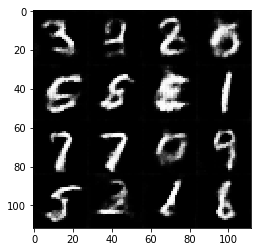

Epoch 1/2... Discriminator Loss: 1.2238... Generator Loss: 0.8720
Epoch 1/2... Discriminator Loss: 1.1590... Generator Loss: 0.8161
Epoch 1/2... Discriminator Loss: 1.1429... Generator Loss: 0.7727
Epoch 1/2... Discriminator Loss: 1.1121... Generator Loss: 0.8246
Epoch 1/2... Discriminator Loss: 1.1687... Generator Loss: 0.9061
Epoch 1/2... Discriminator Loss: 1.2140... Generator Loss: 0.6219
Epoch 1/2... Discriminator Loss: 1.1623... Generator Loss: 1.0378
Epoch 1/2... Discriminator Loss: 1.2712... Generator Loss: 0.5630
Epoch 1/2... Discriminator Loss: 1.2405... Generator Loss: 1.0128
Epoch 1/2... Discriminator Loss: 1.2137... Generator Loss: 0.5690
Epoch 1/2... Discriminator Loss: 1.1803... Generator Loss: 1.0475
Epoch 1/2... Discriminator Loss: 1.1573... Generator Loss: 0.6558
Epoch 1/2... Discriminator Loss: 1.1611... Generator Loss: 0.8145
Epoch 1/2... Discriminator Loss: 1.2390... Generator Loss: 0.8824
Epoch 1/2... Discriminator Loss: 1.2744... Generator Loss: 0.5356
Epoch 1/2.

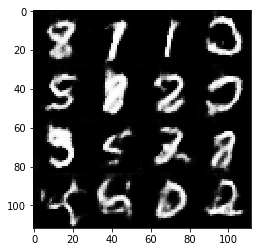

Epoch 1/2... Discriminator Loss: 1.2227... Generator Loss: 0.7135
Epoch 1/2... Discriminator Loss: 1.1682... Generator Loss: 0.6516
Epoch 1/2... Discriminator Loss: 1.2794... Generator Loss: 1.1270
Epoch 1/2... Discriminator Loss: 1.2320... Generator Loss: 0.5901
Epoch 1/2... Discriminator Loss: 1.2205... Generator Loss: 1.0708
Epoch 1/2... Discriminator Loss: 1.2491... Generator Loss: 0.6609
Epoch 1/2... Discriminator Loss: 1.2144... Generator Loss: 0.6747
Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 1.0394
Epoch 1/2... Discriminator Loss: 1.3230... Generator Loss: 0.5660
Epoch 1/2... Discriminator Loss: 1.2862... Generator Loss: 0.9983
Epoch 1/2... Discriminator Loss: 1.3131... Generator Loss: 0.5090
Epoch 1/2... Discriminator Loss: 1.2299... Generator Loss: 1.4477
Epoch 1/2... Discriminator Loss: 1.2843... Generator Loss: 0.4817
Epoch 1/2... Discriminator Loss: 1.2372... Generator Loss: 1.0958
Epoch 1/2... Discriminator Loss: 1.2417... Generator Loss: 0.5905
Epoch 1/2.

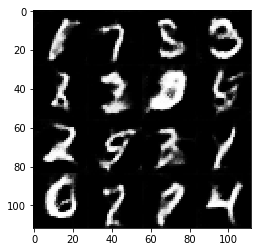

Epoch 1/2... Discriminator Loss: 1.2954... Generator Loss: 0.4744
Epoch 1/2... Discriminator Loss: 1.3046... Generator Loss: 1.4157
Epoch 1/2... Discriminator Loss: 1.4910... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.4610... Generator Loss: 1.6674
Epoch 1/2... Discriminator Loss: 1.3195... Generator Loss: 0.4657
Epoch 1/2... Discriminator Loss: 1.1312... Generator Loss: 0.9777
Epoch 1/2... Discriminator Loss: 1.2384... Generator Loss: 0.7970
Epoch 1/2... Discriminator Loss: 1.1673... Generator Loss: 0.7196
Epoch 1/2... Discriminator Loss: 1.1681... Generator Loss: 0.8191
Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 0.6096
Epoch 1/2... Discriminator Loss: 1.1391... Generator Loss: 1.3260
Epoch 1/2... Discriminator Loss: 1.5849... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 1.4297... Generator Loss: 1.7902
Epoch 1/2... Discriminator Loss: 1.2879... Generator Loss: 0.4757
Epoch 1/2... Discriminator Loss: 1.1355... Generator Loss: 1.0088
Epoch 1/2.

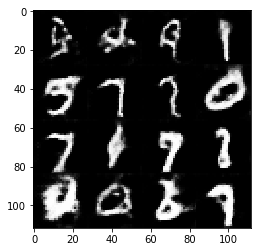

Epoch 1/2... Discriminator Loss: 1.2332... Generator Loss: 0.7870
Epoch 1/2... Discriminator Loss: 1.2326... Generator Loss: 0.5535
Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 1.3678
Epoch 1/2... Discriminator Loss: 1.5930... Generator Loss: 0.2925
Epoch 1/2... Discriminator Loss: 1.4711... Generator Loss: 1.7965
Epoch 1/2... Discriminator Loss: 1.4629... Generator Loss: 0.3631
Epoch 1/2... Discriminator Loss: 1.3452... Generator Loss: 1.1074
Epoch 1/2... Discriminator Loss: 1.3300... Generator Loss: 0.4771
Epoch 1/2... Discriminator Loss: 1.2385... Generator Loss: 1.1378
Epoch 1/2... Discriminator Loss: 1.2428... Generator Loss: 0.5409
Epoch 1/2... Discriminator Loss: 1.2257... Generator Loss: 1.1104
Epoch 1/2... Discriminator Loss: 1.2882... Generator Loss: 0.5549
Epoch 1/2... Discriminator Loss: 1.1700... Generator Loss: 0.8856
Epoch 1/2... Discriminator Loss: 1.0388... Generator Loss: 0.8885
Epoch 1/2... Discriminator Loss: 1.1975... Generator Loss: 0.6477
Epoch 1/2.

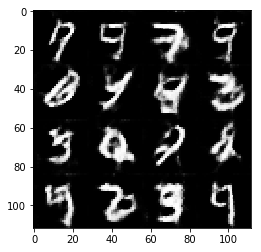

Epoch 1/2... Discriminator Loss: 1.2300... Generator Loss: 1.2304
Epoch 1/2... Discriminator Loss: 1.5668... Generator Loss: 0.2995
Epoch 1/2... Discriminator Loss: 1.5130... Generator Loss: 1.8505
Epoch 1/2... Discriminator Loss: 1.4075... Generator Loss: 0.3627
Epoch 1/2... Discriminator Loss: 1.3309... Generator Loss: 1.3420
Epoch 1/2... Discriminator Loss: 1.3491... Generator Loss: 0.4488
Epoch 1/2... Discriminator Loss: 1.1139... Generator Loss: 1.0876
Epoch 1/2... Discriminator Loss: 1.2546... Generator Loss: 0.7172
Epoch 1/2... Discriminator Loss: 1.3761... Generator Loss: 0.5835
Epoch 1/2... Discriminator Loss: 1.2496... Generator Loss: 0.7516
Epoch 1/2... Discriminator Loss: 1.1105... Generator Loss: 0.8620
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.6502
Epoch 1/2... Discriminator Loss: 1.2140... Generator Loss: 1.0161
Epoch 1/2... Discriminator Loss: 1.5444... Generator Loss: 0.3277
Epoch 1/2... Discriminator Loss: 1.5064... Generator Loss: 1.8992
Epoch 1/2.

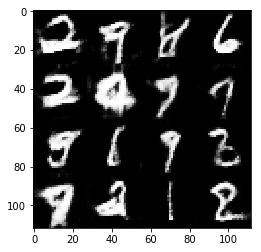

Epoch 1/2... Discriminator Loss: 1.1164... Generator Loss: 1.0013
Epoch 1/2... Discriminator Loss: 1.0929... Generator Loss: 0.7369
Epoch 1/2... Discriminator Loss: 1.1905... Generator Loss: 0.8028
Epoch 1/2... Discriminator Loss: 1.2192... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 1.1509... Generator Loss: 0.6823
Epoch 1/2... Discriminator Loss: 1.0569... Generator Loss: 0.9683
Epoch 1/2... Discriminator Loss: 1.2514... Generator Loss: 0.5888
Epoch 1/2... Discriminator Loss: 1.4027... Generator Loss: 1.2248
Epoch 1/2... Discriminator Loss: 1.8044... Generator Loss: 0.2360
Epoch 1/2... Discriminator Loss: 2.0303... Generator Loss: 2.1825
Epoch 1/2... Discriminator Loss: 1.6412... Generator Loss: 0.3047
Epoch 1/2... Discriminator Loss: 1.5742... Generator Loss: 1.7564
Epoch 1/2... Discriminator Loss: 1.6414... Generator Loss: 0.3103
Epoch 1/2... Discriminator Loss: 1.1972... Generator Loss: 1.1996
Epoch 1/2... Discriminator Loss: 1.1976... Generator Loss: 0.7235
Epoch 1/2.

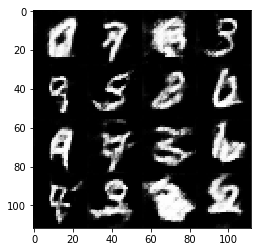

Epoch 1/2... Discriminator Loss: 1.1522... Generator Loss: 0.7558
Epoch 1/2... Discriminator Loss: 1.2022... Generator Loss: 0.8803
Epoch 1/2... Discriminator Loss: 1.0631... Generator Loss: 0.7622
Epoch 1/2... Discriminator Loss: 1.1648... Generator Loss: 0.8682
Epoch 1/2... Discriminator Loss: 1.2853... Generator Loss: 0.5782
Epoch 1/2... Discriminator Loss: 1.2754... Generator Loss: 1.1173
Epoch 1/2... Discriminator Loss: 1.1979... Generator Loss: 0.6335
Epoch 1/2... Discriminator Loss: 1.1246... Generator Loss: 0.8099
Epoch 1/2... Discriminator Loss: 1.1192... Generator Loss: 0.9845
Epoch 1/2... Discriminator Loss: 1.2422... Generator Loss: 0.4919
Epoch 1/2... Discriminator Loss: 1.2839... Generator Loss: 1.3410
Epoch 1/2... Discriminator Loss: 1.2629... Generator Loss: 0.5066
Epoch 1/2... Discriminator Loss: 1.2211... Generator Loss: 1.0125
Epoch 1/2... Discriminator Loss: 1.1879... Generator Loss: 0.5886
Epoch 1/2... Discriminator Loss: 1.0337... Generator Loss: 0.9555
Epoch 1/2.

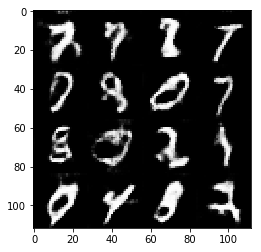

Epoch 1/2... Discriminator Loss: 1.3082... Generator Loss: 1.0042
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.6131
Epoch 1/2... Discriminator Loss: 1.1768... Generator Loss: 0.9900
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 0.7972
Epoch 1/2... Discriminator Loss: 1.0901... Generator Loss: 0.6853
Epoch 1/2... Discriminator Loss: 1.0943... Generator Loss: 1.0690
Epoch 1/2... Discriminator Loss: 1.2160... Generator Loss: 0.6469
Epoch 1/2... Discriminator Loss: 1.1503... Generator Loss: 0.8808
Epoch 1/2... Discriminator Loss: 1.2818... Generator Loss: 0.5240
Epoch 1/2... Discriminator Loss: 1.1596... Generator Loss: 1.0604
Epoch 1/2... Discriminator Loss: 1.2107... Generator Loss: 0.6227
Epoch 1/2... Discriminator Loss: 1.0816... Generator Loss: 1.0107
Epoch 1/2... Discriminator Loss: 1.1485... Generator Loss: 0.5736
Epoch 1/2... Discriminator Loss: 1.2822... Generator Loss: 1.4319
Epoch 1/2... Discriminator Loss: 1.6448... Generator Loss: 0.2989
Epoch 1/2.

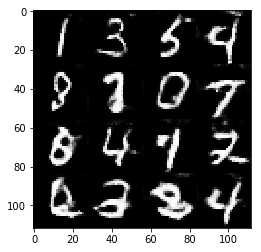

Epoch 1/2... Discriminator Loss: 1.0877... Generator Loss: 0.9159
Epoch 1/2... Discriminator Loss: 1.1536... Generator Loss: 0.6373
Epoch 1/2... Discriminator Loss: 1.1567... Generator Loss: 1.1571
Epoch 1/2... Discriminator Loss: 1.3226... Generator Loss: 0.4597
Epoch 1/2... Discriminator Loss: 1.2744... Generator Loss: 1.2001
Epoch 1/2... Discriminator Loss: 1.4631... Generator Loss: 0.3699
Epoch 1/2... Discriminator Loss: 2.2283... Generator Loss: 2.5327
Epoch 1/2... Discriminator Loss: 1.8667... Generator Loss: 0.2291
Epoch 1/2... Discriminator Loss: 1.7524... Generator Loss: 2.0051
Epoch 1/2... Discriminator Loss: 1.7448... Generator Loss: 0.2546
Epoch 1/2... Discriminator Loss: 1.2989... Generator Loss: 1.3022
Epoch 1/2... Discriminator Loss: 1.3658... Generator Loss: 0.4944
Epoch 1/2... Discriminator Loss: 1.3335... Generator Loss: 0.8983
Epoch 1/2... Discriminator Loss: 1.4557... Generator Loss: 0.4951
Epoch 1/2... Discriminator Loss: 1.2483... Generator Loss: 0.8873
Epoch 1/2.

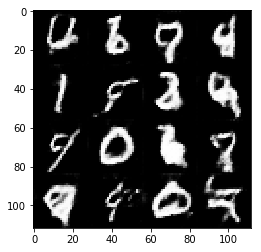

Epoch 1/2... Discriminator Loss: 1.3772... Generator Loss: 0.4366
Epoch 1/2... Discriminator Loss: 1.2526... Generator Loss: 1.3858
Epoch 1/2... Discriminator Loss: 1.3894... Generator Loss: 0.4031
Epoch 1/2... Discriminator Loss: 1.3136... Generator Loss: 1.2928
Epoch 1/2... Discriminator Loss: 1.1218... Generator Loss: 0.6491
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.8792
Epoch 1/2... Discriminator Loss: 1.3021... Generator Loss: 0.5895
Epoch 1/2... Discriminator Loss: 1.2301... Generator Loss: 0.8605
Epoch 1/2... Discriminator Loss: 1.1985... Generator Loss: 0.6382
Epoch 1/2... Discriminator Loss: 1.3619... Generator Loss: 1.2281
Epoch 1/2... Discriminator Loss: 1.5398... Generator Loss: 0.3291
Epoch 1/2... Discriminator Loss: 1.5047... Generator Loss: 1.6129
Epoch 1/2... Discriminator Loss: 1.3946... Generator Loss: 0.4097
Epoch 1/2... Discriminator Loss: 1.2907... Generator Loss: 1.0354
Epoch 1/2... Discriminator Loss: 1.1664... Generator Loss: 0.7178
Epoch 1/2.

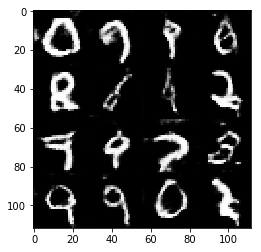

Epoch 1/2... Discriminator Loss: 1.1817... Generator Loss: 0.9153
Epoch 1/2... Discriminator Loss: 1.1994... Generator Loss: 0.7173
Epoch 1/2... Discriminator Loss: 1.2378... Generator Loss: 0.5602
Epoch 1/2... Discriminator Loss: 1.2265... Generator Loss: 1.0770
Epoch 1/2... Discriminator Loss: 1.3037... Generator Loss: 0.5438
Epoch 1/2... Discriminator Loss: 1.2420... Generator Loss: 0.9858
Epoch 1/2... Discriminator Loss: 1.3018... Generator Loss: 0.5161
Epoch 1/2... Discriminator Loss: 1.2724... Generator Loss: 0.8920
Epoch 1/2... Discriminator Loss: 1.2130... Generator Loss: 0.6457
Epoch 1/2... Discriminator Loss: 1.1376... Generator Loss: 1.0304
Epoch 1/2... Discriminator Loss: 1.2489... Generator Loss: 0.5882
Epoch 1/2... Discriminator Loss: 1.1546... Generator Loss: 1.0465
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.6590
Epoch 1/2... Discriminator Loss: 1.1373... Generator Loss: 0.8366
Epoch 1/2... Discriminator Loss: 1.0983... Generator Loss: 0.7258
Epoch 1/2.

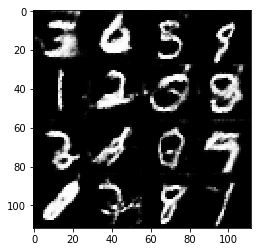

Epoch 1/2... Discriminator Loss: 1.2568... Generator Loss: 0.5093
Epoch 1/2... Discriminator Loss: 1.1946... Generator Loss: 1.2409
Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.6278
Epoch 1/2... Discriminator Loss: 1.1379... Generator Loss: 0.8350
Epoch 1/2... Discriminator Loss: 1.1209... Generator Loss: 1.1076
Epoch 1/2... Discriminator Loss: 1.3410... Generator Loss: 0.4356
Epoch 1/2... Discriminator Loss: 1.2593... Generator Loss: 1.3567
Epoch 1/2... Discriminator Loss: 1.4120... Generator Loss: 0.4102
Epoch 1/2... Discriminator Loss: 1.2733... Generator Loss: 1.2294
Epoch 1/2... Discriminator Loss: 1.2423... Generator Loss: 0.5546
Epoch 1/2... Discriminator Loss: 1.1444... Generator Loss: 0.9780
Epoch 1/2... Discriminator Loss: 1.2572... Generator Loss: 0.5785
Epoch 1/2... Discriminator Loss: 1.1506... Generator Loss: 0.8819
Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 0.6741
Epoch 1/2... Discriminator Loss: 1.1096... Generator Loss: 0.9398
Epoch 1/2.

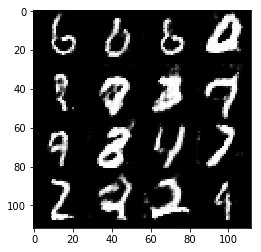

Epoch 1/2... Discriminator Loss: 1.1425... Generator Loss: 1.2369
Epoch 1/2... Discriminator Loss: 1.3549... Generator Loss: 0.5255
Epoch 1/2... Discriminator Loss: 1.2789... Generator Loss: 0.7713
Epoch 1/2... Discriminator Loss: 1.2012... Generator Loss: 0.8484
Epoch 1/2... Discriminator Loss: 1.2477... Generator Loss: 0.7104
Epoch 1/2... Discriminator Loss: 1.0390... Generator Loss: 0.8298
Epoch 1/2... Discriminator Loss: 1.1168... Generator Loss: 0.8077
Epoch 1/2... Discriminator Loss: 1.1576... Generator Loss: 0.7769
Epoch 1/2... Discriminator Loss: 1.2437... Generator Loss: 0.5995
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 1.0600
Epoch 1/2... Discriminator Loss: 1.2493... Generator Loss: 0.5528
Epoch 1/2... Discriminator Loss: 1.1266... Generator Loss: 1.1335
Epoch 1/2... Discriminator Loss: 1.1618... Generator Loss: 0.6473
Epoch 1/2... Discriminator Loss: 1.1356... Generator Loss: 1.0604
Epoch 1/2... Discriminator Loss: 1.1854... Generator Loss: 0.5478
Epoch 1/2.

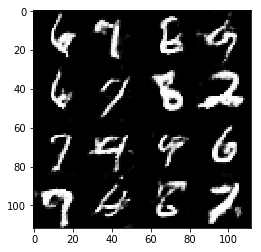

Epoch 1/2... Discriminator Loss: 1.4402... Generator Loss: 0.3669
Epoch 1/2... Discriminator Loss: 1.4592... Generator Loss: 1.4662
Epoch 1/2... Discriminator Loss: 1.3778... Generator Loss: 0.4199
Epoch 1/2... Discriminator Loss: 1.3384... Generator Loss: 1.1968
Epoch 1/2... Discriminator Loss: 1.2783... Generator Loss: 0.4946
Epoch 1/2... Discriminator Loss: 1.1343... Generator Loss: 1.1711
Epoch 1/2... Discriminator Loss: 1.3660... Generator Loss: 0.4663
Epoch 1/2... Discriminator Loss: 1.1683... Generator Loss: 1.0282
Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 0.7581
Epoch 1/2... Discriminator Loss: 1.3676... Generator Loss: 0.4484
Epoch 1/2... Discriminator Loss: 1.2717... Generator Loss: 1.4645
Epoch 1/2... Discriminator Loss: 1.3260... Generator Loss: 0.4220
Epoch 1/2... Discriminator Loss: 1.0912... Generator Loss: 1.2988
Epoch 1/2... Discriminator Loss: 1.1717... Generator Loss: 0.5880
Epoch 1/2... Discriminator Loss: 1.1973... Generator Loss: 0.9076
Epoch 1/2.

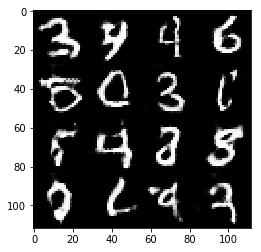

Epoch 1/2... Discriminator Loss: 1.0928... Generator Loss: 1.0071
Epoch 1/2... Discriminator Loss: 1.0046... Generator Loss: 0.8020
Epoch 1/2... Discriminator Loss: 1.1063... Generator Loss: 0.8169
Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.6932
Epoch 1/2... Discriminator Loss: 1.1519... Generator Loss: 0.7761
Epoch 1/2... Discriminator Loss: 1.2646... Generator Loss: 0.7221
Epoch 1/2... Discriminator Loss: 1.1904... Generator Loss: 0.5949
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 1.2751
Epoch 1/2... Discriminator Loss: 1.4470... Generator Loss: 0.3514
Epoch 1/2... Discriminator Loss: 1.2944... Generator Loss: 1.5561
Epoch 1/2... Discriminator Loss: 1.3763... Generator Loss: 0.4616
Epoch 1/2... Discriminator Loss: 1.1149... Generator Loss: 1.2845
Epoch 1/2... Discriminator Loss: 1.2194... Generator Loss: 0.5201
Epoch 1/2... Discriminator Loss: 1.2891... Generator Loss: 1.1085
Epoch 1/2... Discriminator Loss: 1.2909... Generator Loss: 0.5150
Epoch 1/2.

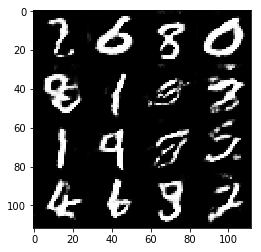

Epoch 1/2... Discriminator Loss: 1.0990... Generator Loss: 0.7617
Epoch 1/2... Discriminator Loss: 0.9725... Generator Loss: 0.7836
Epoch 1/2... Discriminator Loss: 1.0067... Generator Loss: 0.9162
Epoch 1/2... Discriminator Loss: 1.0172... Generator Loss: 0.9144
Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 0.6501
Epoch 1/2... Discriminator Loss: 1.1650... Generator Loss: 1.7821
Epoch 1/2... Discriminator Loss: 1.6222... Generator Loss: 0.3103
Epoch 1/2... Discriminator Loss: 1.7210... Generator Loss: 2.0017
Epoch 1/2... Discriminator Loss: 1.5545... Generator Loss: 0.3321
Epoch 1/2... Discriminator Loss: 1.8504... Generator Loss: 2.3855
Epoch 1/2... Discriminator Loss: 1.9751... Generator Loss: 0.1881
Epoch 1/2... Discriminator Loss: 1.3302... Generator Loss: 1.3696
Epoch 1/2... Discriminator Loss: 1.2745... Generator Loss: 0.5951
Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 0.8499
Epoch 1/2... Discriminator Loss: 1.1235... Generator Loss: 0.8820
Epoch 1/2.

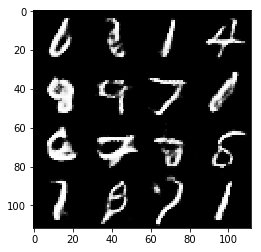

Epoch 1/2... Discriminator Loss: 1.5154... Generator Loss: 2.2247
Epoch 1/2... Discriminator Loss: 1.4599... Generator Loss: 0.3745
Epoch 1/2... Discriminator Loss: 1.1065... Generator Loss: 1.4015
Epoch 1/2... Discriminator Loss: 1.2470... Generator Loss: 0.6038
Epoch 1/2... Discriminator Loss: 1.1727... Generator Loss: 0.8090
Epoch 1/2... Discriminator Loss: 1.1308... Generator Loss: 0.9165
Epoch 1/2... Discriminator Loss: 1.1651... Generator Loss: 0.7041
Epoch 1/2... Discriminator Loss: 1.1392... Generator Loss: 0.9169
Epoch 1/2... Discriminator Loss: 1.2380... Generator Loss: 0.5344
Epoch 1/2... Discriminator Loss: 1.1099... Generator Loss: 1.0236
Epoch 1/2... Discriminator Loss: 1.1695... Generator Loss: 0.7003
Epoch 1/2... Discriminator Loss: 1.0788... Generator Loss: 0.9407
Epoch 1/2... Discriminator Loss: 1.1097... Generator Loss: 0.6583
Epoch 1/2... Discriminator Loss: 1.1080... Generator Loss: 1.1304
Epoch 1/2... Discriminator Loss: 1.1545... Generator Loss: 0.6696
Epoch 1/2.

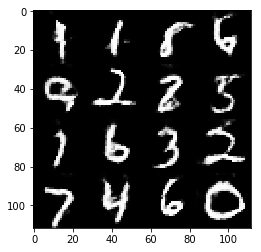

Epoch 1/2... Discriminator Loss: 1.0965... Generator Loss: 0.7707
Epoch 1/2... Discriminator Loss: 1.2673... Generator Loss: 0.5132
Epoch 1/2... Discriminator Loss: 1.1759... Generator Loss: 1.5435
Epoch 1/2... Discriminator Loss: 1.5260... Generator Loss: 0.3246
Epoch 1/2... Discriminator Loss: 1.2437... Generator Loss: 1.6811
Epoch 1/2... Discriminator Loss: 1.1704... Generator Loss: 0.5914
Epoch 1/2... Discriminator Loss: 1.1609... Generator Loss: 0.7456
Epoch 1/2... Discriminator Loss: 1.1473... Generator Loss: 0.7843
Epoch 1/2... Discriminator Loss: 1.1114... Generator Loss: 0.8398
Epoch 1/2... Discriminator Loss: 1.0709... Generator Loss: 0.7645
Epoch 1/2... Discriminator Loss: 1.0978... Generator Loss: 1.0220
Epoch 1/2... Discriminator Loss: 1.3116... Generator Loss: 0.4773
Epoch 1/2... Discriminator Loss: 1.1704... Generator Loss: 1.5900
Epoch 1/2... Discriminator Loss: 1.6655... Generator Loss: 0.2978
Epoch 1/2... Discriminator Loss: 1.4607... Generator Loss: 1.7858
Epoch 1/2.

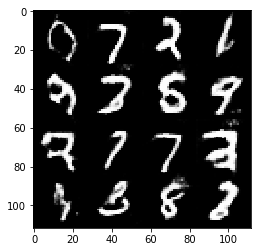

Epoch 1/2... Discriminator Loss: 1.1513... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 1.1947... Generator Loss: 0.7545
Epoch 1/2... Discriminator Loss: 1.1128... Generator Loss: 0.7122
Epoch 1/2... Discriminator Loss: 1.1664... Generator Loss: 0.8157
Epoch 1/2... Discriminator Loss: 1.0864... Generator Loss: 1.0631
Epoch 1/2... Discriminator Loss: 1.4691... Generator Loss: 0.3489
Epoch 1/2... Discriminator Loss: 1.4052... Generator Loss: 1.8720
Epoch 1/2... Discriminator Loss: 1.3334... Generator Loss: 0.4571
Epoch 1/2... Discriminator Loss: 1.1750... Generator Loss: 1.2413
Epoch 1/2... Discriminator Loss: 1.2515... Generator Loss: 0.5964
Epoch 1/2... Discriminator Loss: 1.0667... Generator Loss: 1.0445
Epoch 1/2... Discriminator Loss: 1.2287... Generator Loss: 0.6422
Epoch 1/2... Discriminator Loss: 1.2193... Generator Loss: 0.8747
Epoch 1/2... Discriminator Loss: 1.1744... Generator Loss: 0.6459
Epoch 1/2... Discriminator Loss: 1.1373... Generator Loss: 0.8692
Epoch 1/2.

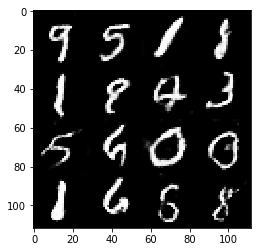

Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.9621
Epoch 1/2... Discriminator Loss: 1.2186... Generator Loss: 0.5285
Epoch 1/2... Discriminator Loss: 1.3768... Generator Loss: 1.5849
Epoch 1/2... Discriminator Loss: 1.4097... Generator Loss: 0.3860
Epoch 1/2... Discriminator Loss: 1.4126... Generator Loss: 1.6769
Epoch 1/2... Discriminator Loss: 1.4734... Generator Loss: 0.3716
Epoch 1/2... Discriminator Loss: 1.3306... Generator Loss: 1.3861
Epoch 1/2... Discriminator Loss: 1.2672... Generator Loss: 0.4663
Epoch 1/2... Discriminator Loss: 1.1378... Generator Loss: 1.1511
Epoch 1/2... Discriminator Loss: 1.2448... Generator Loss: 0.5605
Epoch 1/2... Discriminator Loss: 1.2129... Generator Loss: 0.9435
Epoch 1/2... Discriminator Loss: 1.0684... Generator Loss: 0.6773
Epoch 1/2... Discriminator Loss: 1.0746... Generator Loss: 0.9728
Epoch 1/2... Discriminator Loss: 1.1938... Generator Loss: 0.5310
Epoch 1/2... Discriminator Loss: 1.3360... Generator Loss: 1.3797
Epoch 1/2.

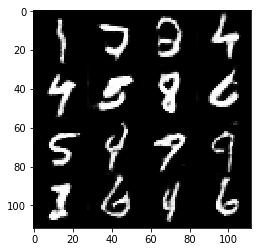

Epoch 1/2... Discriminator Loss: 1.1092... Generator Loss: 0.9976
Epoch 1/2... Discriminator Loss: 1.1955... Generator Loss: 0.7770
Epoch 1/2... Discriminator Loss: 1.1408... Generator Loss: 0.7329
Epoch 1/2... Discriminator Loss: 1.1802... Generator Loss: 0.8886
Epoch 1/2... Discriminator Loss: 1.2457... Generator Loss: 0.5422
Epoch 1/2... Discriminator Loss: 1.3000... Generator Loss: 1.5661
Epoch 1/2... Discriminator Loss: 1.3480... Generator Loss: 0.4116
Epoch 1/2... Discriminator Loss: 1.4180... Generator Loss: 1.6453
Epoch 1/2... Discriminator Loss: 1.3769... Generator Loss: 0.4163
Epoch 1/2... Discriminator Loss: 1.1715... Generator Loss: 1.2229
Epoch 1/2... Discriminator Loss: 1.1971... Generator Loss: 0.6334
Epoch 1/2... Discriminator Loss: 1.2755... Generator Loss: 0.7340
Epoch 1/2... Discriminator Loss: 1.1987... Generator Loss: 0.7527
Epoch 1/2... Discriminator Loss: 1.2066... Generator Loss: 0.7171
Epoch 1/2... Discriminator Loss: 1.1652... Generator Loss: 0.9502
Epoch 1/2.

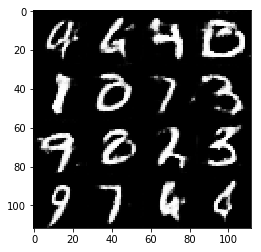

Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 1.2360
Epoch 1/2... Discriminator Loss: 1.1298... Generator Loss: 0.6440
Epoch 1/2... Discriminator Loss: 1.1560... Generator Loss: 0.8776
Epoch 1/2... Discriminator Loss: 1.3731... Generator Loss: 0.4886
Epoch 1/2... Discriminator Loss: 1.2087... Generator Loss: 1.2169
Epoch 1/2... Discriminator Loss: 1.2828... Generator Loss: 0.5140
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 1.1312
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.6772
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 0.8068
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 0.6411
Epoch 1/2... Discriminator Loss: 1.2315... Generator Loss: 1.2166
Epoch 1/2... Discriminator Loss: 1.3789... Generator Loss: 0.4134
Epoch 1/2... Discriminator Loss: 1.2152... Generator Loss: 1.3514
Epoch 1/2... Discriminator Loss: 1.4130... Generator Loss: 0.3897
Epoch 1/2... Discriminator Loss: 1.1563... Generator Loss: 0.9588
Epoch 1/2.

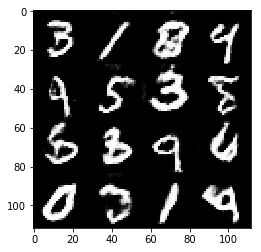

Epoch 1/2... Discriminator Loss: 1.3157... Generator Loss: 0.4449
Epoch 1/2... Discriminator Loss: 1.2715... Generator Loss: 1.1549
Epoch 1/2... Discriminator Loss: 1.2013... Generator Loss: 0.6442
Epoch 1/2... Discriminator Loss: 1.1375... Generator Loss: 0.7545
Epoch 1/2... Discriminator Loss: 1.1639... Generator Loss: 0.9175
Epoch 1/2... Discriminator Loss: 1.1737... Generator Loss: 0.5995
Epoch 1/2... Discriminator Loss: 1.0983... Generator Loss: 0.9256
Epoch 1/2... Discriminator Loss: 1.2178... Generator Loss: 0.5681
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 1.4219
Epoch 1/2... Discriminator Loss: 1.4051... Generator Loss: 0.3776
Epoch 1/2... Discriminator Loss: 1.4911... Generator Loss: 1.8834
Epoch 1/2... Discriminator Loss: 1.4761... Generator Loss: 0.3415
Epoch 1/2... Discriminator Loss: 1.3447... Generator Loss: 1.5404
Epoch 1/2... Discriminator Loss: 1.1659... Generator Loss: 0.5646
Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 1.0255
Epoch 1/2.

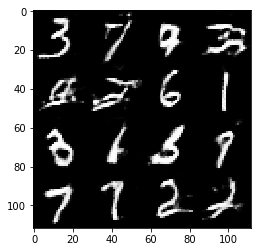

Epoch 1/2... Discriminator Loss: 1.2830... Generator Loss: 0.4886
Epoch 1/2... Discriminator Loss: 1.0955... Generator Loss: 1.7367
Epoch 1/2... Discriminator Loss: 1.4016... Generator Loss: 0.3840
Epoch 1/2... Discriminator Loss: 1.4071... Generator Loss: 1.7688
Epoch 1/2... Discriminator Loss: 1.3954... Generator Loss: 0.3813
Epoch 1/2... Discriminator Loss: 1.2426... Generator Loss: 1.5500
Epoch 1/2... Discriminator Loss: 1.3328... Generator Loss: 0.4524
Epoch 1/2... Discriminator Loss: 1.0842... Generator Loss: 0.9854
Epoch 1/2... Discriminator Loss: 1.0015... Generator Loss: 0.8809
Epoch 1/2... Discriminator Loss: 1.1038... Generator Loss: 0.7374
Epoch 1/2... Discriminator Loss: 1.1149... Generator Loss: 0.8501
Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 0.9808
Epoch 1/2... Discriminator Loss: 1.2596... Generator Loss: 0.5174
Epoch 1/2... Discriminator Loss: 1.1148... Generator Loss: 1.2432
Epoch 1/2... Discriminator Loss: 1.3514... Generator Loss: 0.4515
Epoch 1/2.

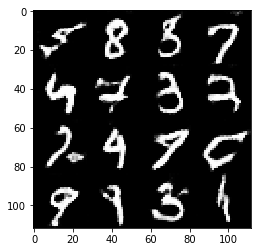

Epoch 1/2... Discriminator Loss: 1.1317... Generator Loss: 1.2354
Epoch 1/2... Discriminator Loss: 1.2385... Generator Loss: 0.5079
Epoch 1/2... Discriminator Loss: 1.1708... Generator Loss: 1.1104
Epoch 1/2... Discriminator Loss: 1.1401... Generator Loss: 0.7607
Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 0.6835
Epoch 1/2... Discriminator Loss: 1.0365... Generator Loss: 0.7761
Epoch 1/2... Discriminator Loss: 1.1296... Generator Loss: 1.1124
Epoch 1/2... Discriminator Loss: 1.2449... Generator Loss: 0.5045
Epoch 1/2... Discriminator Loss: 1.2981... Generator Loss: 1.1083
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 0.5360
Epoch 1/2... Discriminator Loss: 1.1275... Generator Loss: 1.3470
Epoch 1/2... Discriminator Loss: 1.2338... Generator Loss: 0.4992
Epoch 1/2... Discriminator Loss: 1.0365... Generator Loss: 1.0605
Epoch 1/2... Discriminator Loss: 1.0050... Generator Loss: 0.8050
Epoch 1/2... Discriminator Loss: 1.1333... Generator Loss: 0.6256
Epoch 1/2.

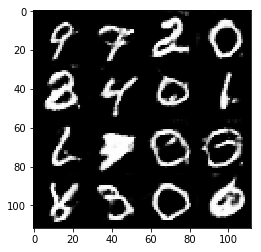

Epoch 1/2... Discriminator Loss: 1.4497... Generator Loss: 1.8171
Epoch 1/2... Discriminator Loss: 1.6094... Generator Loss: 0.3024
Epoch 1/2... Discriminator Loss: 1.7657... Generator Loss: 1.8022
Epoch 1/2... Discriminator Loss: 1.7517... Generator Loss: 0.2833
Epoch 1/2... Discriminator Loss: 1.2604... Generator Loss: 1.3428
Epoch 1/2... Discriminator Loss: 1.2486... Generator Loss: 0.6046
Epoch 1/2... Discriminator Loss: 1.1730... Generator Loss: 0.9296
Epoch 1/2... Discriminator Loss: 1.1006... Generator Loss: 0.7138
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 0.9696
Epoch 1/2... Discriminator Loss: 1.2497... Generator Loss: 0.5961
Epoch 1/2... Discriminator Loss: 1.0982... Generator Loss: 0.9051
Epoch 1/2... Discriminator Loss: 1.2361... Generator Loss: 0.6172
Epoch 1/2... Discriminator Loss: 1.2440... Generator Loss: 1.2562
Epoch 1/2... Discriminator Loss: 1.4956... Generator Loss: 0.3387
Epoch 1/2... Discriminator Loss: 1.2327... Generator Loss: 1.4175
Epoch 1/2.

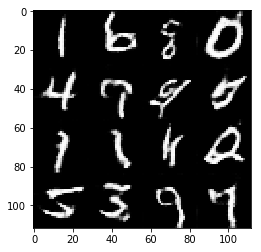

Epoch 1/2... Discriminator Loss: 1.1441... Generator Loss: 0.8361
Epoch 1/2... Discriminator Loss: 1.0874... Generator Loss: 0.7341
Epoch 1/2... Discriminator Loss: 0.9741... Generator Loss: 1.0977
Epoch 1/2... Discriminator Loss: 1.1227... Generator Loss: 0.7044
Epoch 1/2... Discriminator Loss: 1.2816... Generator Loss: 0.5130
Epoch 1/2... Discriminator Loss: 1.1436... Generator Loss: 1.4026
Epoch 1/2... Discriminator Loss: 1.4972... Generator Loss: 0.3572
Epoch 1/2... Discriminator Loss: 1.2621... Generator Loss: 1.1499
Epoch 1/2... Discriminator Loss: 1.1546... Generator Loss: 0.6487
Epoch 1/2... Discriminator Loss: 1.2455... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 1.1939... Generator Loss: 1.0999
Epoch 1/2... Discriminator Loss: 1.3671... Generator Loss: 0.4058
Epoch 1/2... Discriminator Loss: 1.2287... Generator Loss: 1.5657
Epoch 1/2... Discriminator Loss: 1.5351... Generator Loss: 0.3506
Epoch 1/2... Discriminator Loss: 1.2607... Generator Loss: 1.6016
Epoch 1/2.

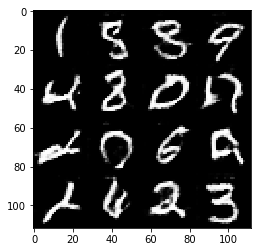

Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 1.1546
Epoch 1/2... Discriminator Loss: 1.2776... Generator Loss: 0.5338
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 1.2979
Epoch 1/2... Discriminator Loss: 1.2702... Generator Loss: 0.4628
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 1.4985
Epoch 1/2... Discriminator Loss: 1.2293... Generator Loss: 0.5010
Epoch 1/2... Discriminator Loss: 1.1395... Generator Loss: 1.0869
Epoch 1/2... Discriminator Loss: 1.2516... Generator Loss: 0.6416
Epoch 1/2... Discriminator Loss: 1.0545... Generator Loss: 0.9243
Epoch 1/2... Discriminator Loss: 1.1860... Generator Loss: 0.7891
Epoch 1/2... Discriminator Loss: 1.1402... Generator Loss: 0.7204
Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 0.8508
Epoch 1/2... Discriminator Loss: 1.1048... Generator Loss: 0.9237
Epoch 1/2... Discriminator Loss: 1.1794... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 1.2119... Generator Loss: 1.0389
Epoch 1/2.

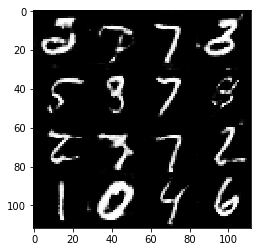

Epoch 1/2... Discriminator Loss: 0.9442... Generator Loss: 1.0754
Epoch 1/2... Discriminator Loss: 1.1129... Generator Loss: 0.7549
Epoch 1/2... Discriminator Loss: 1.1601... Generator Loss: 0.7876
Epoch 1/2... Discriminator Loss: 1.2030... Generator Loss: 0.5446
Epoch 1/2... Discriminator Loss: 1.1433... Generator Loss: 1.4255
Epoch 1/2... Discriminator Loss: 1.3596... Generator Loss: 0.4171
Epoch 1/2... Discriminator Loss: 1.3810... Generator Loss: 1.6724
Epoch 1/2... Discriminator Loss: 1.4130... Generator Loss: 0.3892
Epoch 1/2... Discriminator Loss: 1.2712... Generator Loss: 1.3793
Epoch 1/2... Discriminator Loss: 1.3913... Generator Loss: 0.4360
Epoch 1/2... Discriminator Loss: 1.1000... Generator Loss: 1.1871
Epoch 1/2... Discriminator Loss: 1.3311... Generator Loss: 0.4445
Epoch 1/2... Discriminator Loss: 1.1759... Generator Loss: 1.3478
Epoch 1/2... Discriminator Loss: 1.2519... Generator Loss: 0.4945
Epoch 1/2... Discriminator Loss: 0.9892... Generator Loss: 1.3733
Epoch 1/2.

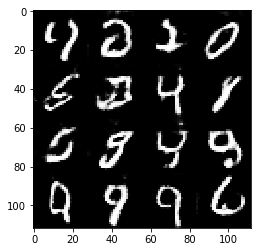

Epoch 1/2... Discriminator Loss: 1.1220... Generator Loss: 1.1741
Epoch 1/2... Discriminator Loss: 1.1089... Generator Loss: 0.6880
Epoch 1/2... Discriminator Loss: 1.1869... Generator Loss: 0.7548
Epoch 1/2... Discriminator Loss: 0.9746... Generator Loss: 1.0049
Epoch 1/2... Discriminator Loss: 1.0731... Generator Loss: 0.7221
Epoch 1/2... Discriminator Loss: 0.9246... Generator Loss: 1.0752
Epoch 1/2... Discriminator Loss: 1.1026... Generator Loss: 0.6190
Epoch 1/2... Discriminator Loss: 1.1435... Generator Loss: 0.8647
Epoch 1/2... Discriminator Loss: 0.9955... Generator Loss: 0.7785
Epoch 1/2... Discriminator Loss: 1.1513... Generator Loss: 0.7303
Epoch 1/2... Discriminator Loss: 1.0197... Generator Loss: 0.7721
Epoch 1/2... Discriminator Loss: 1.0860... Generator Loss: 1.3585
Epoch 1/2... Discriminator Loss: 1.4842... Generator Loss: 0.3513
Epoch 1/2... Discriminator Loss: 1.3176... Generator Loss: 1.7011
Epoch 1/2... Discriminator Loss: 1.3713... Generator Loss: 0.3892
Epoch 1/2.

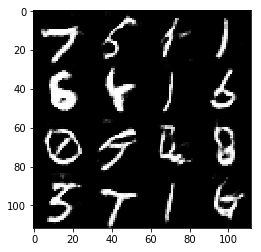

Epoch 1/2... Discriminator Loss: 1.5824... Generator Loss: 0.3160
Epoch 1/2... Discriminator Loss: 1.3261... Generator Loss: 1.9808
Epoch 1/2... Discriminator Loss: 1.4578... Generator Loss: 0.3706
Epoch 1/2... Discriminator Loss: 1.1941... Generator Loss: 1.5464
Epoch 1/2... Discriminator Loss: 1.4459... Generator Loss: 0.4350
Epoch 1/2... Discriminator Loss: 0.9894... Generator Loss: 1.0033
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 0.8264
Epoch 1/2... Discriminator Loss: 1.1363... Generator Loss: 0.6611
Epoch 1/2... Discriminator Loss: 0.9856... Generator Loss: 1.0726
Epoch 1/2... Discriminator Loss: 1.0214... Generator Loss: 0.8558
Epoch 1/2... Discriminator Loss: 1.4168... Generator Loss: 0.4613
Epoch 1/2... Discriminator Loss: 1.0660... Generator Loss: 1.5000
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.4936
Epoch 1/2... Discriminator Loss: 1.1678... Generator Loss: 1.1775
Epoch 1/2... Discriminator Loss: 1.2684... Generator Loss: 0.4925
Epoch 1/2.

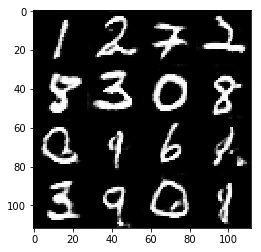

Epoch 2/2... Discriminator Loss: 1.5296... Generator Loss: 0.3102
Epoch 2/2... Discriminator Loss: 1.5964... Generator Loss: 1.9783
Epoch 2/2... Discriminator Loss: 1.3539... Generator Loss: 0.4190
Epoch 2/2... Discriminator Loss: 1.0698... Generator Loss: 0.9656
Epoch 2/2... Discriminator Loss: 1.1582... Generator Loss: 0.7782
Epoch 2/2... Discriminator Loss: 1.2516... Generator Loss: 0.8223
Epoch 2/2... Discriminator Loss: 1.2209... Generator Loss: 0.7305
Epoch 2/2... Discriminator Loss: 1.2480... Generator Loss: 0.6012
Epoch 2/2... Discriminator Loss: 1.2665... Generator Loss: 1.2155
Epoch 2/2... Discriminator Loss: 1.2171... Generator Loss: 0.5420
Epoch 2/2... Discriminator Loss: 1.0988... Generator Loss: 0.9204
Epoch 2/2... Discriminator Loss: 1.1235... Generator Loss: 0.6819
Epoch 2/2... Discriminator Loss: 1.0748... Generator Loss: 1.0775
Epoch 2/2... Discriminator Loss: 1.1674... Generator Loss: 0.5843
Epoch 2/2... Discriminator Loss: 1.1424... Generator Loss: 1.0843
Epoch 2/2.

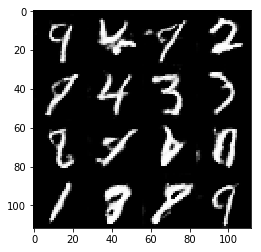

Epoch 2/2... Discriminator Loss: 1.0180... Generator Loss: 1.0355
Epoch 2/2... Discriminator Loss: 1.5479... Generator Loss: 0.3265
Epoch 2/2... Discriminator Loss: 1.5071... Generator Loss: 1.8491
Epoch 2/2... Discriminator Loss: 1.6056... Generator Loss: 0.3046
Epoch 2/2... Discriminator Loss: 1.5482... Generator Loss: 1.6929
Epoch 2/2... Discriminator Loss: 1.3278... Generator Loss: 0.4098
Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 1.2356
Epoch 2/2... Discriminator Loss: 1.2490... Generator Loss: 0.5947
Epoch 2/2... Discriminator Loss: 1.1080... Generator Loss: 0.8729
Epoch 2/2... Discriminator Loss: 1.2093... Generator Loss: 0.7991
Epoch 2/2... Discriminator Loss: 1.1403... Generator Loss: 0.8351
Epoch 2/2... Discriminator Loss: 1.1244... Generator Loss: 0.7460
Epoch 2/2... Discriminator Loss: 1.0914... Generator Loss: 0.8192
Epoch 2/2... Discriminator Loss: 1.1298... Generator Loss: 0.8003
Epoch 2/2... Discriminator Loss: 1.1723... Generator Loss: 0.6652
Epoch 2/2.

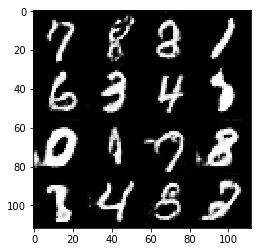

Epoch 2/2... Discriminator Loss: 1.0485... Generator Loss: 0.9342
Epoch 2/2... Discriminator Loss: 1.0559... Generator Loss: 0.8852
Epoch 2/2... Discriminator Loss: 1.0536... Generator Loss: 0.7796
Epoch 2/2... Discriminator Loss: 1.0318... Generator Loss: 0.8577
Epoch 2/2... Discriminator Loss: 1.0272... Generator Loss: 0.8862
Epoch 2/2... Discriminator Loss: 0.9988... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 1.0620... Generator Loss: 0.6763
Epoch 2/2... Discriminator Loss: 1.0119... Generator Loss: 1.1144
Epoch 2/2... Discriminator Loss: 1.1504... Generator Loss: 0.6040
Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 1.5713
Epoch 2/2... Discriminator Loss: 1.5478... Generator Loss: 0.3152
Epoch 2/2... Discriminator Loss: 1.3910... Generator Loss: 1.6780
Epoch 2/2... Discriminator Loss: 1.3831... Generator Loss: 0.4297
Epoch 2/2... Discriminator Loss: 1.1522... Generator Loss: 0.9596
Epoch 2/2... Discriminator Loss: 1.1619... Generator Loss: 0.6550
Epoch 2/2.

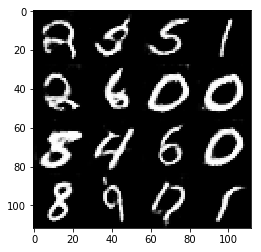

Epoch 2/2... Discriminator Loss: 1.1664... Generator Loss: 0.6974
Epoch 2/2... Discriminator Loss: 1.1889... Generator Loss: 0.7340
Epoch 2/2... Discriminator Loss: 1.1148... Generator Loss: 0.8803
Epoch 2/2... Discriminator Loss: 1.3260... Generator Loss: 0.4285
Epoch 2/2... Discriminator Loss: 1.1831... Generator Loss: 1.2468
Epoch 2/2... Discriminator Loss: 1.1877... Generator Loss: 0.5421
Epoch 2/2... Discriminator Loss: 1.0410... Generator Loss: 1.0291
Epoch 2/2... Discriminator Loss: 1.0508... Generator Loss: 0.7193
Epoch 2/2... Discriminator Loss: 1.0648... Generator Loss: 1.0692
Epoch 2/2... Discriminator Loss: 1.3622... Generator Loss: 0.4385
Epoch 2/2... Discriminator Loss: 1.5196... Generator Loss: 1.9005
Epoch 2/2... Discriminator Loss: 1.6896... Generator Loss: 0.2839
Epoch 2/2... Discriminator Loss: 1.5074... Generator Loss: 2.1196
Epoch 2/2... Discriminator Loss: 1.4941... Generator Loss: 0.3223
Epoch 2/2... Discriminator Loss: 1.1418... Generator Loss: 1.3363
Epoch 2/2.

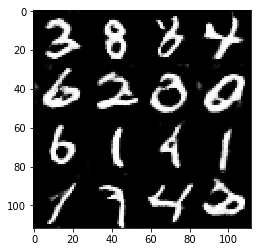

Epoch 2/2... Discriminator Loss: 1.1533... Generator Loss: 1.1037
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 0.5573
Epoch 2/2... Discriminator Loss: 1.3181... Generator Loss: 1.3261
Epoch 2/2... Discriminator Loss: 1.4323... Generator Loss: 0.3846
Epoch 2/2... Discriminator Loss: 1.1213... Generator Loss: 1.1479
Epoch 2/2... Discriminator Loss: 1.0045... Generator Loss: 0.8172
Epoch 2/2... Discriminator Loss: 1.0357... Generator Loss: 0.7455
Epoch 2/2... Discriminator Loss: 0.9515... Generator Loss: 0.8880
Epoch 2/2... Discriminator Loss: 1.1812... Generator Loss: 0.6932
Epoch 2/2... Discriminator Loss: 1.0333... Generator Loss: 1.0163
Epoch 2/2... Discriminator Loss: 1.2881... Generator Loss: 0.4532
Epoch 2/2... Discriminator Loss: 0.9849... Generator Loss: 1.4628
Epoch 2/2... Discriminator Loss: 1.2426... Generator Loss: 0.4960
Epoch 2/2... Discriminator Loss: 1.0280... Generator Loss: 1.0828
Epoch 2/2... Discriminator Loss: 1.1269... Generator Loss: 0.6572
Epoch 2/2.

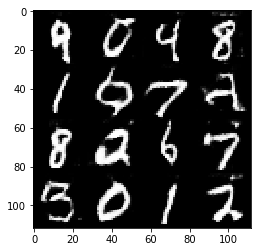

Epoch 2/2... Discriminator Loss: 1.3940... Generator Loss: 0.3782
Epoch 2/2... Discriminator Loss: 1.5711... Generator Loss: 1.9407
Epoch 2/2... Discriminator Loss: 1.2212... Generator Loss: 0.4988
Epoch 2/2... Discriminator Loss: 1.2825... Generator Loss: 1.6651
Epoch 2/2... Discriminator Loss: 1.2655... Generator Loss: 0.4424
Epoch 2/2... Discriminator Loss: 1.0469... Generator Loss: 1.1569
Epoch 2/2... Discriminator Loss: 1.1120... Generator Loss: 0.7460
Epoch 2/2... Discriminator Loss: 1.0495... Generator Loss: 0.8367
Epoch 2/2... Discriminator Loss: 1.0409... Generator Loss: 0.9573
Epoch 2/2... Discriminator Loss: 1.2805... Generator Loss: 0.5051
Epoch 2/2... Discriminator Loss: 1.3134... Generator Loss: 1.6436
Epoch 2/2... Discriminator Loss: 1.5830... Generator Loss: 0.3439
Epoch 2/2... Discriminator Loss: 1.1643... Generator Loss: 1.4865
Epoch 2/2... Discriminator Loss: 1.2812... Generator Loss: 0.5277
Epoch 2/2... Discriminator Loss: 1.1333... Generator Loss: 0.8178
Epoch 2/2.

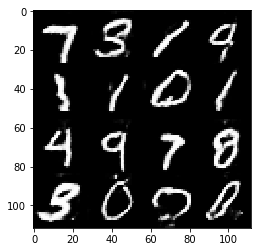

Epoch 2/2... Discriminator Loss: 1.1290... Generator Loss: 1.0472
Epoch 2/2... Discriminator Loss: 1.0947... Generator Loss: 0.8475
Epoch 2/2... Discriminator Loss: 1.1426... Generator Loss: 0.6585
Epoch 2/2... Discriminator Loss: 1.0157... Generator Loss: 0.9707
Epoch 2/2... Discriminator Loss: 0.9801... Generator Loss: 0.8538
Epoch 2/2... Discriminator Loss: 1.0672... Generator Loss: 0.6942
Epoch 2/2... Discriminator Loss: 1.0327... Generator Loss: 1.0229
Epoch 2/2... Discriminator Loss: 1.0777... Generator Loss: 0.7872
Epoch 2/2... Discriminator Loss: 1.0348... Generator Loss: 0.7323
Epoch 2/2... Discriminator Loss: 1.1029... Generator Loss: 1.4378
Epoch 2/2... Discriminator Loss: 1.6129... Generator Loss: 0.2929
Epoch 2/2... Discriminator Loss: 1.6163... Generator Loss: 1.9367
Epoch 2/2... Discriminator Loss: 1.3543... Generator Loss: 0.4181
Epoch 2/2... Discriminator Loss: 1.1738... Generator Loss: 1.0174
Epoch 2/2... Discriminator Loss: 1.2605... Generator Loss: 0.5842
Epoch 2/2.

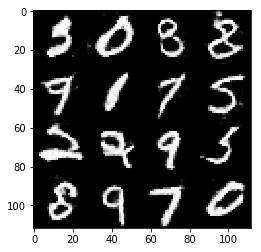

Epoch 2/2... Discriminator Loss: 1.3280... Generator Loss: 0.4503
Epoch 2/2... Discriminator Loss: 1.1684... Generator Loss: 1.3640
Epoch 2/2... Discriminator Loss: 1.1413... Generator Loss: 0.6186
Epoch 2/2... Discriminator Loss: 1.0794... Generator Loss: 1.0057
Epoch 2/2... Discriminator Loss: 1.1234... Generator Loss: 0.6958
Epoch 2/2... Discriminator Loss: 1.0529... Generator Loss: 0.7691
Epoch 2/2... Discriminator Loss: 1.1146... Generator Loss: 0.8948
Epoch 2/2... Discriminator Loss: 1.0630... Generator Loss: 0.8314
Epoch 2/2... Discriminator Loss: 1.1217... Generator Loss: 0.6507
Epoch 2/2... Discriminator Loss: 1.0697... Generator Loss: 1.2740
Epoch 2/2... Discriminator Loss: 1.3527... Generator Loss: 0.4402
Epoch 2/2... Discriminator Loss: 1.2143... Generator Loss: 1.4012
Epoch 2/2... Discriminator Loss: 1.2584... Generator Loss: 0.4999
Epoch 2/2... Discriminator Loss: 1.0398... Generator Loss: 1.3102
Epoch 2/2... Discriminator Loss: 1.2672... Generator Loss: 0.5139
Epoch 2/2.

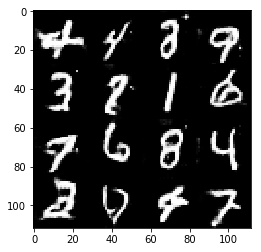

Epoch 2/2... Discriminator Loss: 1.0450... Generator Loss: 0.8925
Epoch 2/2... Discriminator Loss: 0.9454... Generator Loss: 0.9339
Epoch 2/2... Discriminator Loss: 1.2142... Generator Loss: 0.5333
Epoch 2/2... Discriminator Loss: 1.1196... Generator Loss: 1.2289
Epoch 2/2... Discriminator Loss: 1.3672... Generator Loss: 0.4040
Epoch 2/2... Discriminator Loss: 1.3440... Generator Loss: 2.0539
Epoch 2/2... Discriminator Loss: 1.8785... Generator Loss: 0.2346
Epoch 2/2... Discriminator Loss: 1.1556... Generator Loss: 1.6858
Epoch 2/2... Discriminator Loss: 1.1951... Generator Loss: 0.5382
Epoch 2/2... Discriminator Loss: 1.0394... Generator Loss: 0.9540
Epoch 2/2... Discriminator Loss: 1.0345... Generator Loss: 0.8794
Epoch 2/2... Discriminator Loss: 0.9779... Generator Loss: 0.9389
Epoch 2/2... Discriminator Loss: 1.1220... Generator Loss: 0.6417
Epoch 2/2... Discriminator Loss: 0.9687... Generator Loss: 1.2721
Epoch 2/2... Discriminator Loss: 1.5795... Generator Loss: 0.3040
Epoch 2/2.

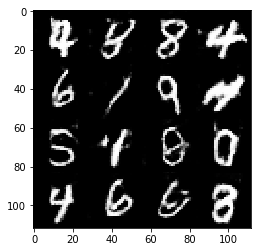

Epoch 2/2... Discriminator Loss: 1.1818... Generator Loss: 0.6929
Epoch 2/2... Discriminator Loss: 1.1682... Generator Loss: 0.8540
Epoch 2/2... Discriminator Loss: 1.2095... Generator Loss: 0.5955
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 1.4872
Epoch 2/2... Discriminator Loss: 1.2509... Generator Loss: 0.4853
Epoch 2/2... Discriminator Loss: 1.1143... Generator Loss: 1.3707
Epoch 2/2... Discriminator Loss: 1.1305... Generator Loss: 0.5690
Epoch 2/2... Discriminator Loss: 1.0040... Generator Loss: 0.9403
Epoch 2/2... Discriminator Loss: 1.1726... Generator Loss: 0.7646
Epoch 2/2... Discriminator Loss: 0.9919... Generator Loss: 1.0218
Epoch 2/2... Discriminator Loss: 1.2720... Generator Loss: 0.5027
Epoch 2/2... Discriminator Loss: 1.1873... Generator Loss: 1.5985
Epoch 2/2... Discriminator Loss: 1.3603... Generator Loss: 0.4511
Epoch 2/2... Discriminator Loss: 1.1739... Generator Loss: 1.0683
Epoch 2/2... Discriminator Loss: 1.2577... Generator Loss: 0.5003
Epoch 2/2.

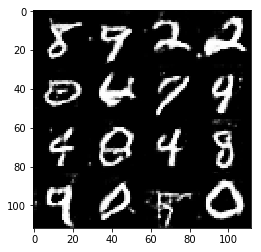

Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.5749
Epoch 2/2... Discriminator Loss: 1.2184... Generator Loss: 0.8049
Epoch 2/2... Discriminator Loss: 0.9572... Generator Loss: 1.0808
Epoch 2/2... Discriminator Loss: 1.0782... Generator Loss: 0.6943
Epoch 2/2... Discriminator Loss: 0.9942... Generator Loss: 1.3299
Epoch 2/2... Discriminator Loss: 1.4174... Generator Loss: 0.3720
Epoch 2/2... Discriminator Loss: 2.3130... Generator Loss: 2.1665
Epoch 2/2... Discriminator Loss: 1.5058... Generator Loss: 0.3761
Epoch 2/2... Discriminator Loss: 1.3601... Generator Loss: 1.8954
Epoch 2/2... Discriminator Loss: 1.4082... Generator Loss: 0.4277
Epoch 2/2... Discriminator Loss: 1.1399... Generator Loss: 1.2214
Epoch 2/2... Discriminator Loss: 1.2116... Generator Loss: 0.7055
Epoch 2/2... Discriminator Loss: 1.1921... Generator Loss: 0.6837
Epoch 2/2... Discriminator Loss: 1.2164... Generator Loss: 1.1113
Epoch 2/2... Discriminator Loss: 1.4013... Generator Loss: 0.4109
Epoch 2/2.

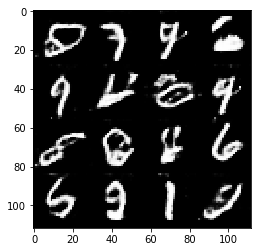

Epoch 2/2... Discriminator Loss: 1.2440... Generator Loss: 1.1524
Epoch 2/2... Discriminator Loss: 1.3770... Generator Loss: 0.4468
Epoch 2/2... Discriminator Loss: 1.2709... Generator Loss: 1.1471
Epoch 2/2... Discriminator Loss: 1.2672... Generator Loss: 0.6690
Epoch 2/2... Discriminator Loss: 1.1628... Generator Loss: 0.7567
Epoch 2/2... Discriminator Loss: 1.1496... Generator Loss: 0.9190
Epoch 2/2... Discriminator Loss: 1.2092... Generator Loss: 0.6687
Epoch 2/2... Discriminator Loss: 1.1303... Generator Loss: 0.6621
Epoch 2/2... Discriminator Loss: 1.1303... Generator Loss: 0.9514
Epoch 2/2... Discriminator Loss: 1.2089... Generator Loss: 0.7426
Epoch 2/2... Discriminator Loss: 1.2454... Generator Loss: 0.5865
Epoch 2/2... Discriminator Loss: 1.0324... Generator Loss: 1.1829
Epoch 2/2... Discriminator Loss: 1.0857... Generator Loss: 0.6680
Epoch 2/2... Discriminator Loss: 1.1501... Generator Loss: 1.2987
Epoch 2/2... Discriminator Loss: 1.4791... Generator Loss: 0.3611
Epoch 2/2.

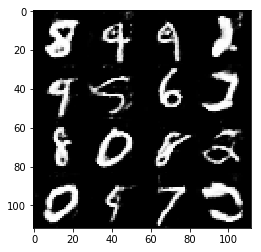

Epoch 2/2... Discriminator Loss: 1.0993... Generator Loss: 1.2324
Epoch 2/2... Discriminator Loss: 1.0609... Generator Loss: 0.7433
Epoch 2/2... Discriminator Loss: 1.0739... Generator Loss: 0.8677
Epoch 2/2... Discriminator Loss: 1.0190... Generator Loss: 0.9568
Epoch 2/2... Discriminator Loss: 1.0289... Generator Loss: 0.7587
Epoch 2/2... Discriminator Loss: 1.1192... Generator Loss: 1.1450
Epoch 2/2... Discriminator Loss: 1.2242... Generator Loss: 0.5445
Epoch 2/2... Discriminator Loss: 1.2320... Generator Loss: 1.4662
Epoch 2/2... Discriminator Loss: 1.3306... Generator Loss: 0.4362
Epoch 2/2... Discriminator Loss: 1.1941... Generator Loss: 1.1137
Epoch 2/2... Discriminator Loss: 1.1326... Generator Loss: 0.7077
Epoch 2/2... Discriminator Loss: 1.0998... Generator Loss: 0.7541
Epoch 2/2... Discriminator Loss: 1.0506... Generator Loss: 0.7724
Epoch 2/2... Discriminator Loss: 1.1888... Generator Loss: 0.5909
Epoch 2/2... Discriminator Loss: 1.2066... Generator Loss: 1.5838
Epoch 2/2.

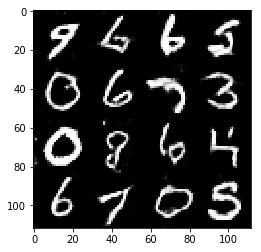

Epoch 2/2... Discriminator Loss: 1.1312... Generator Loss: 0.6302
Epoch 2/2... Discriminator Loss: 1.0934... Generator Loss: 0.9225
Epoch 2/2... Discriminator Loss: 1.2240... Generator Loss: 0.5922
Epoch 2/2... Discriminator Loss: 0.9656... Generator Loss: 0.9394
Epoch 2/2... Discriminator Loss: 1.0894... Generator Loss: 0.8013
Epoch 2/2... Discriminator Loss: 1.0522... Generator Loss: 1.3817
Epoch 2/2... Discriminator Loss: 1.7771... Generator Loss: 0.2401
Epoch 2/2... Discriminator Loss: 1.2622... Generator Loss: 1.9724
Epoch 2/2... Discriminator Loss: 1.2151... Generator Loss: 0.5379
Epoch 2/2... Discriminator Loss: 0.9455... Generator Loss: 0.9874
Epoch 2/2... Discriminator Loss: 1.0840... Generator Loss: 0.8036
Epoch 2/2... Discriminator Loss: 1.0932... Generator Loss: 0.7295
Epoch 2/2... Discriminator Loss: 1.0610... Generator Loss: 1.0224
Epoch 2/2... Discriminator Loss: 0.9742... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 1.0380... Generator Loss: 0.7837
Epoch 2/2.

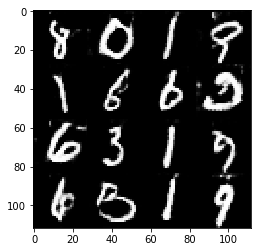

Epoch 2/2... Discriminator Loss: 1.2025... Generator Loss: 1.1845
Epoch 2/2... Discriminator Loss: 1.5235... Generator Loss: 0.3517
Epoch 2/2... Discriminator Loss: 1.3942... Generator Loss: 1.6323
Epoch 2/2... Discriminator Loss: 1.2939... Generator Loss: 0.4425
Epoch 2/2... Discriminator Loss: 1.0988... Generator Loss: 1.2013
Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 0.6940
Epoch 2/2... Discriminator Loss: 0.9217... Generator Loss: 1.0262
Epoch 2/2... Discriminator Loss: 1.1062... Generator Loss: 0.6154
Epoch 2/2... Discriminator Loss: 1.0340... Generator Loss: 1.1583
Epoch 2/2... Discriminator Loss: 1.2697... Generator Loss: 0.5101
Epoch 2/2... Discriminator Loss: 1.1566... Generator Loss: 1.5943
Epoch 2/2... Discriminator Loss: 1.2966... Generator Loss: 0.4344
Epoch 2/2... Discriminator Loss: 0.9091... Generator Loss: 1.2540
Epoch 2/2... Discriminator Loss: 1.0168... Generator Loss: 0.8863
Epoch 2/2... Discriminator Loss: 1.1485... Generator Loss: 0.6008
Epoch 2/2.

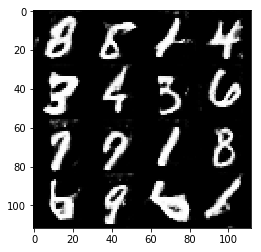

Epoch 2/2... Discriminator Loss: 0.9954... Generator Loss: 0.8975
Epoch 2/2... Discriminator Loss: 1.1067... Generator Loss: 0.7037
Epoch 2/2... Discriminator Loss: 1.0252... Generator Loss: 1.1264
Epoch 2/2... Discriminator Loss: 1.1675... Generator Loss: 0.5410
Epoch 2/2... Discriminator Loss: 0.8819... Generator Loss: 1.3350
Epoch 2/2... Discriminator Loss: 1.3176... Generator Loss: 0.4587
Epoch 2/2... Discriminator Loss: 1.0817... Generator Loss: 1.6477
Epoch 2/2... Discriminator Loss: 2.0126... Generator Loss: 0.1775
Epoch 2/2... Discriminator Loss: 2.3351... Generator Loss: 2.6611
Epoch 2/2... Discriminator Loss: 1.4474... Generator Loss: 0.3776
Epoch 2/2... Discriminator Loss: 1.0814... Generator Loss: 0.9728
Epoch 2/2... Discriminator Loss: 1.0853... Generator Loss: 0.9794
Epoch 2/2... Discriminator Loss: 1.1170... Generator Loss: 0.6379
Epoch 2/2... Discriminator Loss: 1.1899... Generator Loss: 0.8990
Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 0.9035
Epoch 2/2.

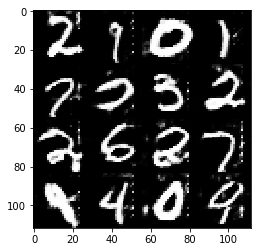

Epoch 2/2... Discriminator Loss: 1.0767... Generator Loss: 0.8900
Epoch 2/2... Discriminator Loss: 1.1790... Generator Loss: 0.5343
Epoch 2/2... Discriminator Loss: 1.0997... Generator Loss: 1.3100
Epoch 2/2... Discriminator Loss: 1.0850... Generator Loss: 0.6032
Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 1.0153
Epoch 2/2... Discriminator Loss: 1.1704... Generator Loss: 0.6005
Epoch 2/2... Discriminator Loss: 0.9642... Generator Loss: 1.4271
Epoch 2/2... Discriminator Loss: 1.1835... Generator Loss: 0.5200
Epoch 2/2... Discriminator Loss: 0.9778... Generator Loss: 1.2535
Epoch 2/2... Discriminator Loss: 1.1378... Generator Loss: 0.5623
Epoch 2/2... Discriminator Loss: 1.1160... Generator Loss: 1.5021
Epoch 2/2... Discriminator Loss: 1.3258... Generator Loss: 0.4467
Epoch 2/2... Discriminator Loss: 1.0503... Generator Loss: 1.1857
Epoch 2/2... Discriminator Loss: 1.0614... Generator Loss: 0.6622
Epoch 2/2... Discriminator Loss: 0.9841... Generator Loss: 0.9086
Epoch 2/2.

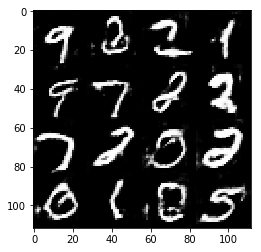

Epoch 2/2... Discriminator Loss: 1.3051... Generator Loss: 0.4897
Epoch 2/2... Discriminator Loss: 1.1081... Generator Loss: 1.3289
Epoch 2/2... Discriminator Loss: 1.3475... Generator Loss: 0.4366
Epoch 2/2... Discriminator Loss: 1.1550... Generator Loss: 1.2783
Epoch 2/2... Discriminator Loss: 1.2621... Generator Loss: 0.4877
Epoch 2/2... Discriminator Loss: 1.1694... Generator Loss: 1.3942
Epoch 2/2... Discriminator Loss: 1.3944... Generator Loss: 0.4316
Epoch 2/2... Discriminator Loss: 1.0747... Generator Loss: 0.9941
Epoch 2/2... Discriminator Loss: 1.0967... Generator Loss: 0.9047
Epoch 2/2... Discriminator Loss: 1.2319... Generator Loss: 0.6193
Epoch 2/2... Discriminator Loss: 1.0111... Generator Loss: 1.0563
Epoch 2/2... Discriminator Loss: 1.2294... Generator Loss: 0.4969
Epoch 2/2... Discriminator Loss: 1.1080... Generator Loss: 1.2461
Epoch 2/2... Discriminator Loss: 1.1851... Generator Loss: 0.5459
Epoch 2/2... Discriminator Loss: 1.0565... Generator Loss: 0.9012
Epoch 2/2.

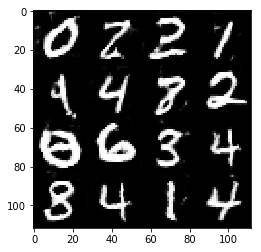

Epoch 2/2... Discriminator Loss: 1.0887... Generator Loss: 1.3696
Epoch 2/2... Discriminator Loss: 1.1306... Generator Loss: 0.5784
Epoch 2/2... Discriminator Loss: 0.9851... Generator Loss: 0.9800
Epoch 2/2... Discriminator Loss: 1.1729... Generator Loss: 0.6546
Epoch 2/2... Discriminator Loss: 1.0534... Generator Loss: 1.4893
Epoch 2/2... Discriminator Loss: 1.5939... Generator Loss: 0.2979
Epoch 2/2... Discriminator Loss: 1.7107... Generator Loss: 2.0143
Epoch 2/2... Discriminator Loss: 1.6972... Generator Loss: 0.2592
Epoch 2/2... Discriminator Loss: 0.9745... Generator Loss: 1.4885
Epoch 2/2... Discriminator Loss: 1.1016... Generator Loss: 0.7213
Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 0.8361
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 0.6614
Epoch 2/2... Discriminator Loss: 1.1530... Generator Loss: 0.8036
Epoch 2/2... Discriminator Loss: 1.0839... Generator Loss: 0.8207
Epoch 2/2... Discriminator Loss: 1.0880... Generator Loss: 0.9000
Epoch 2/2.

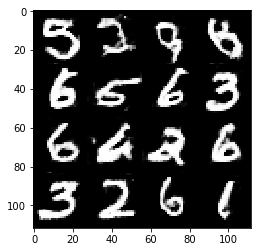

Epoch 2/2... Discriminator Loss: 1.1190... Generator Loss: 0.5803
Epoch 2/2... Discriminator Loss: 0.9657... Generator Loss: 0.9969
Epoch 2/2... Discriminator Loss: 1.0530... Generator Loss: 0.7294
Epoch 2/2... Discriminator Loss: 0.9568... Generator Loss: 1.2736
Epoch 2/2... Discriminator Loss: 1.1999... Generator Loss: 0.4828
Epoch 2/2... Discriminator Loss: 1.2269... Generator Loss: 1.8376
Epoch 2/2... Discriminator Loss: 1.3419... Generator Loss: 0.4659
Epoch 2/2... Discriminator Loss: 1.1168... Generator Loss: 1.3765
Epoch 2/2... Discriminator Loss: 1.0946... Generator Loss: 0.6472
Epoch 2/2... Discriminator Loss: 1.0940... Generator Loss: 0.6399
Epoch 2/2... Discriminator Loss: 0.9599... Generator Loss: 1.3957
Epoch 2/2... Discriminator Loss: 1.3495... Generator Loss: 0.4158
Epoch 2/2... Discriminator Loss: 1.0750... Generator Loss: 1.2702
Epoch 2/2... Discriminator Loss: 1.2511... Generator Loss: 0.5461
Epoch 2/2... Discriminator Loss: 1.1220... Generator Loss: 0.8982
Epoch 2/2.

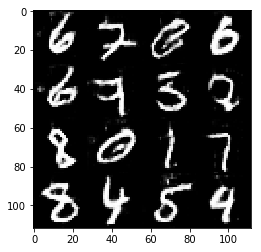

Epoch 2/2... Discriminator Loss: 0.9617... Generator Loss: 0.7393
Epoch 2/2... Discriminator Loss: 0.9408... Generator Loss: 1.2942
Epoch 2/2... Discriminator Loss: 1.3526... Generator Loss: 0.4200
Epoch 2/2... Discriminator Loss: 1.0343... Generator Loss: 1.3108
Epoch 2/2... Discriminator Loss: 1.1177... Generator Loss: 0.6301
Epoch 2/2... Discriminator Loss: 0.9416... Generator Loss: 0.8508
Epoch 2/2... Discriminator Loss: 1.1196... Generator Loss: 1.5510
Epoch 2/2... Discriminator Loss: 1.5642... Generator Loss: 0.3146
Epoch 2/2... Discriminator Loss: 1.3947... Generator Loss: 1.8854
Epoch 2/2... Discriminator Loss: 1.6443... Generator Loss: 0.2943
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 1.4476
Epoch 2/2... Discriminator Loss: 1.1309... Generator Loss: 0.6093
Epoch 2/2... Discriminator Loss: 0.9606... Generator Loss: 1.0746
Epoch 2/2... Discriminator Loss: 1.3354... Generator Loss: 0.4381
Epoch 2/2... Discriminator Loss: 1.2756... Generator Loss: 1.4901
Epoch 2/2.

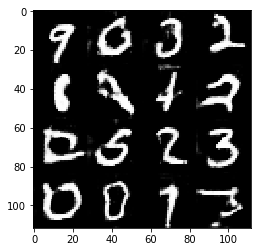

Epoch 2/2... Discriminator Loss: 1.1927... Generator Loss: 1.0316
Epoch 2/2... Discriminator Loss: 1.3171... Generator Loss: 0.4897
Epoch 2/2... Discriminator Loss: 1.3438... Generator Loss: 1.3647
Epoch 2/2... Discriminator Loss: 1.3544... Generator Loss: 0.4315
Epoch 2/2... Discriminator Loss: 1.0691... Generator Loss: 1.3069
Epoch 2/2... Discriminator Loss: 1.2039... Generator Loss: 0.5525
Epoch 2/2... Discriminator Loss: 1.1098... Generator Loss: 1.0481
Epoch 2/2... Discriminator Loss: 1.2827... Generator Loss: 0.4822
Epoch 2/2... Discriminator Loss: 1.1246... Generator Loss: 1.3893
Epoch 2/2... Discriminator Loss: 1.2162... Generator Loss: 0.5116
Epoch 2/2... Discriminator Loss: 1.0064... Generator Loss: 0.9498
Epoch 2/2... Discriminator Loss: 1.1068... Generator Loss: 0.7034
Epoch 2/2... Discriminator Loss: 1.1019... Generator Loss: 1.0530
Epoch 2/2... Discriminator Loss: 1.1854... Generator Loss: 0.5284
Epoch 2/2... Discriminator Loss: 1.1438... Generator Loss: 1.4597
Epoch 2/2.

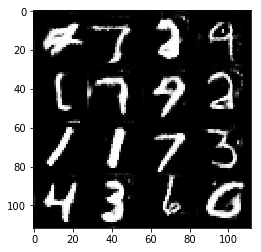

Epoch 2/2... Discriminator Loss: 0.9765... Generator Loss: 1.4923
Epoch 2/2... Discriminator Loss: 1.2139... Generator Loss: 0.5303
Epoch 2/2... Discriminator Loss: 0.9431... Generator Loss: 1.2206
Epoch 2/2... Discriminator Loss: 1.0720... Generator Loss: 0.6714
Epoch 2/2... Discriminator Loss: 0.9387... Generator Loss: 0.9519
Epoch 2/2... Discriminator Loss: 0.8881... Generator Loss: 1.1448
Epoch 2/2... Discriminator Loss: 1.2828... Generator Loss: 0.4340
Epoch 2/2... Discriminator Loss: 1.3324... Generator Loss: 1.5692
Epoch 2/2... Discriminator Loss: 1.2123... Generator Loss: 0.4851
Epoch 2/2... Discriminator Loss: 1.0816... Generator Loss: 1.0565
Epoch 2/2... Discriminator Loss: 1.1295... Generator Loss: 0.6611
Epoch 2/2... Discriminator Loss: 1.0884... Generator Loss: 1.4003
Epoch 2/2... Discriminator Loss: 1.2847... Generator Loss: 0.4697
Epoch 2/2... Discriminator Loss: 0.9224... Generator Loss: 1.3801
Epoch 2/2... Discriminator Loss: 1.1398... Generator Loss: 0.6126
Epoch 2/2.

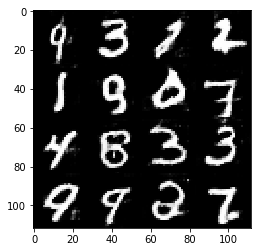

Epoch 2/2... Discriminator Loss: 1.2388... Generator Loss: 0.5719
Epoch 2/2... Discriminator Loss: 1.0612... Generator Loss: 1.3377
Epoch 2/2... Discriminator Loss: 1.2292... Generator Loss: 0.4871
Epoch 2/2... Discriminator Loss: 1.0056... Generator Loss: 1.4073
Epoch 2/2... Discriminator Loss: 1.2363... Generator Loss: 0.5485
Epoch 2/2... Discriminator Loss: 0.9432... Generator Loss: 1.0701
Epoch 2/2... Discriminator Loss: 1.0169... Generator Loss: 0.8085
Epoch 2/2... Discriminator Loss: 0.9612... Generator Loss: 0.9245
Epoch 2/2... Discriminator Loss: 1.1581... Generator Loss: 0.6829
Epoch 2/2... Discriminator Loss: 1.0364... Generator Loss: 0.9262
Epoch 2/2... Discriminator Loss: 1.5678... Generator Loss: 0.3180
Epoch 2/2... Discriminator Loss: 1.5860... Generator Loss: 2.2144
Epoch 2/2... Discriminator Loss: 1.4663... Generator Loss: 0.3763
Epoch 2/2... Discriminator Loss: 1.2494... Generator Loss: 1.5546
Epoch 2/2... Discriminator Loss: 1.3565... Generator Loss: 0.4380
Epoch 2/2.

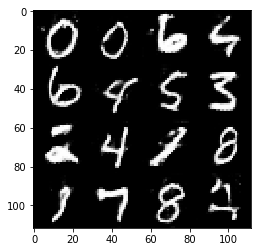

Epoch 2/2... Discriminator Loss: 1.3250... Generator Loss: 0.4913
Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 1.5765
Epoch 2/2... Discriminator Loss: 1.4805... Generator Loss: 0.3985
Epoch 2/2... Discriminator Loss: 1.2327... Generator Loss: 1.4517
Epoch 2/2... Discriminator Loss: 1.1367... Generator Loss: 0.6136
Epoch 2/2... Discriminator Loss: 1.0363... Generator Loss: 0.9825
Epoch 2/2... Discriminator Loss: 0.9413... Generator Loss: 0.8648
Epoch 2/2... Discriminator Loss: 1.1877... Generator Loss: 0.5646
Epoch 2/2... Discriminator Loss: 1.1082... Generator Loss: 0.9815
Epoch 2/2... Discriminator Loss: 1.0404... Generator Loss: 0.8121
Epoch 2/2... Discriminator Loss: 1.0014... Generator Loss: 1.0019
Epoch 2/2... Discriminator Loss: 1.1542... Generator Loss: 0.5400
Epoch 2/2... Discriminator Loss: 0.9371... Generator Loss: 1.6216
Epoch 2/2... Discriminator Loss: 1.2134... Generator Loss: 0.5223
Epoch 2/2... Discriminator Loss: 1.0030... Generator Loss: 1.0466
Epoch 2/2.

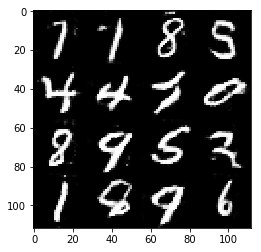

Epoch 2/2... Discriminator Loss: 1.0722... Generator Loss: 1.4703
Epoch 2/2... Discriminator Loss: 1.0648... Generator Loss: 0.6324
Epoch 2/2... Discriminator Loss: 1.0142... Generator Loss: 0.8861
Epoch 2/2... Discriminator Loss: 1.0573... Generator Loss: 0.7222
Epoch 2/2... Discriminator Loss: 0.9967... Generator Loss: 1.2545
Epoch 2/2... Discriminator Loss: 1.1461... Generator Loss: 0.5359
Epoch 2/2... Discriminator Loss: 1.1876... Generator Loss: 1.8190
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.3567
Epoch 2/2... Discriminator Loss: 1.1218... Generator Loss: 2.1735
Epoch 2/2... Discriminator Loss: 1.2562... Generator Loss: 0.4640
Epoch 2/2... Discriminator Loss: 0.9748... Generator Loss: 1.1429
Epoch 2/2... Discriminator Loss: 0.8287... Generator Loss: 1.0780
Epoch 2/2... Discriminator Loss: 1.0644... Generator Loss: 0.7127
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 1.2779
Epoch 2/2... Discriminator Loss: 1.5356... Generator Loss: 0.3120
Epoch 2/2.

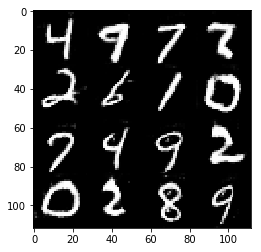

Epoch 2/2... Discriminator Loss: 1.3247... Generator Loss: 0.4652
Epoch 2/2... Discriminator Loss: 1.2265... Generator Loss: 1.1245
Epoch 2/2... Discriminator Loss: 1.3992... Generator Loss: 0.4126
Epoch 2/2... Discriminator Loss: 1.5543... Generator Loss: 1.4922
Epoch 2/2... Discriminator Loss: 1.7821... Generator Loss: 0.2638
Epoch 2/2... Discriminator Loss: 1.2296... Generator Loss: 1.2065
Epoch 2/2... Discriminator Loss: 1.0786... Generator Loss: 0.9421
Epoch 2/2... Discriminator Loss: 1.3331... Generator Loss: 0.4838
Epoch 2/2... Discriminator Loss: 1.0080... Generator Loss: 1.0235
Epoch 2/2... Discriminator Loss: 1.0596... Generator Loss: 0.8295
Epoch 2/2... Discriminator Loss: 1.2072... Generator Loss: 0.5794
Epoch 2/2... Discriminator Loss: 1.1803... Generator Loss: 1.0140
Epoch 2/2... Discriminator Loss: 1.1833... Generator Loss: 0.5201
Epoch 2/2... Discriminator Loss: 1.1219... Generator Loss: 0.9642
Epoch 2/2... Discriminator Loss: 1.1951... Generator Loss: 0.8846
Epoch 2/2.

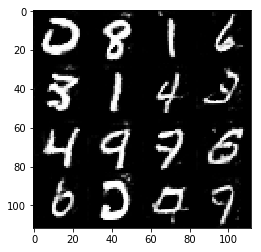

Epoch 2/2... Discriminator Loss: 1.0706... Generator Loss: 0.7846
Epoch 2/2... Discriminator Loss: 1.0306... Generator Loss: 1.2062
Epoch 2/2... Discriminator Loss: 1.3085... Generator Loss: 0.4395
Epoch 2/2... Discriminator Loss: 1.1081... Generator Loss: 0.9660
Epoch 2/2... Discriminator Loss: 0.8165... Generator Loss: 1.3555
Epoch 2/2... Discriminator Loss: 1.1362... Generator Loss: 0.5190
Epoch 2/2... Discriminator Loss: 1.0238... Generator Loss: 1.3737
Epoch 2/2... Discriminator Loss: 1.4020... Generator Loss: 0.3691
Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 1.6906
Epoch 2/2... Discriminator Loss: 1.5238... Generator Loss: 0.3439
Epoch 2/2... Discriminator Loss: 1.3026... Generator Loss: 1.7751
Epoch 2/2... Discriminator Loss: 1.2416... Generator Loss: 0.4794
Epoch 2/2... Discriminator Loss: 0.9141... Generator Loss: 1.2103
Epoch 2/2... Discriminator Loss: 0.9722... Generator Loss: 0.7511
Epoch 2/2... Discriminator Loss: 1.0103... Generator Loss: 0.8464
Epoch 2/2.

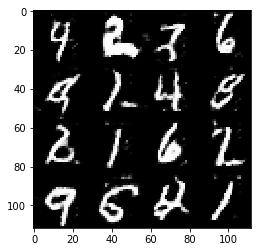

Epoch 2/2... Discriminator Loss: 1.0125... Generator Loss: 0.7610
Epoch 2/2... Discriminator Loss: 0.9905... Generator Loss: 1.1143
Epoch 2/2... Discriminator Loss: 1.0261... Generator Loss: 0.6334
Epoch 2/2... Discriminator Loss: 0.8720... Generator Loss: 1.4588
Epoch 2/2... Discriminator Loss: 1.4055... Generator Loss: 0.3871
Epoch 2/2... Discriminator Loss: 1.4107... Generator Loss: 1.9814
Epoch 2/2... Discriminator Loss: 1.2750... Generator Loss: 0.4575
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 1.3301
Epoch 2/2... Discriminator Loss: 1.6609... Generator Loss: 0.3089
Epoch 2/2... Discriminator Loss: 1.1274... Generator Loss: 1.5835
Epoch 2/2... Discriminator Loss: 1.2233... Generator Loss: 0.5755
Epoch 2/2... Discriminator Loss: 1.2068... Generator Loss: 0.7302
Epoch 2/2... Discriminator Loss: 1.2076... Generator Loss: 1.2258
Epoch 2/2... Discriminator Loss: 1.3573... Generator Loss: 0.4441
Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 1.2584
Epoch 2/2.

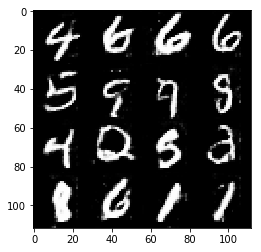

Epoch 2/2... Discriminator Loss: 0.9934... Generator Loss: 0.9617
Epoch 2/2... Discriminator Loss: 1.0580... Generator Loss: 0.6452
Epoch 2/2... Discriminator Loss: 1.0125... Generator Loss: 1.1454
Epoch 2/2... Discriminator Loss: 1.1009... Generator Loss: 0.5534
Epoch 2/2... Discriminator Loss: 0.9476... Generator Loss: 1.0856
Epoch 2/2... Discriminator Loss: 1.3212... Generator Loss: 0.4238
Epoch 2/2... Discriminator Loss: 1.8372... Generator Loss: 2.2219
Epoch 2/2... Discriminator Loss: 1.6442... Generator Loss: 0.3121
Epoch 2/2... Discriminator Loss: 1.1075... Generator Loss: 1.5055
Epoch 2/2... Discriminator Loss: 1.1147... Generator Loss: 0.6262
Epoch 2/2... Discriminator Loss: 1.0175... Generator Loss: 0.9042
Epoch 2/2... Discriminator Loss: 1.0444... Generator Loss: 0.7354
Epoch 2/2... Discriminator Loss: 0.9210... Generator Loss: 1.1781
Epoch 2/2... Discriminator Loss: 0.9408... Generator Loss: 0.7566
Epoch 2/2... Discriminator Loss: 0.9315... Generator Loss: 1.3608
Epoch 2/2.

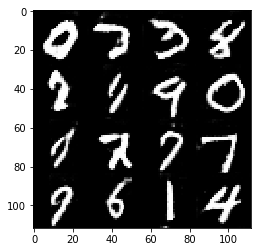

Epoch 2/2... Discriminator Loss: 1.2525... Generator Loss: 1.1788
Epoch 2/2... Discriminator Loss: 1.3795... Generator Loss: 0.4203
Epoch 2/2... Discriminator Loss: 1.1949... Generator Loss: 1.3647
Epoch 2/2... Discriminator Loss: 1.3995... Generator Loss: 0.4604
Epoch 2/2... Discriminator Loss: 1.1665... Generator Loss: 0.8368
Epoch 2/2... Discriminator Loss: 1.1431... Generator Loss: 0.7894
Epoch 2/2... Discriminator Loss: 1.2851... Generator Loss: 0.6477
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 0.8965
Epoch 2/2... Discriminator Loss: 1.1545... Generator Loss: 0.8449
Epoch 2/2... Discriminator Loss: 1.2824... Generator Loss: 0.6358
Epoch 2/2... Discriminator Loss: 1.2456... Generator Loss: 0.9330
Epoch 2/2... Discriminator Loss: 1.2877... Generator Loss: 0.5366
Epoch 2/2... Discriminator Loss: 1.1410... Generator Loss: 1.0119
Epoch 2/2... Discriminator Loss: 1.1562... Generator Loss: 0.7333
Epoch 2/2... Discriminator Loss: 1.0629... Generator Loss: 0.9077
Epoch 2/2.

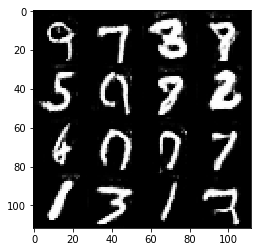

Epoch 2/2... Discriminator Loss: 1.0833... Generator Loss: 0.6754
Epoch 2/2... Discriminator Loss: 1.1230... Generator Loss: 1.0278
Epoch 2/2... Discriminator Loss: 1.0991... Generator Loss: 0.7277
Epoch 2/2... Discriminator Loss: 1.0380... Generator Loss: 1.1488
Epoch 2/2... Discriminator Loss: 1.2099... Generator Loss: 0.5091
Epoch 2/2... Discriminator Loss: 0.9441... Generator Loss: 1.1925
Epoch 2/2... Discriminator Loss: 1.1542... Generator Loss: 0.6297
Epoch 2/2... Discriminator Loss: 1.1626... Generator Loss: 1.0018
Epoch 2/2... Discriminator Loss: 1.2595... Generator Loss: 0.4754
Epoch 2/2... Discriminator Loss: 1.1558... Generator Loss: 1.3483
Epoch 2/2... Discriminator Loss: 1.2524... Generator Loss: 0.5208
Epoch 2/2... Discriminator Loss: 1.0328... Generator Loss: 1.1308
Epoch 2/2... Discriminator Loss: 0.8802... Generator Loss: 0.9875
Epoch 2/2... Discriminator Loss: 1.0790... Generator Loss: 0.7134
Epoch 2/2... Discriminator Loss: 0.9695... Generator Loss: 0.8541
Epoch 2/2.

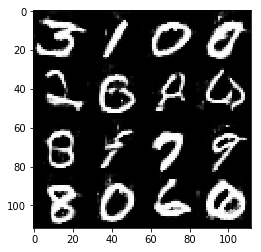

Epoch 2/2... Discriminator Loss: 1.0549... Generator Loss: 0.7117
Epoch 2/2... Discriminator Loss: 0.9716... Generator Loss: 0.9994
Epoch 2/2... Discriminator Loss: 0.9525... Generator Loss: 0.9773
Epoch 2/2... Discriminator Loss: 0.9599... Generator Loss: 0.8056
Epoch 2/2... Discriminator Loss: 0.8647... Generator Loss: 1.0436
Epoch 2/2... Discriminator Loss: 0.9289... Generator Loss: 0.8649
Epoch 2/2... Discriminator Loss: 0.8925... Generator Loss: 0.8757
Epoch 2/2... Discriminator Loss: 0.9503... Generator Loss: 0.7850
Epoch 2/2... Discriminator Loss: 1.0263... Generator Loss: 1.0519
Epoch 2/2... Discriminator Loss: 1.1254... Generator Loss: 0.5690
Epoch 2/2... Discriminator Loss: 1.2847... Generator Loss: 2.3410
Epoch 2/2... Discriminator Loss: 1.2915... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 1.2168... Generator Loss: 2.1971
Epoch 2/2... Discriminator Loss: 1.5715... Generator Loss: 0.3096
Epoch 2/2... Discriminator Loss: 1.1255... Generator Loss: 1.6073
Epoch 2/2.

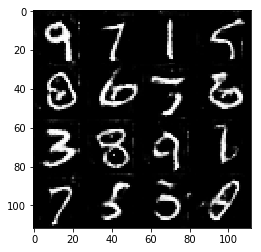

Epoch 2/2... Discriminator Loss: 0.8849... Generator Loss: 0.9857
Epoch 2/2... Discriminator Loss: 0.9643... Generator Loss: 0.8199
Epoch 2/2... Discriminator Loss: 0.9522... Generator Loss: 1.2512
Epoch 2/2... Discriminator Loss: 1.2524... Generator Loss: 0.4624
Epoch 2/2... Discriminator Loss: 1.0845... Generator Loss: 1.5048
Epoch 2/2... Discriminator Loss: 1.4579... Generator Loss: 0.3733
Epoch 2/2... Discriminator Loss: 1.1999... Generator Loss: 1.4328
Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 0.7641
Epoch 2/2... Discriminator Loss: 1.0026... Generator Loss: 0.7686
Epoch 2/2... Discriminator Loss: 0.9771... Generator Loss: 1.1334
Epoch 2/2... Discriminator Loss: 1.6381... Generator Loss: 0.3009
Epoch 2/2... Discriminator Loss: 1.9326... Generator Loss: 2.0862
Epoch 2/2... Discriminator Loss: 1.1138... Generator Loss: 0.5729
Epoch 2/2... Discriminator Loss: 0.9954... Generator Loss: 1.0054
Epoch 2/2... Discriminator Loss: 0.9762... Generator Loss: 0.8372
Epoch 2/2.

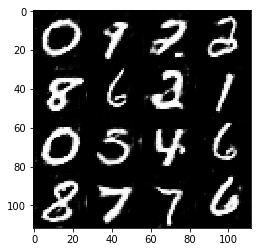

Epoch 2/2... Discriminator Loss: 1.0129... Generator Loss: 0.8176
Epoch 2/2... Discriminator Loss: 0.9921... Generator Loss: 1.5151
Epoch 2/2... Discriminator Loss: 1.5084... Generator Loss: 0.3549
Epoch 2/2... Discriminator Loss: 1.5119... Generator Loss: 2.2986
Epoch 2/2... Discriminator Loss: 1.1917... Generator Loss: 0.5635
Epoch 2/2... Discriminator Loss: 1.0051... Generator Loss: 1.4463
Epoch 2/2... Discriminator Loss: 0.9723... Generator Loss: 0.7501
Epoch 2/2... Discriminator Loss: 1.0609... Generator Loss: 0.9446
Epoch 2/2... Discriminator Loss: 1.1370... Generator Loss: 0.7161
Epoch 2/2... Discriminator Loss: 1.1122... Generator Loss: 0.8551
Epoch 2/2... Discriminator Loss: 0.9515... Generator Loss: 0.8487
Epoch 2/2... Discriminator Loss: 1.3789... Generator Loss: 0.5039
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 1.2837
Epoch 2/2... Discriminator Loss: 1.2399... Generator Loss: 0.5403
Epoch 2/2... Discriminator Loss: 1.2394... Generator Loss: 0.9122
Epoch 2/2.

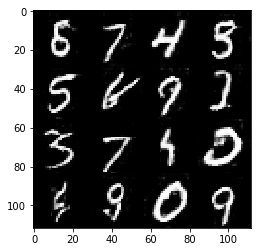

Epoch 2/2... Discriminator Loss: 1.1952... Generator Loss: 0.5343
Epoch 2/2... Discriminator Loss: 1.0041... Generator Loss: 1.0067
Epoch 2/2... Discriminator Loss: 1.1135... Generator Loss: 0.6720
Epoch 2/2... Discriminator Loss: 1.0713... Generator Loss: 0.8945
Epoch 2/2... Discriminator Loss: 1.1554... Generator Loss: 0.8170
Epoch 2/2... Discriminator Loss: 1.0076... Generator Loss: 0.7181
Epoch 2/2... Discriminator Loss: 1.0797... Generator Loss: 0.7829
Epoch 2/2... Discriminator Loss: 0.8284... Generator Loss: 1.2183
Epoch 2/2... Discriminator Loss: 0.9710... Generator Loss: 0.8078
Epoch 2/2... Discriminator Loss: 0.9947... Generator Loss: 0.7302
Epoch 2/2... Discriminator Loss: 0.9220... Generator Loss: 1.0591
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 0.5877
Epoch 2/2... Discriminator Loss: 0.9906... Generator Loss: 0.9319
Epoch 2/2... Discriminator Loss: 0.9798... Generator Loss: 0.9132
Epoch 2/2... Discriminator Loss: 1.0711... Generator Loss: 0.7621
Epoch 2/2.

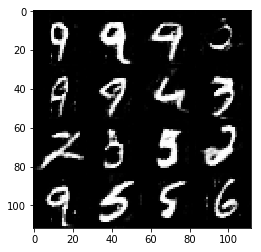

Epoch 2/2... Discriminator Loss: 1.5984... Generator Loss: 2.6254
Epoch 2/2... Discriminator Loss: 1.7948... Generator Loss: 0.2490
Epoch 2/2... Discriminator Loss: 1.2488... Generator Loss: 1.7713
Epoch 2/2... Discriminator Loss: 1.1556... Generator Loss: 0.5470
Epoch 2/2... Discriminator Loss: 0.9928... Generator Loss: 0.9628
Epoch 2/2... Discriminator Loss: 0.9568... Generator Loss: 1.2294
Epoch 2/2... Discriminator Loss: 1.2848... Generator Loss: 0.4284
Epoch 2/2... Discriminator Loss: 1.4182... Generator Loss: 2.0347
Epoch 2/2... Discriminator Loss: 1.7012... Generator Loss: 0.2676
Epoch 2/2... Discriminator Loss: 1.2143... Generator Loss: 1.7854
Epoch 2/2... Discriminator Loss: 1.1705... Generator Loss: 0.5125
Epoch 2/2... Discriminator Loss: 0.9425... Generator Loss: 0.9077
Epoch 2/2... Discriminator Loss: 1.0097... Generator Loss: 1.1288
Epoch 2/2... Discriminator Loss: 1.2253... Generator Loss: 0.4760
Epoch 2/2... Discriminator Loss: 0.9377... Generator Loss: 1.2605
Epoch 2/2.

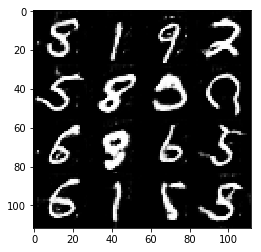

Epoch 2/2... Discriminator Loss: 1.2555... Generator Loss: 0.4548
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 1.5650
Epoch 2/2... Discriminator Loss: 1.3801... Generator Loss: 0.4144
Epoch 2/2... Discriminator Loss: 0.9653... Generator Loss: 1.5357
Epoch 2/2... Discriminator Loss: 1.1956... Generator Loss: 0.5063
Epoch 2/2... Discriminator Loss: 1.0215... Generator Loss: 1.4928
Epoch 2/2... Discriminator Loss: 1.1234... Generator Loss: 0.6103
Epoch 2/2... Discriminator Loss: 1.0226... Generator Loss: 0.7995
Epoch 2/2... Discriminator Loss: 0.7785... Generator Loss: 1.2827
Epoch 2/2... Discriminator Loss: 0.9416... Generator Loss: 0.7255
Epoch 2/2... Discriminator Loss: 0.8462... Generator Loss: 1.1052
Epoch 2/2... Discriminator Loss: 1.1165... Generator Loss: 0.6216
Epoch 2/2... Discriminator Loss: 0.8831... Generator Loss: 1.5548
Epoch 2/2... Discriminator Loss: 1.1561... Generator Loss: 0.5558
Epoch 2/2... Discriminator Loss: 0.9725... Generator Loss: 1.3985
Epoch 2/2.

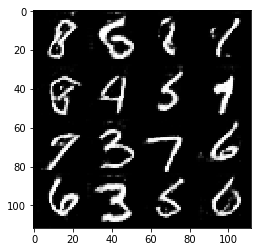

Epoch 2/2... Discriminator Loss: 0.9618... Generator Loss: 1.0135
Epoch 2/2... Discriminator Loss: 0.9336... Generator Loss: 0.8095
Epoch 2/2... Discriminator Loss: 0.7398... Generator Loss: 1.7348
Epoch 2/2... Discriminator Loss: 1.3464... Generator Loss: 0.4378
Epoch 2/2... Discriminator Loss: 1.0677... Generator Loss: 1.7088
Epoch 2/2... Discriminator Loss: 1.5385... Generator Loss: 0.3344
Epoch 2/2... Discriminator Loss: 1.7310... Generator Loss: 2.5783
Epoch 2/2... Discriminator Loss: 1.4036... Generator Loss: 0.3851
Epoch 2/2... Discriminator Loss: 1.5404... Generator Loss: 2.3856
Epoch 2/2... Discriminator Loss: 1.4193... Generator Loss: 0.3741
Epoch 2/2... Discriminator Loss: 0.8022... Generator Loss: 1.2692
Epoch 2/2... Discriminator Loss: 0.9619... Generator Loss: 1.3549
Epoch 2/2... Discriminator Loss: 1.4233... Generator Loss: 0.4433
Epoch 2/2... Discriminator Loss: 1.0564... Generator Loss: 1.0558
Epoch 2/2... Discriminator Loss: 1.0777... Generator Loss: 0.7502
Epoch 2/2.

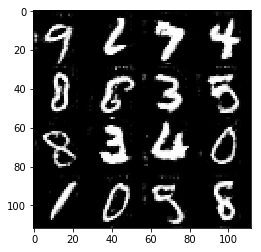

Epoch 2/2... Discriminator Loss: 1.0372... Generator Loss: 0.8147
Epoch 2/2... Discriminator Loss: 0.9693... Generator Loss: 1.0928
Epoch 2/2... Discriminator Loss: 0.9755... Generator Loss: 0.6821
Epoch 2/2... Discriminator Loss: 0.8751... Generator Loss: 1.2926
Epoch 2/2... Discriminator Loss: 1.1130... Generator Loss: 0.5998
Epoch 2/2... Discriminator Loss: 0.9270... Generator Loss: 1.2981
Epoch 2/2... Discriminator Loss: 1.1959... Generator Loss: 0.5187
Epoch 2/2... Discriminator Loss: 1.1436... Generator Loss: 1.8778
Epoch 2/2... Discriminator Loss: 1.1212... Generator Loss: 0.5305
Epoch 2/2... Discriminator Loss: 0.8822... Generator Loss: 1.1431
Epoch 2/2... Discriminator Loss: 0.7925... Generator Loss: 0.9070
Epoch 2/2... Discriminator Loss: 1.0851... Generator Loss: 0.6208
Epoch 2/2... Discriminator Loss: 0.9452... Generator Loss: 1.1102
Epoch 2/2... Discriminator Loss: 0.9254... Generator Loss: 0.8816
Epoch 2/2... Discriminator Loss: 0.9216... Generator Loss: 0.9547
Epoch 2/2.

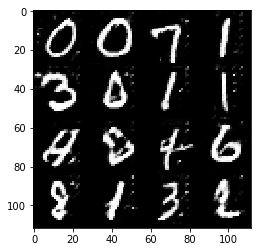

Epoch 2/2... Discriminator Loss: 1.5311... Generator Loss: 2.1387
Epoch 2/2... Discriminator Loss: 1.6314... Generator Loss: 0.3100
Epoch 2/2... Discriminator Loss: 1.2774... Generator Loss: 1.5683
Epoch 2/2... Discriminator Loss: 1.1994... Generator Loss: 0.5830
Epoch 2/2... Discriminator Loss: 1.1722... Generator Loss: 0.7662
Epoch 2/2... Discriminator Loss: 1.2543... Generator Loss: 0.9450
Epoch 2/2... Discriminator Loss: 1.3910... Generator Loss: 0.4288
Epoch 2/2... Discriminator Loss: 1.3428... Generator Loss: 1.1885
Epoch 2/2... Discriminator Loss: 1.1811... Generator Loss: 0.6048
Epoch 2/2... Discriminator Loss: 1.2380... Generator Loss: 0.8660
Epoch 2/2... Discriminator Loss: 1.1738... Generator Loss: 0.7658
Epoch 2/2... Discriminator Loss: 1.2570... Generator Loss: 0.5590
Epoch 2/2... Discriminator Loss: 1.2565... Generator Loss: 0.9623
Epoch 2/2... Discriminator Loss: 1.2461... Generator Loss: 0.5143
Epoch 2/2... Discriminator Loss: 1.0444... Generator Loss: 1.2218
Epoch 2/2.

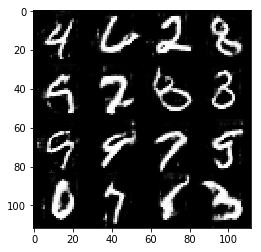

Epoch 2/2... Discriminator Loss: 0.9517... Generator Loss: 0.9666
Epoch 2/2... Discriminator Loss: 1.0551... Generator Loss: 1.0170
Epoch 2/2... Discriminator Loss: 1.1933... Generator Loss: 0.6074
Epoch 2/2... Discriminator Loss: 0.9897... Generator Loss: 1.1141
Epoch 2/2... Discriminator Loss: 1.2962... Generator Loss: 0.4443
Epoch 2/2... Discriminator Loss: 1.2209... Generator Loss: 1.9313
Epoch 2/2... Discriminator Loss: 1.4044... Generator Loss: 0.3853
Epoch 2/2... Discriminator Loss: 0.9869... Generator Loss: 1.3407
Epoch 2/2... Discriminator Loss: 1.2030... Generator Loss: 0.6799
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 0.7194
Epoch 2/2... Discriminator Loss: 1.0268... Generator Loss: 1.0791
Epoch 2/2... Discriminator Loss: 1.1240... Generator Loss: 0.6469
Epoch 2/2... Discriminator Loss: 1.0694... Generator Loss: 0.8400
Epoch 2/2... Discriminator Loss: 1.0762... Generator Loss: 0.7790
Epoch 2/2... Discriminator Loss: 1.1457... Generator Loss: 0.7913
Epoch 2/2.

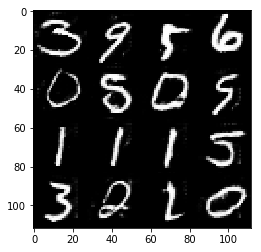

Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 0.5461
Epoch 2/2... Discriminator Loss: 1.0581... Generator Loss: 0.8781
Epoch 2/2... Discriminator Loss: 0.9973... Generator Loss: 0.8624
Epoch 2/2... Discriminator Loss: 0.9038... Generator Loss: 0.9134
Epoch 2/2... Discriminator Loss: 0.9520... Generator Loss: 0.9603
Epoch 2/2... Discriminator Loss: 0.9278... Generator Loss: 0.9884
Epoch 2/2... Discriminator Loss: 1.0676... Generator Loss: 0.6991
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 1.2639
Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.3890
Epoch 2/2... Discriminator Loss: 1.1487... Generator Loss: 1.9534
Epoch 2/2... Discriminator Loss: 1.2925... Generator Loss: 0.4585
Epoch 2/2... Discriminator Loss: 0.9979... Generator Loss: 1.1107
Epoch 2/2... Discriminator Loss: 1.0406... Generator Loss: 0.7465
Epoch 2/2... Discriminator Loss: 1.0389... Generator Loss: 0.8818
Epoch 2/2... Discriminator Loss: 0.8725... Generator Loss: 0.9546
Epoch 2/2.

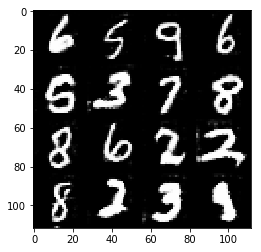

Epoch 2/2... Discriminator Loss: 1.5295... Generator Loss: 0.3392
Epoch 2/2... Discriminator Loss: 1.7249... Generator Loss: 2.4944
Epoch 2/2... Discriminator Loss: 1.2521... Generator Loss: 0.4777
Epoch 2/2... Discriminator Loss: 1.0128... Generator Loss: 0.9760
Epoch 2/2... Discriminator Loss: 0.9337... Generator Loss: 1.0168
Epoch 2/2... Discriminator Loss: 1.1396... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 0.9019
Epoch 2/2... Discriminator Loss: 1.0629... Generator Loss: 0.7792
Epoch 2/2... Discriminator Loss: 0.8406... Generator Loss: 1.0826
Epoch 2/2... Discriminator Loss: 0.9575... Generator Loss: 0.9012
Epoch 2/2... Discriminator Loss: 1.0907... Generator Loss: 0.6185
Epoch 2/2... Discriminator Loss: 0.9851... Generator Loss: 1.3219
Epoch 2/2... Discriminator Loss: 1.0476... Generator Loss: 0.7427
Epoch 2/2... Discriminator Loss: 0.9330... Generator Loss: 0.9133
Epoch 2/2... Discriminator Loss: 0.9472... Generator Loss: 0.8293
Epoch 2/2.

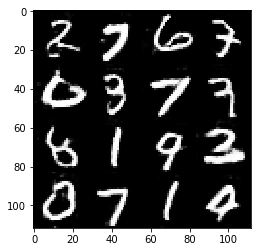

Epoch 2/2... Discriminator Loss: 0.8495... Generator Loss: 1.0292
Epoch 2/2... Discriminator Loss: 1.0245... Generator Loss: 0.6845
Epoch 2/2... Discriminator Loss: 0.8666... Generator Loss: 1.4720
Epoch 2/2... Discriminator Loss: 1.3772... Generator Loss: 0.3897
Epoch 2/2... Discriminator Loss: 1.1901... Generator Loss: 2.1231
Epoch 2/2... Discriminator Loss: 1.3461... Generator Loss: 0.4050
Epoch 2/2... Discriminator Loss: 1.4097... Generator Loss: 1.4737
Epoch 2/2... Discriminator Loss: 1.5121... Generator Loss: 0.3420
Epoch 2/2... Discriminator Loss: 1.0942... Generator Loss: 1.5506
Epoch 2/2... Discriminator Loss: 1.0622... Generator Loss: 0.6952
Epoch 2/2... Discriminator Loss: 1.0780... Generator Loss: 0.7124
Epoch 2/2... Discriminator Loss: 1.0682... Generator Loss: 0.8207
Epoch 2/2... Discriminator Loss: 0.7868... Generator Loss: 1.5090
Epoch 2/2... Discriminator Loss: 1.0272... Generator Loss: 0.7239
Epoch 2/2... Discriminator Loss: 0.8938... Generator Loss: 0.7647
Epoch 2/2.

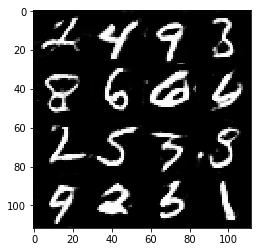

Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 1.0182
Epoch 2/2... Discriminator Loss: 1.1902... Generator Loss: 0.5243
Epoch 2/2... Discriminator Loss: 0.8476... Generator Loss: 1.4701
Epoch 2/2... Discriminator Loss: 0.9635... Generator Loss: 0.7036
Epoch 2/2... Discriminator Loss: 1.0717... Generator Loss: 0.6482
Epoch 2/2... Discriminator Loss: 0.8952... Generator Loss: 1.7491
Epoch 2/2... Discriminator Loss: 1.3182... Generator Loss: 0.4519
Epoch 2/2... Discriminator Loss: 0.9448... Generator Loss: 1.5054
Epoch 2/2... Discriminator Loss: 0.9271... Generator Loss: 0.7673
Epoch 2/2... Discriminator Loss: 0.8727... Generator Loss: 0.9181
Epoch 2/2... Discriminator Loss: 0.8655... Generator Loss: 0.9921
Epoch 2/2... Discriminator Loss: 0.9112... Generator Loss: 0.9748
Epoch 2/2... Discriminator Loss: 1.1273... Generator Loss: 0.5584
Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 1.2322
Epoch 2/2... Discriminator Loss: 0.9033... Generator Loss: 0.9934
Epoch 2/2.

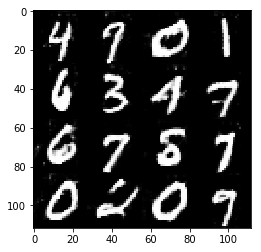

Epoch 2/2... Discriminator Loss: 0.8860... Generator Loss: 1.4876
Epoch 2/2... Discriminator Loss: 1.2000... Generator Loss: 0.5407
Epoch 2/2... Discriminator Loss: 1.2364... Generator Loss: 1.6355
Epoch 2/2... Discriminator Loss: 1.9602... Generator Loss: 0.2187
Epoch 2/2... Discriminator Loss: 1.5245... Generator Loss: 2.4398
Epoch 2/2... Discriminator Loss: 1.5203... Generator Loss: 0.3375
Epoch 2/2... Discriminator Loss: 1.0112... Generator Loss: 1.6132
Epoch 2/2... Discriminator Loss: 1.2621... Generator Loss: 0.4646
Epoch 2/2... Discriminator Loss: 0.8913... Generator Loss: 1.2196
Epoch 2/2... Discriminator Loss: 1.1299... Generator Loss: 0.5691
Epoch 2/2... Discriminator Loss: 1.1285... Generator Loss: 1.1335
Epoch 2/2... Discriminator Loss: 1.3620... Generator Loss: 0.4498
Epoch 2/2... Discriminator Loss: 1.1068... Generator Loss: 1.8199
Epoch 2/2... Discriminator Loss: 1.0764... Generator Loss: 0.6315


In [13]:
batch_size = 64
z_dim = 30
learning_rate = 0.001
beta1 = 0.4
tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

1
64
100
0.001
0.4
(202599, 28, 28, 3)
RGB
Starting Session...
Epoch : 0
Epoch 1/1... Discriminator Loss: 6.6300... Generator Loss: 0.0020
Epoch 1/1... Discriminator Loss: 2.4759... Generator Loss: 4.4734
Epoch 1/1... Discriminator Loss: 8.3581... Generator Loss: 0.0003
Epoch 1/1... Discriminator Loss: 0.4677... Generator Loss: 8.5955
Epoch 1/1... Discriminator Loss: 0.1876... Generator Loss: 3.6293
Epoch 1/1... Discriminator Loss: 3.9052... Generator Loss: 0.0279
Epoch 1/1... Discriminator Loss: 2.2565... Generator Loss: 16.6714
Epoch 1/1... Discriminator Loss: 0.1648... Generator Loss: 10.1435
Epoch 1/1... Discriminator Loss: 0.2359... Generator Loss: 1.8105
Epoch 1/1... Discriminator Loss: 1.1185... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 0.4542... Generator Loss: 16.3597
Epoch 1/1... Discriminator Loss: 0.5135... Generator Loss: 5.7610
Epoch 1/1... Discriminator Loss: 2.8440... Generator Loss: 0.0926
Epoch 1/1... Discriminator Loss: 1.1611... Generator Loss: 13.3102

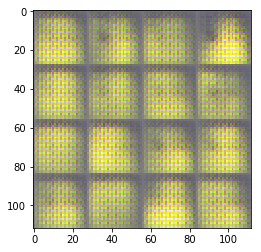

Epoch 1/1... Discriminator Loss: 0.9230... Generator Loss: 2.2232
Epoch 1/1... Discriminator Loss: 1.4939... Generator Loss: 0.8583
Epoch 1/1... Discriminator Loss: 0.8319... Generator Loss: 4.5062
Epoch 1/1... Discriminator Loss: 5.7662... Generator Loss: 0.0114
Epoch 1/1... Discriminator Loss: 4.7892... Generator Loss: 13.3787
Epoch 1/1... Discriminator Loss: 0.5154... Generator Loss: 3.0066
Epoch 1/1... Discriminator Loss: 4.3471... Generator Loss: 0.0854
Epoch 1/1... Discriminator Loss: 3.7445... Generator Loss: 7.8703
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 1.0955
Epoch 1/1... Discriminator Loss: 2.0019... Generator Loss: 0.3913
Epoch 1/1... Discriminator Loss: 3.0854... Generator Loss: 5.5523
Epoch 1/1... Discriminator Loss: 1.3466... Generator Loss: 0.5577
Epoch 1/1... Discriminator Loss: 0.8195... Generator Loss: 1.4339
Epoch 1/1... Discriminator Loss: 0.7353... Generator Loss: 1.4591
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 0.6445
Epoch 1/1

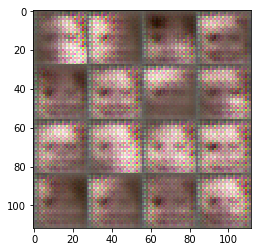

Epoch 1/1... Discriminator Loss: 1.6310... Generator Loss: 4.0758
Epoch 1/1... Discriminator Loss: 2.8799... Generator Loss: 0.0832
Epoch 1/1... Discriminator Loss: 2.0107... Generator Loss: 5.0411
Epoch 1/1... Discriminator Loss: 0.6215... Generator Loss: 1.3257
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.4919
Epoch 1/1... Discriminator Loss: 0.7601... Generator Loss: 2.7295
Epoch 1/1... Discriminator Loss: 0.9029... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 0.8372... Generator Loss: 1.2793
Epoch 1/1... Discriminator Loss: 1.0432... Generator Loss: 0.7578
Epoch 1/1... Discriminator Loss: 0.8425... Generator Loss: 1.7157
Epoch 1/1... Discriminator Loss: 2.1253... Generator Loss: 0.1876
Epoch 1/1... Discriminator Loss: 3.3150... Generator Loss: 4.8705
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.4093
Epoch 1/1... Discriminator Loss: 0.8708... Generator Loss: 0.9922
Epoch 1/1... Discriminator Loss: 0.6269... Generator Loss: 1.2198
Epoch 1/1.

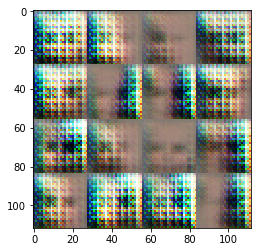

Epoch 1/1... Discriminator Loss: 0.7322... Generator Loss: 0.8661
Epoch 1/1... Discriminator Loss: 0.5194... Generator Loss: 2.3920
Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 2.4721
Epoch 1/1... Discriminator Loss: 1.8596... Generator Loss: 0.2519
Epoch 1/1... Discriminator Loss: 2.5279... Generator Loss: 5.4216
Epoch 1/1... Discriminator Loss: 0.8923... Generator Loss: 1.3665
Epoch 1/1... Discriminator Loss: 1.7757... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 2.4093... Generator Loss: 3.6284
Epoch 1/1... Discriminator Loss: 2.5979... Generator Loss: 0.1773
Epoch 1/1... Discriminator Loss: 1.8111... Generator Loss: 0.5613
Epoch 1/1... Discriminator Loss: 1.5251... Generator Loss: 3.1060
Epoch 1/1... Discriminator Loss: 1.5675... Generator Loss: 0.4256
Epoch 1/1... Discriminator Loss: 0.9175... Generator Loss: 2.0582
Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 0.5254
Epoch 1/1.

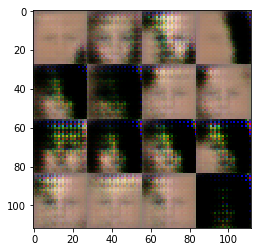

Epoch 1/1... Discriminator Loss: 1.0087... Generator Loss: 1.8723
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.4508
Epoch 1/1... Discriminator Loss: 0.9800... Generator Loss: 2.1883
Epoch 1/1... Discriminator Loss: 0.8975... Generator Loss: 0.9336
Epoch 1/1... Discriminator Loss: 0.9767... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.0086... Generator Loss: 0.9632
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 0.9967... Generator Loss: 0.9511
Epoch 1/1... Discriminator Loss: 0.9822... Generator Loss: 1.3644
Epoch 1/1... Discriminator Loss: 0.7350... Generator Loss: 1.4503
Epoch 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.0415
Epoch 1/1... Discriminator Loss: 0.7830... Generator Loss: 1.6117
Epoch 1/1... Discriminator Loss: 1.3754... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 3.3220
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.4647
Epoch 1/1.

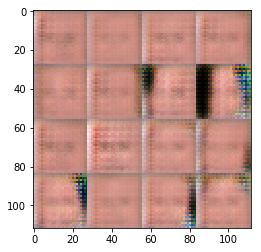

Epoch 1/1... Discriminator Loss: 1.5545... Generator Loss: 1.4004
Epoch 1/1... Discriminator Loss: 1.0422... Generator Loss: 0.9200
Epoch 1/1... Discriminator Loss: 1.1925... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 0.9783... Generator Loss: 0.9220
Epoch 1/1... Discriminator Loss: 1.0913... Generator Loss: 0.9278
Epoch 1/1... Discriminator Loss: 1.1042... Generator Loss: 1.4342
Epoch 1/1... Discriminator Loss: 1.4826... Generator Loss: 0.4160
Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 1.6082
Epoch 1/1... Discriminator Loss: 1.5925... Generator Loss: 0.3906
Epoch 1/1... Discriminator Loss: 1.1722... Generator Loss: 1.8115
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 0.6887
Epoch 1/1... Discriminator Loss: 1.0619... Generator Loss: 0.8092
Epoch 1/1... Discriminator Loss: 1.3054... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.8586... Generator Loss: 0.3303
Epoch 1/1.

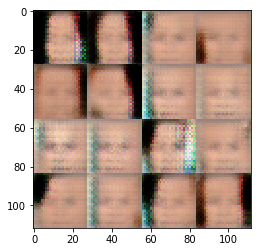

Epoch 1/1... Discriminator Loss: 2.1019... Generator Loss: 0.1873
Epoch 1/1... Discriminator Loss: 1.4727... Generator Loss: 2.0894
Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 0.8595
Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.5160
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 1.1166
Epoch 1/1... Discriminator Loss: 1.1419... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 0.6462
Epoch 1/1... Discriminator Loss: 1.1826... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 1.3477... Generator Loss: 0.5733
Epoch 1/1... Discriminator Loss: 1.1710... Generator Loss: 0.6760
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 1.1621
Epoch 1/1... Discriminator Loss: 1.7367... Generator Loss: 0.3120
Epoch 1/1... Discriminator Loss: 1.6701... Generator Loss: 1.5297
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.5411
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.7997
Epoch 1/1.

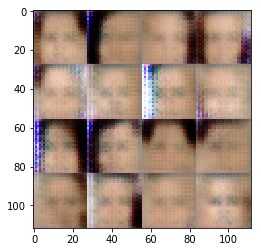

Epoch 1/1... Discriminator Loss: 1.6999... Generator Loss: 0.2983
Epoch 1/1... Discriminator Loss: 1.0692... Generator Loss: 1.2998
Epoch 1/1... Discriminator Loss: 1.2835... Generator Loss: 0.5948
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.8625
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.6666
Epoch 1/1... Discriminator Loss: 1.2807... Generator Loss: 1.4351
Epoch 1/1... Discriminator Loss: 1.8497... Generator Loss: 0.2543
Epoch 1/1... Discriminator Loss: 1.8441... Generator Loss: 1.7496
Epoch 1/1... Discriminator Loss: 1.6588... Generator Loss: 0.3408
Epoch 1/1... Discriminator Loss: 1.3582... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3382... Generator Loss: 1.1245
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.5893
Epoch 1/1... Discriminator Loss: 1.5509... Generator Loss: 0.9778
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.3653
Epoch 1/1... Discriminator Loss: 1.4238... Generator Loss: 1.2062
Epoch 1/1.

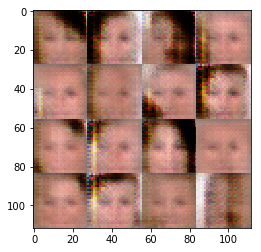

Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.7247
Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.5219
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.9131
Epoch 1/1... Discriminator Loss: 1.6512... Generator Loss: 0.3845
Epoch 1/1... Discriminator Loss: 1.5477... Generator Loss: 0.6687
Epoch 1/1... Discriminator Loss: 1.4557... Generator Loss: 0.9296
Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 0.7335
Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 0.5405
Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.3254... Generator Loss: 1.1323
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.4067
Epoch 1/1... Discriminator Loss: 1.1970... Generator Loss: 1.5438
Epoch 1/1... Discriminator Loss: 1.1564... Generator Loss: 0.5792
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 1.1862... Generator Loss: 1.2657
Epoch 1/1.

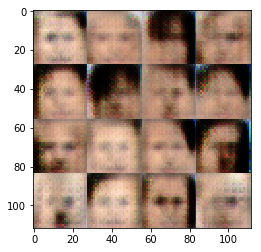

Epoch 1/1... Discriminator Loss: 1.4770... Generator Loss: 1.0318
Epoch 1/1... Discriminator Loss: 1.6811... Generator Loss: 0.4618
Epoch 1/1... Discriminator Loss: 1.6447... Generator Loss: 0.6318
Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 1.0820
Epoch 1/1... Discriminator Loss: 1.5466... Generator Loss: 0.6015
Epoch 1/1... Discriminator Loss: 1.4521... Generator Loss: 0.6514
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 1.1834
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.5497
Epoch 1/1... Discriminator Loss: 1.5780... Generator Loss: 0.5558
Epoch 1/1... Discriminator Loss: 1.5332... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 0.8751
Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.1929... Generator Loss: 0.9972
Epoch 1/1... Discriminator Loss: 1.0877... Generator Loss: 0.6947
Epoch 1/1... Discriminator Loss: 0.9983... Generator Loss: 1.0626
Epoch 1/1.

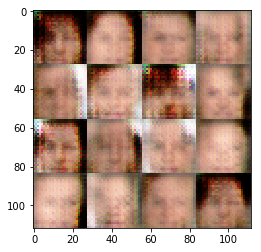

Epoch 1/1... Discriminator Loss: 1.3433... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.4432... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.6511... Generator Loss: 0.4994
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 1.1509
Epoch 1/1... Discriminator Loss: 1.1771... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 1.4462... Generator Loss: 0.4412
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 1.1010
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.5069
Epoch 1/1... Discriminator Loss: 0.9928... Generator Loss: 1.0850
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.3973
Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 1.5274
Epoch 1/1... Discriminator Loss: 2.0660... Generator Loss: 0.1947
Epoch 1/1... Discriminator Loss: 2.1907... Generator Loss: 2.5966
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.6257... Generator Loss: 0.3593
Epoch 1/1.

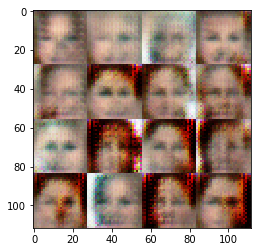

Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 0.9210
Epoch 1/1... Discriminator Loss: 1.9550... Generator Loss: 0.2480
Epoch 1/1... Discriminator Loss: 2.1589... Generator Loss: 1.9183
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.5034
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.5816
Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 1.1527
Epoch 1/1... Discriminator Loss: 1.1580... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.2135... Generator Loss: 0.7283
Epoch 1/1... Discriminator Loss: 1.2498... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.1900... Generator Loss: 0.9152
Epoch 1/1... Discriminator Loss: 1.2547... Generator Loss: 0.5626
Epoch 1/1... Discriminator Loss: 1.1526... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.0839... Generator Loss: 0.9228
Epoch 1/1... Discriminator Loss: 1.4750... Generator Loss: 0.4779
Epoch 1/1.

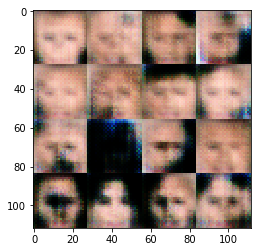

Epoch 1/1... Discriminator Loss: 1.0192... Generator Loss: 0.9271
Epoch 1/1... Discriminator Loss: 1.1271... Generator Loss: 0.6081
Epoch 1/1... Discriminator Loss: 1.0562... Generator Loss: 1.0378
Epoch 1/1... Discriminator Loss: 1.0783... Generator Loss: 0.9127
Epoch 1/1... Discriminator Loss: 1.8516... Generator Loss: 0.2340
Epoch 1/1... Discriminator Loss: 2.4167... Generator Loss: 3.0801
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.9129
Epoch 1/1... Discriminator Loss: 1.6404... Generator Loss: 0.2970
Epoch 1/1... Discriminator Loss: 1.2337... Generator Loss: 1.0494
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.5759
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.7911
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.6321
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.6489
Epoch 1/1.

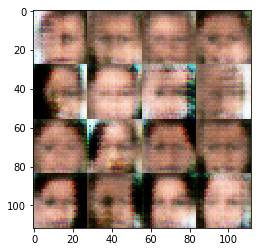

Epoch 1/1... Discriminator Loss: 1.5664... Generator Loss: 0.3299
Epoch 1/1... Discriminator Loss: 1.6409... Generator Loss: 1.5197
Epoch 1/1... Discriminator Loss: 1.6394... Generator Loss: 0.3390
Epoch 1/1... Discriminator Loss: 1.2046... Generator Loss: 1.4046
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 1.1912
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.4751
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 0.9773
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.8677
Epoch 1/1... Discriminator Loss: 1.8024... Generator Loss: 0.2538
Epoch 1/1... Discriminator Loss: 2.1514... Generator Loss: 2.0544
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.2519... Generator Loss: 0.6389
Epoch 1/1... Discriminator Loss: 1.1248... Generator Loss: 0.9506
Epoch 1/1... Discriminator Loss: 1.1027... Generator Loss: 0.9281
Epoch 1/1.

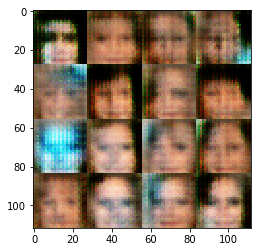

Epoch 1/1... Discriminator Loss: 1.0921... Generator Loss: 0.8727
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 0.6793
Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.5834
Epoch 1/1... Discriminator Loss: 2.0934... Generator Loss: 2.4248
Epoch 1/1... Discriminator Loss: 1.7665... Generator Loss: 0.2344
Epoch 1/1... Discriminator Loss: 0.9814... Generator Loss: 0.9814
Epoch 1/1... Discriminator Loss: 0.9778... Generator Loss: 0.9685
Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 1.2983
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.4466
Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 1.4627
Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.4376
Epoch 1/1... Discriminator Loss: 1.2064... Generator Loss: 0.8996
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.0854
Epoch 1/1... Discriminator Loss: 1.5266... Generator Loss: 0.3891
Epoch 1/1.

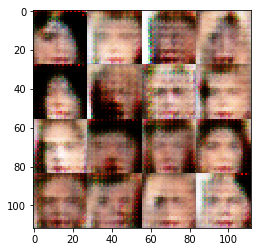

Epoch 1/1... Discriminator Loss: 1.2754... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.8475
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.5817
Epoch 1/1... Discriminator Loss: 1.2832... Generator Loss: 1.3306
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.4706
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.8152
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.5977
Epoch 1/1... Discriminator Loss: 1.2938... Generator Loss: 1.5179
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.3843
Epoch 1/1... Discriminator Loss: 0.9653... Generator Loss: 0.9959
Epoch 1/1... Discriminator Loss: 1.0724... Generator Loss: 1.0319
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.3351... Generator Loss: 0.5062
Epoch 1/1... Discriminator Loss: 2.1793... Generator Loss: 2.5531
Epoch 1/1... Discriminator Loss: 1.1047... Generator Loss: 0.6987
Epoch 1/1.

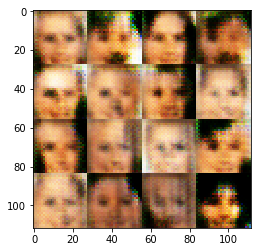

Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.9703
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.7909
Epoch 1/1... Discriminator Loss: 1.4802... Generator Loss: 0.3826
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 1.4980
Epoch 1/1... Discriminator Loss: 1.4812... Generator Loss: 0.4669
Epoch 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.6367
Epoch 1/1... Discriminator Loss: 1.2415... Generator Loss: 1.2747
Epoch 1/1... Discriminator Loss: 1.5479... Generator Loss: 0.3484
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 1.4930
Epoch 1/1... Discriminator Loss: 1.0679... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.0304... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.1411... Generator Loss: 1.3463
Epoch 1/1... Discriminator Loss: 1.4621... Generator Loss: 0.3706
Epoch 1/1... Discriminator Loss: 1.1917... Generator Loss: 1.4555
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.4816
Epoch 1/1.

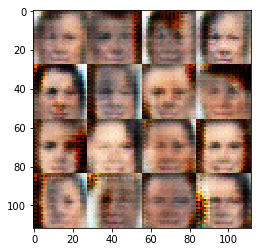

Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.8539
Epoch 1/1... Discriminator Loss: 1.0020... Generator Loss: 0.9344
Epoch 1/1... Discriminator Loss: 0.8258... Generator Loss: 0.9620
Epoch 1/1... Discriminator Loss: 0.8180... Generator Loss: 0.8540
Epoch 1/1... Discriminator Loss: 0.9533... Generator Loss: 1.0104
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.6852
Epoch 1/1... Discriminator Loss: 1.5848... Generator Loss: 1.3860
Epoch 1/1... Discriminator Loss: 2.0729... Generator Loss: 0.1925
Epoch 1/1... Discriminator Loss: 2.8523... Generator Loss: 2.2987
Epoch 1/1... Discriminator Loss: 1.0384... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 1.0752... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 1.2597
Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 0.4962
Epoch 1/1... Discriminator Loss: 1.8202... Generator Loss: 2.1279
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.5571
Epoch 1/1.

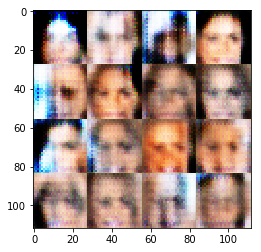

Epoch 1/1... Discriminator Loss: 1.2061... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.9110
Epoch 1/1... Discriminator Loss: 1.1705... Generator Loss: 0.6666
Epoch 1/1... Discriminator Loss: 1.1665... Generator Loss: 0.8636
Epoch 1/1... Discriminator Loss: 2.0094... Generator Loss: 0.1983
Epoch 1/1... Discriminator Loss: 2.9538... Generator Loss: 3.1272
Epoch 1/1... Discriminator Loss: 1.1364... Generator Loss: 0.9525
Epoch 1/1... Discriminator Loss: 1.5924... Generator Loss: 0.3006
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 1.3732
Epoch 1/1... Discriminator Loss: 1.0888... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 1.5179... Generator Loss: 0.3973
Epoch 1/1... Discriminator Loss: 1.1436... Generator Loss: 1.3599
Epoch 1/1... Discriminator Loss: 1.1068... Generator Loss: 0.8056
Epoch 1/1... Discriminator Loss: 1.5343... Generator Loss: 0.3718
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.9829
Epoch 1/1.

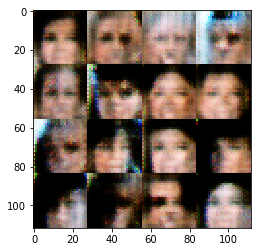

Epoch 1/1... Discriminator Loss: 0.9791... Generator Loss: 1.2887
Epoch 1/1... Discriminator Loss: 1.5822... Generator Loss: 0.2881
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 2.1631
Epoch 1/1... Discriminator Loss: 1.1146... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.1898... Generator Loss: 0.5258
Epoch 1/1... Discriminator Loss: 1.1315... Generator Loss: 0.8635
Epoch 1/1... Discriminator Loss: 0.9902... Generator Loss: 0.9687
Epoch 1/1... Discriminator Loss: 1.5526... Generator Loss: 0.3698
Epoch 1/1... Discriminator Loss: 1.5572... Generator Loss: 1.2895
Epoch 1/1... Discriminator Loss: 1.9304... Generator Loss: 0.2681
Epoch 1/1... Discriminator Loss: 1.6370... Generator Loss: 1.8549
Epoch 1/1... Discriminator Loss: 0.9915... Generator Loss: 0.6492
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.5586
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.8156
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 1.1273
Epoch 1/1.

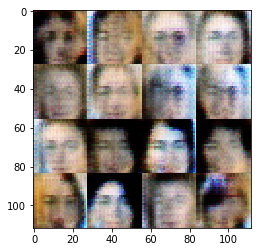

Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 1.4224
Epoch 1/1... Discriminator Loss: 1.6724... Generator Loss: 0.2588
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 1.4433
Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.4903
Epoch 1/1... Discriminator Loss: 1.1240... Generator Loss: 1.1252
Epoch 1/1... Discriminator Loss: 1.6263... Generator Loss: 0.3383
Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 1.0727
Epoch 1/1... Discriminator Loss: 1.5119... Generator Loss: 0.3632
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 1.2213
Epoch 1/1... Discriminator Loss: 1.0895... Generator Loss: 0.4947
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.4890
Epoch 1/1... Discriminator Loss: 2.7771... Generator Loss: 2.9898
Epoch 1/1... Discriminator Loss: 1.4491... Generator Loss: 0.3760
Epoch 1/1... Discriminator Loss: 1.6655... Generator Loss: 1.9009
Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 0.5231
Epoch 1/1.

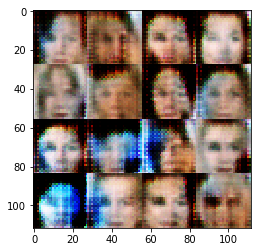

Epoch 1/1... Discriminator Loss: 1.1920... Generator Loss: 0.5362
Epoch 1/1... Discriminator Loss: 1.5159... Generator Loss: 1.9689
Epoch 1/1... Discriminator Loss: 0.9797... Generator Loss: 0.7871
Epoch 1/1... Discriminator Loss: 1.6085... Generator Loss: 0.2933
Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 0.8394
Epoch 1/1... Discriminator Loss: 1.1671... Generator Loss: 1.8399
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.2498... Generator Loss: 0.5067
Epoch 1/1... Discriminator Loss: 1.7772... Generator Loss: 1.6334
Epoch 1/1... Discriminator Loss: 1.5912... Generator Loss: 0.2971
Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 1.1589
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.5963... Generator Loss: 0.3456
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 1.3663
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.8672
Epoch 1/1.

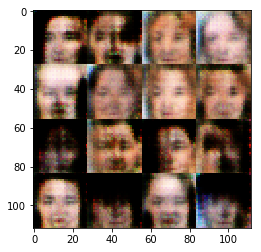

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.6263
Epoch 1/1... Discriminator Loss: 1.2172... Generator Loss: 1.0134
Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.5106
Epoch 1/1... Discriminator Loss: 1.4203... Generator Loss: 1.5320
Epoch 1/1... Discriminator Loss: 1.9163... Generator Loss: 0.2551
Epoch 1/1... Discriminator Loss: 1.9897... Generator Loss: 1.9371
Epoch 1/1... Discriminator Loss: 1.2326... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.5383... Generator Loss: 0.3792
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.6273
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 0.9153
Epoch 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.5306
Epoch 1/1... Discriminator Loss: 1.1287... Generator Loss: 1.2027
Epoch 1/1.

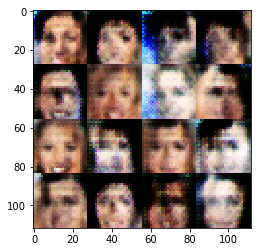

Epoch 1/1... Discriminator Loss: 1.0006... Generator Loss: 0.8956
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.6716
Epoch 1/1... Discriminator Loss: 1.2192... Generator Loss: 0.7720
Epoch 1/1... Discriminator Loss: 1.2893... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.2550... Generator Loss: 1.1308
Epoch 1/1... Discriminator Loss: 1.7337... Generator Loss: 0.2794
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 1.6482
Epoch 1/1... Discriminator Loss: 1.1664... Generator Loss: 0.7103
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.4863
Epoch 1/1... Discriminator Loss: 1.6002... Generator Loss: 1.7903
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.4320
Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 1.0450
Epoch 1/1... Discriminator Loss: 1.3783... Generator Loss: 0.5700
Epoch 1/1... Discriminator Loss: 1.1794... Generator Loss: 0.5864
Epoch 1/1... Discriminator Loss: 1.1571... Generator Loss: 1.0584
Epoch 1/1.

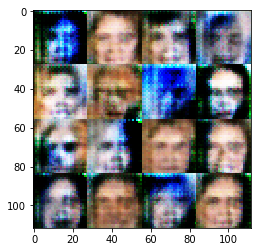

Epoch 1/1... Discriminator Loss: 2.5541... Generator Loss: 0.1072
Epoch 1/1... Discriminator Loss: 1.4350... Generator Loss: 1.6866
Epoch 1/1... Discriminator Loss: 0.9533... Generator Loss: 1.3420
Epoch 1/1... Discriminator Loss: 1.6235... Generator Loss: 0.3254
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 1.4155
Epoch 1/1... Discriminator Loss: 1.1482... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.7295
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.5687
Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.9299
Epoch 1/1... Discriminator Loss: 1.0753... Generator Loss: 0.6321
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5734
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 1.0782
Epoch 1/1... Discriminator Loss: 1.7453... Generator Loss: 0.2943
Epoch 1/1... Discriminator Loss: 1.8691... Generator Loss: 2.1176
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 0.4590
Epoch 1/1.

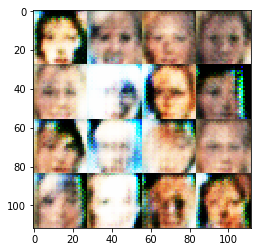

Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.3332
Epoch 1/1... Discriminator Loss: 1.1435... Generator Loss: 1.1428
Epoch 1/1... Discriminator Loss: 1.1178... Generator Loss: 0.8684
Epoch 1/1... Discriminator Loss: 1.3409... Generator Loss: 0.4305
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 1.6163
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.4025
Epoch 1/1... Discriminator Loss: 1.1274... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.9436
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 0.8792
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.4782
Epoch 1/1... Discriminator Loss: 1.2189... Generator Loss: 1.2310
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.5544
Epoch 1/1... Discriminator Loss: 1.1847... Generator Loss: 1.0671
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.4801
Epoch 1/1.

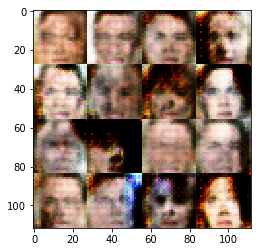

Epoch 1/1... Discriminator Loss: 0.9851... Generator Loss: 1.3257
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.4602
Epoch 1/1... Discriminator Loss: 1.4636... Generator Loss: 1.5618
Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 0.6473
Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 0.8697
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.8425... Generator Loss: 0.2805
Epoch 1/1... Discriminator Loss: 1.6631... Generator Loss: 1.7881
Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.5366
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.9346
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 0.9175
Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.5191
Epoch 1/1... Discriminator Loss: 1.1849... Generator Loss: 1.2497
Epoch 1/1... Discriminator Loss: 0.9334... Generator Loss: 1.1864
Epoch 1/1.

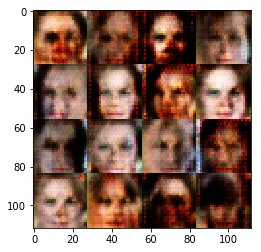

Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 1.2436
Epoch 1/1... Discriminator Loss: 1.0212... Generator Loss: 0.7724
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 0.5525
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 1.1464
Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 0.5271
Epoch 1/1... Discriminator Loss: 1.1663... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.4720
Epoch 1/1... Discriminator Loss: 1.6005... Generator Loss: 1.3371
Epoch 1/1... Discriminator Loss: 1.3232... Generator Loss: 0.5603
Epoch 1/1... Discriminator Loss: 1.9377... Generator Loss: 0.2532
Epoch 1/1... Discriminator Loss: 2.1316... Generator Loss: 2.0446
Epoch 1/1... Discriminator Loss: 1.0062... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.4818
Epoch 1/1... Discriminator Loss: 1.2072... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.3559... Generator Loss: 0.4717
Epoch 1/1.

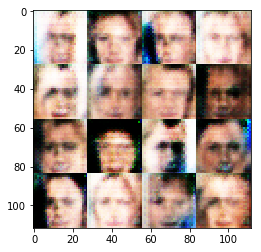

Epoch 1/1... Discriminator Loss: 1.5610... Generator Loss: 0.3531
Epoch 1/1... Discriminator Loss: 1.0387... Generator Loss: 1.0294
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.7650
Epoch 1/1... Discriminator Loss: 1.5691... Generator Loss: 0.3458
Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 1.4159
Epoch 1/1... Discriminator Loss: 1.0775... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.4789
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.5041
Epoch 1/1... Discriminator Loss: 1.0652... Generator Loss: 1.5207
Epoch 1/1... Discriminator Loss: 1.0598... Generator Loss: 0.9584
Epoch 1/1... Discriminator Loss: 1.5931... Generator Loss: 0.3250
Epoch 1/1... Discriminator Loss: 1.2338... Generator Loss: 1.0307
Epoch 1/1... Discriminator Loss: 0.8387... Generator Loss: 1.3868
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.6065
Epoch 1/1.

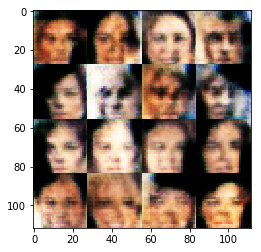

Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 1.8028
Epoch 1/1... Discriminator Loss: 2.2145... Generator Loss: 0.1409
Epoch 1/1... Discriminator Loss: 2.2312... Generator Loss: 2.7366
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 1.3134
Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.4745
Epoch 1/1... Discriminator Loss: 1.1880... Generator Loss: 0.6549
Epoch 1/1... Discriminator Loss: 1.1524... Generator Loss: 1.0871
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 1.0245
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.5827
Epoch 1/1... Discriminator Loss: 1.1998... Generator Loss: 0.7854
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.7949
Epoch 1/1... Discriminator Loss: 1.1837... Generator Loss: 0.5990
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.6455
Epoch 1/1... Discriminator Loss: 1.3994... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.7223
Epoch 1/1.

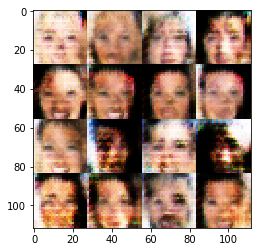

Epoch 1/1... Discriminator Loss: 1.6335... Generator Loss: 1.4643
Epoch 1/1... Discriminator Loss: 1.2200... Generator Loss: 0.6057
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.3787
Epoch 1/1... Discriminator Loss: 1.3789... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.9651
Epoch 1/1... Discriminator Loss: 1.3080... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.5225
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.1431... Generator Loss: 1.3541
Epoch 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.2500... Generator Loss: 0.5404
Epoch 1/1... Discriminator Loss: 1.8861... Generator Loss: 1.8096
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.5849
Epoch 1/1... Discriminator Loss: 1.5355... Generator Loss: 0.3188
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 1.2925
Epoch 1/1.

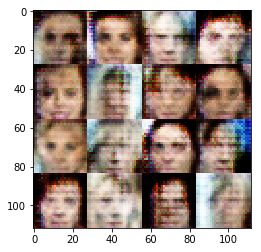

Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.2785... Generator Loss: 0.7554
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.2567... Generator Loss: 0.6290
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 1.7302
Epoch 1/1... Discriminator Loss: 1.3045... Generator Loss: 0.4674
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.4397
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 1.2467
Epoch 1/1... Discriminator Loss: 1.1243... Generator Loss: 0.6897
Epoch 1/1... Discriminator Loss: 1.0956... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.0687... Generator Loss: 0.9893
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 0.9827
Epoch 1/1... Discriminator Loss: 1.0094... Generator Loss: 0.6272
Epoch 1/1... Discriminator Loss: 0.9353... Generator Loss: 1.2139
Epoch 1/1.

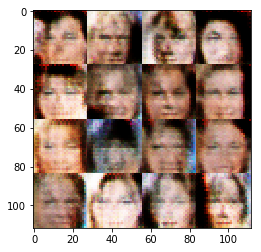

Epoch 1/1... Discriminator Loss: 2.2826... Generator Loss: 2.8527
Epoch 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.5951
Epoch 1/1... Discriminator Loss: 1.3754... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 0.7872
Epoch 1/1... Discriminator Loss: 1.1320... Generator Loss: 1.0034
Epoch 1/1... Discriminator Loss: 1.2137... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.1874... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.1562... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.8637
Epoch 1/1... Discriminator Loss: 1.1317... Generator Loss: 1.0808
Epoch 1/1... Discriminator Loss: 1.3232... Generator Loss: 0.4372
Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 1.1729
Epoch 1/1... Discriminator Loss: 1.8676... Generator Loss: 0.2440
Epoch 1/1... Discriminator Loss: 1.4656... Generator Loss: 1.9039
Epoch 1/1.

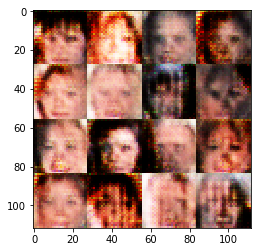

Epoch 1/1... Discriminator Loss: 2.1259... Generator Loss: 2.7700
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 1.2039
Epoch 1/1... Discriminator Loss: 1.6599... Generator Loss: 0.2659
Epoch 1/1... Discriminator Loss: 1.2323... Generator Loss: 0.9196
Epoch 1/1... Discriminator Loss: 1.0341... Generator Loss: 1.0077
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.5426
Epoch 1/1... Discriminator Loss: 1.2147... Generator Loss: 0.8430
Epoch 1/1... Discriminator Loss: 1.1412... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.5314
Epoch 1/1... Discriminator Loss: 1.3976... Generator Loss: 1.2047
Epoch 1/1... Discriminator Loss: 1.0943... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 1.3068... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.2739... Generator Loss: 0.5886
Epoch 1/1... Discriminator Loss: 1.2398... Generator Loss: 1.3730
Epoch 1/1... Discriminator Loss: 0.9827... Generator Loss: 0.8362
Epoch 1/1.

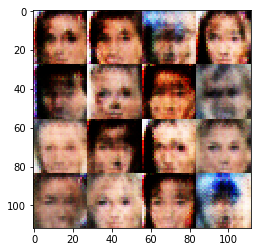

Epoch 1/1... Discriminator Loss: 1.9308... Generator Loss: 1.7432
Epoch 1/1... Discriminator Loss: 1.4206... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.4864
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.8630
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.4879... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.5484... Generator Loss: 0.5297
Epoch 1/1... Discriminator Loss: 1.5277... Generator Loss: 0.5146
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.6661
Epoch 1/1... Discriminator Loss: 1.4993... Generator Loss: 0.6935
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.6048
Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.9850
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.8040
Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 0.6936
Epoch 1/1.

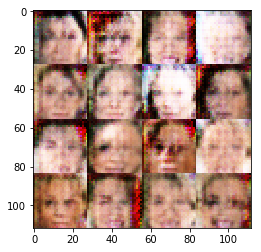

Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.9359
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.9141
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.7836
Epoch 1/1... Discriminator Loss: 1.4394... Generator Loss: 0.5862
Epoch 1/1... Discriminator Loss: 1.4588... Generator Loss: 0.5817
Epoch 1/1... Discriminator Loss: 1.4213... Generator Loss: 0.8907
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 0.8946
Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.4445... Generator Loss: 0.5204
Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 1.3102
Epoch 1/1... Discriminator Loss: 1.0500... Generator Loss: 0.8770
Epoch 1/1... Discriminator Loss: 1.0436... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.5294
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 1.3623
Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 0.9590
Epoch 1/1.

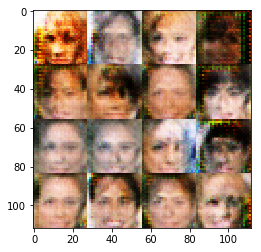

Epoch 1/1... Discriminator Loss: 1.1969... Generator Loss: 0.5958
Epoch 1/1... Discriminator Loss: 1.7051... Generator Loss: 0.2863
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 1.3870
Epoch 1/1... Discriminator Loss: 1.2331... Generator Loss: 0.6592
Epoch 1/1... Discriminator Loss: 1.5143... Generator Loss: 0.3703
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 1.4796
Epoch 1/1... Discriminator Loss: 1.0678... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.3786... Generator Loss: 0.5900
Epoch 1/1... Discriminator Loss: 1.1630... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.0318... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.8055
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 1.0216
Epoch 1/1... Discriminator Loss: 1.2455... Generator Loss: 0.8953
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.4069
Epoch 1/1.

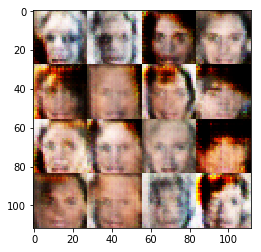

Epoch 1/1... Discriminator Loss: 1.1302... Generator Loss: 0.5663
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 0.5738
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 1.4891
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.5808
Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 1.0643
Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.5978
Epoch 1/1... Discriminator Loss: 1.1630... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.1025... Generator Loss: 1.0239
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.4815
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 1.8443
Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.4866
Epoch 1/1... Discriminator Loss: 1.5333... Generator Loss: 1.5859
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.6207
Epoch 1/1.

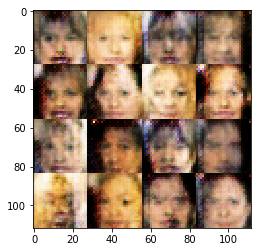

Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.5658
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.5144
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.8333
Epoch 1/1... Discriminator Loss: 1.1919... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 0.8980... Generator Loss: 1.5490
Epoch 1/1... Discriminator Loss: 1.0664... Generator Loss: 0.5758
Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.4700
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.2033... Generator Loss: 0.5696
Epoch 1/1... Discriminator Loss: 1.0675... Generator Loss: 1.1469
Epoch 1/1... Discriminator Loss: 1.2464... Generator Loss: 0.5049
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 1.2645... Generator Loss: 0.7830
Epoch 1/1... Discriminator Loss: 1.4231... Generator Loss: 0.5124
Epoch 1/1.

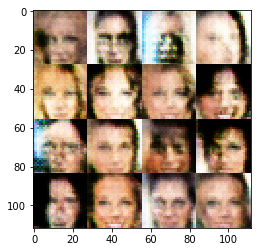

Epoch 1/1... Discriminator Loss: 1.3926... Generator Loss: 1.3225
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 1.3960
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.3720
Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 0.8363
Epoch 1/1... Discriminator Loss: 1.0559... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 1.3590
Epoch 1/1... Discriminator Loss: 1.5079... Generator Loss: 0.3379
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 1.1728
Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.5442
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.5182
Epoch 1/1... Discriminator Loss: 1.5903... Generator Loss: 0.5184
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 1.1037
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.5250
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.8003
Epoch 1/1.

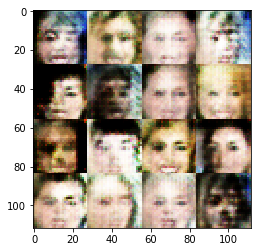

Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 1.0933
Epoch 1/1... Discriminator Loss: 1.3345... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.1650... Generator Loss: 0.7021
Epoch 1/1... Discriminator Loss: 1.1720... Generator Loss: 0.7781
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 1.3829
Epoch 1/1... Discriminator Loss: 1.2951... Generator Loss: 0.4162
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.2096... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.5073... Generator Loss: 1.6232
Epoch 1/1... Discriminator Loss: 1.1514... Generator Loss: 0.8509
Epoch 1/1... Discriminator Loss: 1.2616... Generator Loss: 0.4377
Epoch 1/1... Discriminator Loss: 1.2826... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 1.1455
Epoch 1/1... Discriminator Loss: 1.3250... Generator Loss: 0.5832
Epoch 1/1.

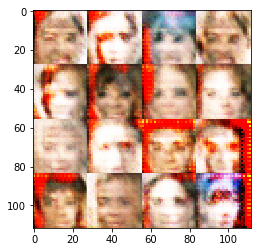

Epoch 1/1... Discriminator Loss: 0.9408... Generator Loss: 1.0329
Epoch 1/1... Discriminator Loss: 0.7815... Generator Loss: 1.0329
Epoch 1/1... Discriminator Loss: 0.9421... Generator Loss: 0.9845
Epoch 1/1... Discriminator Loss: 0.7407... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 0.8205... Generator Loss: 0.9986
Epoch 1/1... Discriminator Loss: 0.6110... Generator Loss: 1.1929
Epoch 1/1... Discriminator Loss: 1.0443... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 1.8597
Epoch 1/1... Discriminator Loss: 2.2284... Generator Loss: 0.1486
Epoch 1/1... Discriminator Loss: 1.6572... Generator Loss: 1.4058
Epoch 1/1... Discriminator Loss: 3.1854... Generator Loss: 0.0681
Epoch 1/1... Discriminator Loss: 1.7088... Generator Loss: 1.1462
Epoch 1/1... Discriminator Loss: 1.6171... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.4964... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.8372
Epoch 1/1.

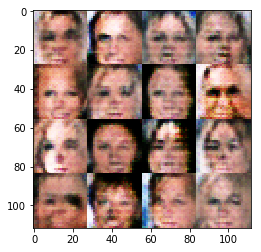

Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 1.1551
Epoch 1/1... Discriminator Loss: 1.7765... Generator Loss: 0.2513
Epoch 1/1... Discriminator Loss: 1.3993... Generator Loss: 1.2325
Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.9422
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.4677
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 1.4907
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.6992
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.5484
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.8369
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.2452... Generator Loss: 0.9287
Epoch 1/1... Discriminator Loss: 1.1940... Generator Loss: 0.7826
Epoch 1/1.

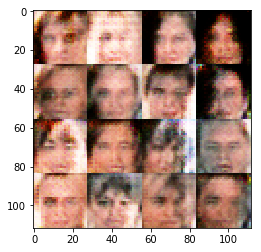

Epoch 1/1... Discriminator Loss: 1.2356... Generator Loss: 0.8466
Epoch 1/1... Discriminator Loss: 1.2047... Generator Loss: 1.0015
Epoch 1/1... Discriminator Loss: 1.2167... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.6059
Epoch 1/1... Discriminator Loss: 1.2593... Generator Loss: 0.8350
Epoch 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.5578
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 1.4009
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.5460... Generator Loss: 0.3759
Epoch 1/1... Discriminator Loss: 1.0411... Generator Loss: 0.9417
Epoch 1/1... Discriminator Loss: 1.2164... Generator Loss: 1.0730
Epoch 1/1... Discriminator Loss: 1.1573... Generator Loss: 0.7789
Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 0.5463
Epoch 1/1.

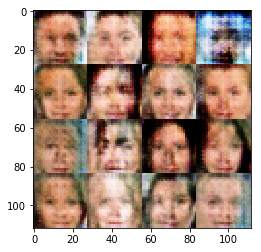

Epoch 1/1... Discriminator Loss: 1.2968... Generator Loss: 1.1597
Epoch 1/1... Discriminator Loss: 1.5190... Generator Loss: 0.4253
Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 1.0319
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.5468
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.5494
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 1.3547
Epoch 1/1... Discriminator Loss: 1.4902... Generator Loss: 0.4074
Epoch 1/1... Discriminator Loss: 1.5029... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.6252... Generator Loss: 1.2236
Epoch 1/1... Discriminator Loss: 1.0727... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 0.6105
Epoch 1/1... Discriminator Loss: 0.6711... Generator Loss: 1.0166
Epoch 1/1... Discriminator Loss: 0.9549... Generator Loss: 0.9262
Epoch 1/1.

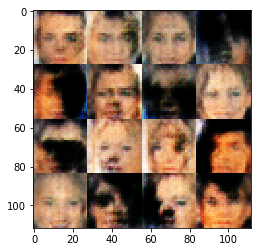

Epoch 1/1... Discriminator Loss: 1.5613... Generator Loss: 0.3550
Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 1.0701
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 0.9996
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.3826
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 1.3411
Epoch 1/1... Discriminator Loss: 1.0899... Generator Loss: 0.8344
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.6004
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.5008
Epoch 1/1... Discriminator Loss: 1.0452... Generator Loss: 1.0739
Epoch 1/1... Discriminator Loss: 1.5138... Generator Loss: 0.6898
Epoch 1/1... Discriminator Loss: 1.6363... Generator Loss: 0.3584
Epoch 1/1... Discriminator Loss: 1.1795... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.9816
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.4416
Epoch 1/1.

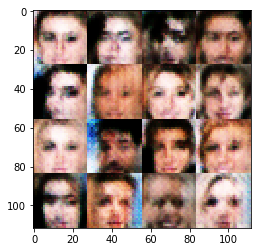

Epoch 1/1... Discriminator Loss: 1.5563... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 0.9968... Generator Loss: 1.0630
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.2559... Generator Loss: 0.6493
Epoch 1/1... Discriminator Loss: 1.4232... Generator Loss: 1.8148
Epoch 1/1... Discriminator Loss: 1.5539... Generator Loss: 0.3198
Epoch 1/1... Discriminator Loss: 1.1209... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.1186... Generator Loss: 0.9304
Epoch 1/1... Discriminator Loss: 1.7294... Generator Loss: 0.2606
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 1.3981
Epoch 1/1... Discriminator Loss: 1.3808... Generator Loss: 0.4424
Epoch 1/1... Discriminator Loss: 1.8485... Generator Loss: 0.2318
Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.7313... Generator Loss: 1.5704
Epoch 1/1.

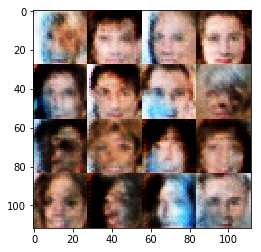

Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 0.5141
Epoch 1/1... Discriminator Loss: 1.8518... Generator Loss: 0.2979
Epoch 1/1... Discriminator Loss: 1.2687... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.5317... Generator Loss: 1.2679
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.6442
Epoch 1/1... Discriminator Loss: 1.6380... Generator Loss: 0.3339
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 2.1710
Epoch 1/1... Discriminator Loss: 0.8265... Generator Loss: 1.4129
Epoch 1/1... Discriminator Loss: 0.7670... Generator Loss: 0.7913
Epoch 1/1... Discriminator Loss: 0.9014... Generator Loss: 0.6958
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.4021
Epoch 1/1... Discriminator Loss: 1.2367... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.7077... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 0.8875... Generator Loss: 1.2378
Epoch 1/1... Discriminator Loss: 1.1802... Generator Loss: 0.7774
Epoch 1/1.

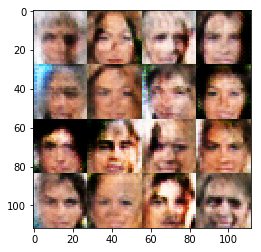

Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.8711
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 0.9540... Generator Loss: 0.9552
Epoch 1/1... Discriminator Loss: 1.1741... Generator Loss: 0.5397
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.5506
Epoch 1/1... Discriminator Loss: 0.9863... Generator Loss: 1.3643
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.3865
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.6051
Epoch 1/1... Discriminator Loss: 1.5742... Generator Loss: 1.2943
Epoch 1/1... Discriminator Loss: 1.0637... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.1637... Generator Loss: 1.0275
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.9947
Epoch 1/1.

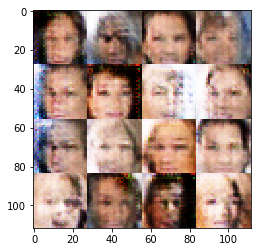

Epoch 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.2222... Generator Loss: 0.9487
Epoch 1/1... Discriminator Loss: 1.3026... Generator Loss: 0.9947
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.8285
Epoch 1/1... Discriminator Loss: 1.1499... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.4729... Generator Loss: 0.5136
Epoch 1/1... Discriminator Loss: 1.2032... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.9144
Epoch 1/1... Discriminator Loss: 1.2930... Generator Loss: 0.4736
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 1.5103... Generator Loss: 0.5871
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.9705
Epoch 1/1... Discriminator Loss: 1.1928... Generator Loss: 0.8276
Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.5283
Epoch 1/1.

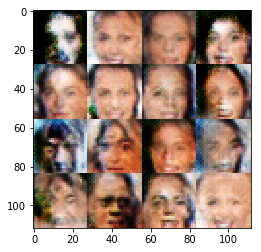

Epoch 1/1... Discriminator Loss: 1.2503... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.5009
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 1.2533
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.5651
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.3949
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 1.2803
Epoch 1/1... Discriminator Loss: 1.1149... Generator Loss: 1.1343
Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.3180... Generator Loss: 0.4059
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.8988
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 1.2859
Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.3350
Epoch 1/1... Discriminator Loss: 1.5744... Generator Loss: 0.5082
Epoch 1/1.

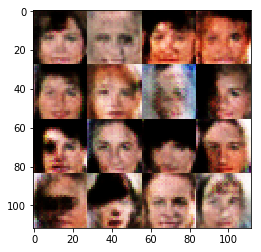

Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 1.0221
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.7565
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 1.0432
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6378
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.8322
Epoch 1/1... Discriminator Loss: 1.2087... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.1527... Generator Loss: 0.5507
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.9337
Epoch 1/1... Discriminator Loss: 1.3007... Generator Loss: 1.0133
Epoch 1/1... Discriminator Loss: 1.2042... Generator Loss: 0.5648
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.9038
Epoch 1/1... Discriminator Loss: 1.1374... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.5621
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 1.0187
Epoch 1/1.

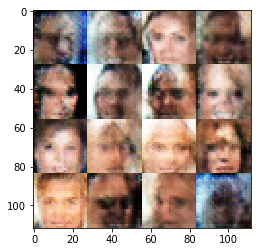

Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 1.3264
Epoch 1/1... Discriminator Loss: 1.2114... Generator Loss: 0.5590
Epoch 1/1... Discriminator Loss: 1.4715... Generator Loss: 0.5563
Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.8260
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.6512
Epoch 1/1... Discriminator Loss: 1.1110... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.0234... Generator Loss: 1.2020
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.7959
Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.5678
Epoch 1/1... Discriminator Loss: 1.1065... Generator Loss: 1.1837
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.4062
Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 1.8927
Epoch 1/1... Discriminator Loss: 0.9870... Generator Loss: 1.0120
Epoch 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.4373
Epoch 1/1.

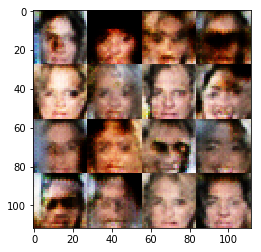

Epoch 1/1... Discriminator Loss: 1.5031... Generator Loss: 0.3893
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.6810
Epoch 1/1... Discriminator Loss: 1.3028... Generator Loss: 1.2926
Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 0.5444
Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 1.2421
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.8007
Epoch 1/1... Discriminator Loss: 1.1297... Generator Loss: 0.6601
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.8633
Epoch 1/1... Discriminator Loss: 1.2952... Generator Loss: 0.9776
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.6298
Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 0.5716
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.8611
Epoch 1/1.

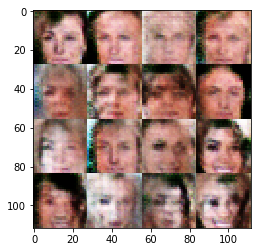

Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 1.2886
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 0.8982
Epoch 1/1... Discriminator Loss: 1.0832... Generator Loss: 0.5332
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 0.7329
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.6313... Generator Loss: 0.3516
Epoch 1/1... Discriminator Loss: 1.3231... Generator Loss: 1.2056
Epoch 1/1... Discriminator Loss: 1.8928... Generator Loss: 0.2099
Epoch 1/1... Discriminator Loss: 1.6590... Generator Loss: 0.4068
Epoch 1/1... Discriminator Loss: 2.6876... Generator Loss: 2.3292
Epoch 1/1... Discriminator Loss: 1.4883... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.4837... Generator Loss: 0.3727
Epoch 1/1... Discriminator Loss: 1.1264... Generator Loss: 0.8377
Epoch 1/1... Discriminator Loss: 1.1154... Generator Loss: 1.1637
Epoch 1/1.

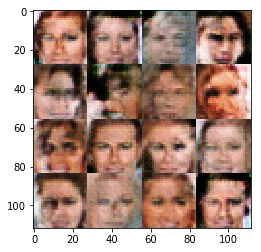

Epoch 1/1... Discriminator Loss: 1.5579... Generator Loss: 1.2558
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 1.1861... Generator Loss: 0.6483
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.5340
Epoch 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.4987... Generator Loss: 0.8725
Epoch 1/1... Discriminator Loss: 1.2285... Generator Loss: 0.5506
Epoch 1/1... Discriminator Loss: 1.1926... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.7871
Epoch 1/1... Discriminator Loss: 1.2129... Generator Loss: 0.6723
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 1.4739... Generator Loss: 0.3704
Epoch 1/1.

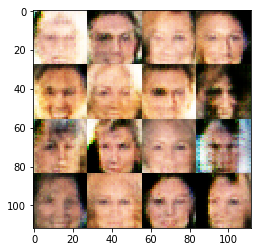

Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 1.2535
Epoch 1/1... Discriminator Loss: 1.3214... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 1.2466... Generator Loss: 0.6117
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 1.0245
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.3198
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 1.0472
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 1.1041
Epoch 1/1... Discriminator Loss: 1.6743... Generator Loss: 0.3178
Epoch 1/1... Discriminator Loss: 1.4828... Generator Loss: 1.1426
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.9327
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.4050
Epoch 1/1... Discriminator Loss: 1.1419... Generator Loss: 0.5889
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 1.0250
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.5470
Epoch 1/1... Discriminator Loss: 1.6419... Generator Loss: 0.5499
Epoch 1/1.

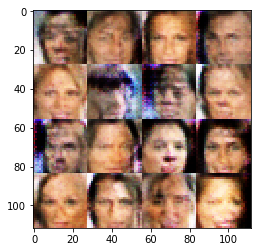

Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.9136
Epoch 1/1... Discriminator Loss: 1.9184... Generator Loss: 0.2325
Epoch 1/1... Discriminator Loss: 1.6515... Generator Loss: 1.5844
Epoch 1/1... Discriminator Loss: 1.0951... Generator Loss: 0.8883
Epoch 1/1... Discriminator Loss: 1.2127... Generator Loss: 0.5957
Epoch 1/1... Discriminator Loss: 1.2302... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.0994... Generator Loss: 0.8579
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 0.5771
Epoch 1/1... Discriminator Loss: 1.5601... Generator Loss: 1.3104
Epoch 1/1... Discriminator Loss: 1.4975... Generator Loss: 0.7921
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.5501
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.6238
Epoch 1/1.

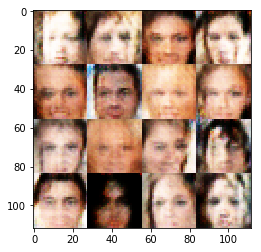

Epoch 1/1... Discriminator Loss: 1.7698... Generator Loss: 0.2882
Epoch 1/1... Discriminator Loss: 1.3144... Generator Loss: 1.2489
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.3822... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.3259... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.8003
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.2425... Generator Loss: 0.5537
Epoch 1/1... Discriminator Loss: 1.1836... Generator Loss: 0.5680
Epoch 1/1... Discriminator Loss: 1.2753... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 1.0656... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.9677
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.5628
Epoch 1/1... Discriminator Loss: 1.3023... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.5652
Epoch 1/1.

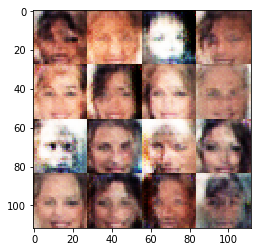

Epoch 1/1... Discriminator Loss: 0.9006... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.5939... Generator Loss: 0.3452
Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.6612... Generator Loss: 0.4211
Epoch 1/1... Discriminator Loss: 1.6439... Generator Loss: 1.5964
Epoch 1/1... Discriminator Loss: 1.7858... Generator Loss: 0.3802
Epoch 1/1... Discriminator Loss: 1.3487... Generator Loss: 1.3682
Epoch 1/1... Discriminator Loss: 1.4358... Generator Loss: 0.4601
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.9802
Epoch 1/1... Discriminator Loss: 1.2555... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.8756
Epoch 1/1... Discriminator Loss: 1.1669... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 1.2337... Generator Loss: 1.0481
Epoch 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.7035
Epoch 1/1.

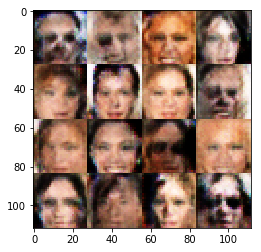

Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.6207
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.6109
Epoch 1/1... Discriminator Loss: 1.2343... Generator Loss: 1.1443
Epoch 1/1... Discriminator Loss: 0.8093... Generator Loss: 0.7541
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.5067
Epoch 1/1... Discriminator Loss: 1.4940... Generator Loss: 1.3500
Epoch 1/1... Discriminator Loss: 1.5628... Generator Loss: 0.3257
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.5214
Epoch 1/1... Discriminator Loss: 1.1477... Generator Loss: 0.9428
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.8126
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.7727
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.3806
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.3579... Generator Loss: 1.1119
Epoch 1/1... Discriminator Loss: 1.0785... Generator Loss: 0.7491
Epoch 1/1.

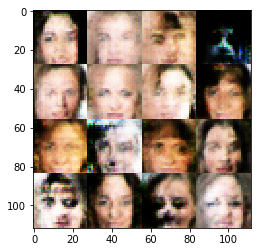

Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 1.0362
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.9872
Epoch 1/1... Discriminator Loss: 1.3442... Generator Loss: 0.5462
Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.4621
Epoch 1/1... Discriminator Loss: 1.8189... Generator Loss: 1.7748
Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.5559... Generator Loss: 0.3828
Epoch 1/1... Discriminator Loss: 1.5751... Generator Loss: 1.1293
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.7939
Epoch 1/1... Discriminator Loss: 1.5874... Generator Loss: 0.3750
Epoch 1/1... Discriminator Loss: 1.2626... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.2371... Generator Loss: 1.0770
Epoch 1/1... Discriminator Loss: 1.1392... Generator Loss: 0.8080
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 0.5204
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.6588
Epoch 1/1.

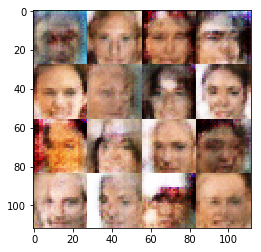

Epoch 1/1... Discriminator Loss: 1.3631... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 0.8231
Epoch 1/1... Discriminator Loss: 1.2163... Generator Loss: 0.6099
Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.2111... Generator Loss: 0.7586
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.1193... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.0200... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 0.8732
Epoch 1/1... Discriminator Loss: 1.2875... Generator Loss: 0.8511
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 1.2202... Generator Loss: 0.7580
Epoch 1/1... Discriminator Loss: 1.0772... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.2080... Generator Loss: 1.2514
Epoch 1/1... Discriminator Loss: 1.2109... Generator Loss: 0.6803
Epoch 1/1.

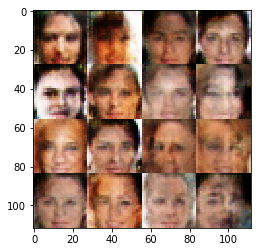

Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.7139
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.2499... Generator Loss: 0.8202
Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 1.2042... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.2119... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.5837
Epoch 1/1... Discriminator Loss: 1.1522... Generator Loss: 0.7162
Epoch 1/1... Discriminator Loss: 1.5015... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.5004... Generator Loss: 0.3609
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 1.0449
Epoch 1/1... Discriminator Loss: 1.1664... Generator Loss: 0.7251
Epoch 1/1... Discriminator Loss: 1.3625... Generator Loss: 0.5385
Epoch 1/1... Discriminator Loss: 0.9085... Generator Loss: 0.6698
Epoch 1/1.

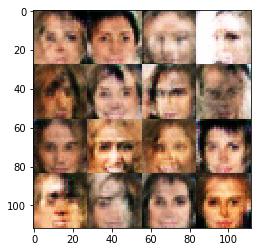

Epoch 1/1... Discriminator Loss: 1.7091... Generator Loss: 0.4466
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 0.9594
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.1519... Generator Loss: 0.6046
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 1.0427
Epoch 1/1... Discriminator Loss: 1.1328... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.5661
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.9783
Epoch 1/1... Discriminator Loss: 1.1118... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.7080
Epoch 1/1... Discriminator Loss: 1.2336... Generator Loss: 0.8734
Epoch 1/1... Discriminator Loss: 1.0004... Generator Loss: 1.0671
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.5488
Epoch 1/1.

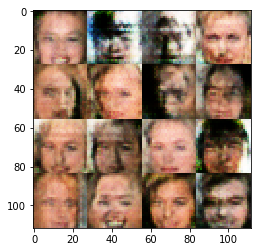

Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 0.7982
Epoch 1/1... Discriminator Loss: 1.5740... Generator Loss: 0.3626
Epoch 1/1... Discriminator Loss: 2.0792... Generator Loss: 1.7114
Epoch 1/1... Discriminator Loss: 1.4685... Generator Loss: 0.4952
Epoch 1/1... Discriminator Loss: 1.8398... Generator Loss: 0.2930
Epoch 1/1... Discriminator Loss: 1.6105... Generator Loss: 1.4913
Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.5277
Epoch 1/1... Discriminator Loss: 1.4182... Generator Loss: 0.5545
Epoch 1/1... Discriminator Loss: 1.4290... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.7227
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.5923
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.5496
Epoch 1/1... Discriminator Loss: 1.2877... Generator Loss: 0.6716
Epoch 1/1.

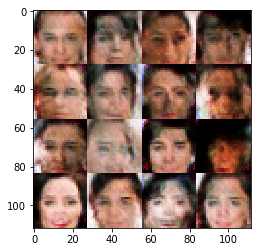

Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.9023
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.8418
Epoch 1/1... Discriminator Loss: 1.6456... Generator Loss: 0.3247
Epoch 1/1... Discriminator Loss: 1.5556... Generator Loss: 1.3643
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 1.0032
Epoch 1/1... Discriminator Loss: 1.5481... Generator Loss: 0.3702
Epoch 1/1... Discriminator Loss: 1.2191... Generator Loss: 0.9778
Epoch 1/1... Discriminator Loss: 1.2253... Generator Loss: 0.7349
Epoch 1/1... Discriminator Loss: 1.1814... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 1.2375... Generator Loss: 1.3093
Epoch 1/1... Discriminator Loss: 0.8703... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.0069... Generator Loss: 0.8433
Epoch 1/1... Discriminator Loss: 0.8293... Generator Loss: 0.8602
Epoch 1/1... Discriminator Loss: 1.2065... Generator Loss: 1.1626
Epoch 1/1.

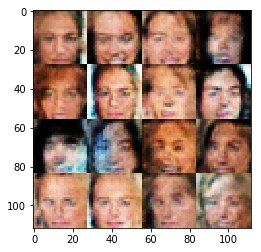

Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.4948
Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.6047
Epoch 1/1... Discriminator Loss: 1.1877... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.2124... Generator Loss: 0.8111
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 0.8055
Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.5540
Epoch 1/1... Discriminator Loss: 1.4886... Generator Loss: 1.2277
Epoch 1/1... Discriminator Loss: 1.3650... Generator Loss: 0.4379
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.4795
Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.3244... Generator Loss: 0.5056
Epoch 1/1... Discriminator Loss: 1.5332... Generator Loss: 0.4480
Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.9256
Epoch 1/1... Discriminator Loss: 1.5446... Generator Loss: 0.4699
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.6531
Epoch 1/1.

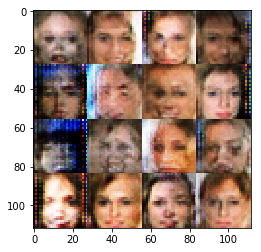

Epoch 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.4076
Epoch 1/1... Discriminator Loss: 1.3644... Generator Loss: 0.8757
Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.8319
Epoch 1/1... Discriminator Loss: 1.0884... Generator Loss: 0.5923
Epoch 1/1... Discriminator Loss: 1.0620... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.1350... Generator Loss: 0.9368
Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.8464
Epoch 1/1... Discriminator Loss: 1.3326... Generator Loss: 1.0147
Epoch 1/1... Discriminator Loss: 1.7786... Generator Loss: 0.2787
Epoch 1/1... Discriminator Loss: 1.3374... Generator Loss: 1.1596
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.6960
Epoch 1/1... Discriminator Loss: 1.2475... Generator Loss: 0.7289
Epoch 1/1.

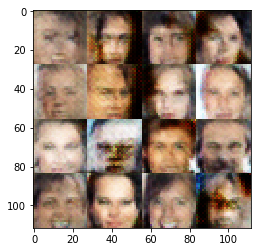

Epoch 1/1... Discriminator Loss: 1.3012... Generator Loss: 0.9841
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.5512
Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.3644... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.8954
Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.5802
Epoch 1/1... Discriminator Loss: 1.1824... Generator Loss: 0.6455
Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 0.9921... Generator Loss: 0.6970
Epoch 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.6522
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 0.9332... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.7005... Generator Loss: 0.3481
Epoch 1/1... Discriminator Loss: 1.5210... Generator Loss: 0.8234
Epoch 1/1.

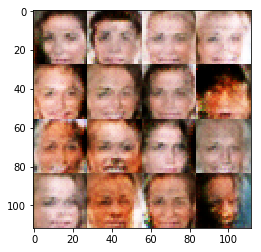

Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.1167... Generator Loss: 0.7148
Epoch 1/1... Discriminator Loss: 1.3071... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 1.1487... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.5346... Generator Loss: 0.6023
Epoch 1/1... Discriminator Loss: 1.6405... Generator Loss: 0.2976
Epoch 1/1... Discriminator Loss: 1.5999... Generator Loss: 1.6173
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 1.5326... Generator Loss: 0.3581
Epoch 1/1... Discriminator Loss: 1.5259... Generator Loss: 1.2313
Epoch 1/1... Discriminator Loss: 1.5237... Generator Loss: 0.3964
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.5341
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.9439
Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.5273
Epoch 1/1.

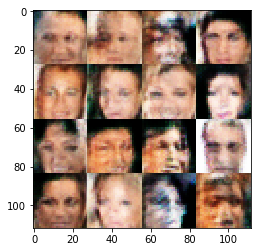

Epoch 1/1... Discriminator Loss: 1.3139... Generator Loss: 0.4082
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 1.3866
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.7185
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.8866
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.8787
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.6311
Epoch 1/1... Discriminator Loss: 1.1379... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.6006
Epoch 1/1... Discriminator Loss: 1.2148... Generator Loss: 0.8752
Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.5928
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.7145
Epoch 1/1... Discriminator Loss: 1.0121... Generator Loss: 0.7316
Epoch 1/1... Discriminator Loss: 0.9810... Generator Loss: 0.7509
Epoch 1/1... Discriminator Loss: 1.5008... Generator Loss: 1.2387
Epoch 1/1.

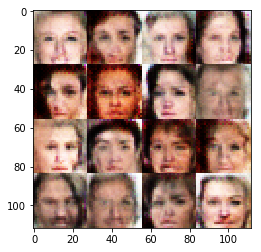

Epoch 1/1... Discriminator Loss: 1.6872... Generator Loss: 1.6812
Epoch 1/1... Discriminator Loss: 1.4775... Generator Loss: 0.5515
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.6062
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 1.3282
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.7974
Epoch 1/1... Discriminator Loss: 1.2241... Generator Loss: 0.4777
Epoch 1/1... Discriminator Loss: 1.4595... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.0796... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.2590... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.8292
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.7778
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.6504
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 0.7112
Epoch 1/1.

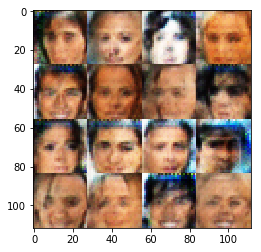

Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6243
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.4311
Epoch 1/1... Discriminator Loss: 1.1048... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.1885... Generator Loss: 0.9388
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.5284
Epoch 1/1... Discriminator Loss: 1.0994... Generator Loss: 0.5682
Epoch 1/1... Discriminator Loss: 1.6465... Generator Loss: 1.4341
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.4873
Epoch 1/1... Discriminator Loss: 1.5591... Generator Loss: 0.4716
Epoch 1/1... Discriminator Loss: 1.5189... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.5582
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.1718... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.8338
Epoch 1/1.

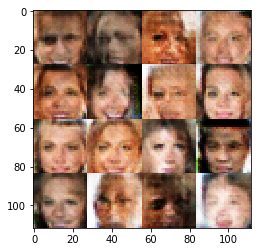

Epoch 1/1... Discriminator Loss: 1.2869... Generator Loss: 0.4664
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.2379... Generator Loss: 0.8992
Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.1940... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 1.6253... Generator Loss: 0.7920
Epoch 1/1... Discriminator Loss: 1.4564... Generator Loss: 0.4813
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.8330
Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 0.8152
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.7888
Epoch 1/1... Discriminator Loss: 1.1560... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.1294... Generator Loss: 0.6062
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.6356
Epoch 1/1.

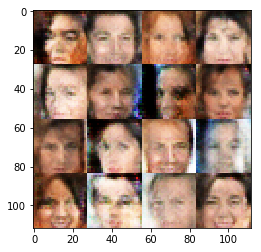

Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.5630
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 0.4740
Epoch 1/1... Discriminator Loss: 1.2397... Generator Loss: 0.7714
Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 0.8448
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.1680... Generator Loss: 0.7190
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.5145
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.8224
Epoch 1/1... Discriminator Loss: 1.1637... Generator Loss: 0.6630
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.5273
Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 0.8186
Epoch 1/1... Discriminator Loss: 1.1986... Generator Loss: 1.3712
Epoch 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.5235
Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.5434
Epoch 1/1... Discriminator Loss: 1.2587... Generator Loss: 1.2070
Epoch 1/1.

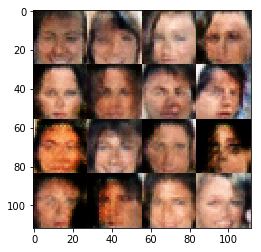

Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.5535
Epoch 1/1... Discriminator Loss: 1.5734... Generator Loss: 1.4280
Epoch 1/1... Discriminator Loss: 1.4244... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.4346
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.7982
Epoch 1/1... Discriminator Loss: 1.3069... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.4725
Epoch 1/1... Discriminator Loss: 1.1765... Generator Loss: 0.5710
Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.0411... Generator Loss: 0.8358
Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.2449... Generator Loss: 0.9373
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.7325
Epoch 1/1.

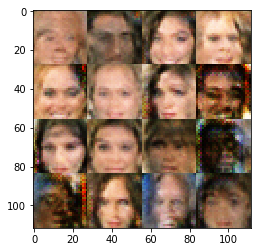

Epoch 1/1... Discriminator Loss: 1.1361... Generator Loss: 1.0968
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.6142
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 0.9614
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7053
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.4757
Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.9824
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 0.7670
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 1.0931... Generator Loss: 0.7442
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.8956
Epoch 1/1... Discriminator Loss: 1.2160... Generator Loss: 0.5654
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.6656
Epoch 1/1... Discriminator Loss: 1.2975... Generator Loss: 1.0075
Epoch 1/1.

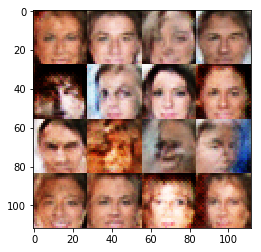

Epoch 1/1... Discriminator Loss: 1.3270... Generator Loss: 0.6987
Epoch 1/1... Discriminator Loss: 1.1816... Generator Loss: 0.5516
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.2276... Generator Loss: 0.7551
Epoch 1/1... Discriminator Loss: 1.0783... Generator Loss: 0.7089
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.9124
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.5497
Epoch 1/1... Discriminator Loss: 1.2707... Generator Loss: 0.7309
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 0.8091
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.5938
Epoch 1/1... Discriminator Loss: 1.0518... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.3437... Generator Loss: 0.7919
Epoch 1/1... Discriminator Loss: 1.1398... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 0.7936
Epoch 1/1.

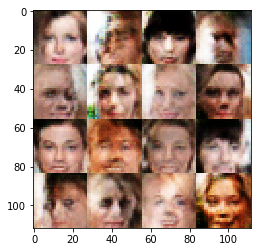

Epoch 1/1... Discriminator Loss: 0.9011... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.2457... Generator Loss: 1.0363
Epoch 1/1... Discriminator Loss: 1.6195... Generator Loss: 0.3031
Epoch 1/1... Discriminator Loss: 1.5627... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 1.5207... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.7129... Generator Loss: 0.4535
Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.5757
Epoch 1/1... Discriminator Loss: 1.5660... Generator Loss: 1.1961
Epoch 1/1... Discriminator Loss: 1.4684... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.7855
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.8268
Epoch 1/1.

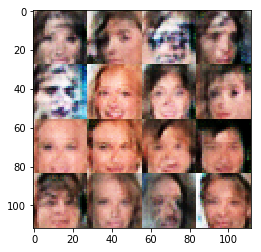

Epoch 1/1... Discriminator Loss: 1.2980... Generator Loss: 0.9742
Epoch 1/1... Discriminator Loss: 1.1979... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.0918... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.0979... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.7420
Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.8573
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.5728
Epoch 1/1... Discriminator Loss: 1.0992... Generator Loss: 0.6247
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.6558
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.9402
Epoch 1/1... Discriminator Loss: 1.1719... Generator Loss: 0.5714
Epoch 1/1.

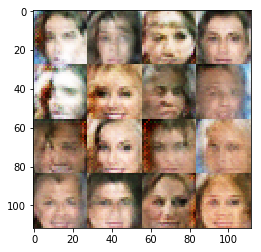

Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 0.9061... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 0.8252
Epoch 1/1... Discriminator Loss: 1.1358... Generator Loss: 0.7396
Epoch 1/1... Discriminator Loss: 0.9313... Generator Loss: 0.7642
Epoch 1/1... Discriminator Loss: 0.9380... Generator Loss: 0.7265
Epoch 1/1... Discriminator Loss: 1.1466... Generator Loss: 0.6936
Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.7634
Epoch 1/1... Discriminator Loss: 1.4390... Generator Loss: 0.9841
Epoch 1/1... Discriminator Loss: 1.8799... Generator Loss: 0.2246
Epoch 1/1... Discriminator Loss: 2.1903... Generator Loss: 2.3884
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.6141
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.5575
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.9818
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.9073
Epoch 1/1.

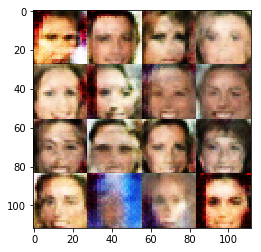

Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.3847
Epoch 1/1... Discriminator Loss: 1.2174... Generator Loss: 0.9145
Epoch 1/1... Discriminator Loss: 1.7634... Generator Loss: 0.3337
Epoch 1/1... Discriminator Loss: 1.8876... Generator Loss: 1.5492
Epoch 1/1... Discriminator Loss: 1.7227... Generator Loss: 0.2648
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.5700... Generator Loss: 1.4880
Epoch 1/1... Discriminator Loss: 1.4628... Generator Loss: 0.3645
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.7633
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.5784
Epoch 1/1... Discriminator Loss: 1.3852... Generator Loss: 0.5321
Epoch 1/1... Discriminator Loss: 1.2760... Generator Loss: 0.9030
Epoch 1/1... Discriminator Loss: 1.4470... Generator Loss: 0.6753
Epoch 1/1.

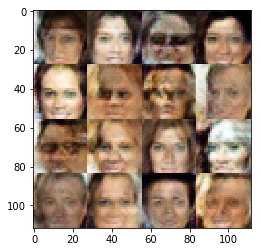

Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 1.1977... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.7816
Epoch 1/1... Discriminator Loss: 1.2139... Generator Loss: 0.9117
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.5939
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.2684... Generator Loss: 0.5708
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.9022
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.6011
Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 0.6323
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.8718
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.4279
Epoch 1/1.

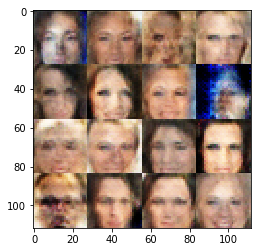

Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 1.0966
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 0.7312
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.6090
Epoch 1/1... Discriminator Loss: 1.1378... Generator Loss: 0.7027
Epoch 1/1... Discriminator Loss: 1.0985... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.0796... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.0973... Generator Loss: 0.6434
Epoch 1/1... Discriminator Loss: 1.5397... Generator Loss: 0.5125
Epoch 1/1... Discriminator Loss: 1.1651... Generator Loss: 0.6462
Epoch 1/1... Discriminator Loss: 1.4805... Generator Loss: 0.9286
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.4326
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 0.9994... Generator Loss: 1.0406
Epoch 1/1.

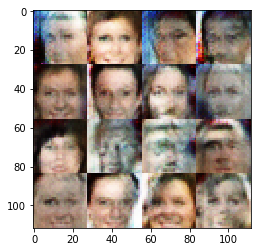

Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 1.1057
Epoch 1/1... Discriminator Loss: 1.7834... Generator Loss: 0.2723
Epoch 1/1... Discriminator Loss: 1.6311... Generator Loss: 0.4189
Epoch 1/1... Discriminator Loss: 1.5797... Generator Loss: 1.4504
Epoch 1/1... Discriminator Loss: 1.5925... Generator Loss: 0.3422
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 0.6691
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 1.0939
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.6099
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.7087
Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 0.7056
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.9542
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.5896
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.9089
Epoch 1/1.

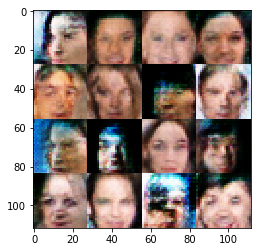

Epoch 1/1... Discriminator Loss: 1.2356... Generator Loss: 1.0339
Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.4504
Epoch 1/1... Discriminator Loss: 1.2065... Generator Loss: 0.9155
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.2471... Generator Loss: 0.6153
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 1.1920
Epoch 1/1... Discriminator Loss: 1.6766... Generator Loss: 0.2531
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 1.1178
Epoch 1/1... Discriminator Loss: 1.8138... Generator Loss: 0.2441
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 1.1368
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.5298
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.6165
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 1.1630
Epoch 1/1.

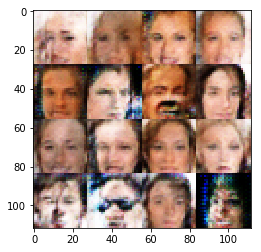

Epoch 1/1... Discriminator Loss: 1.2157... Generator Loss: 0.4925
Epoch 1/1... Discriminator Loss: 1.1553... Generator Loss: 0.5497
Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.4421
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 1.0792
Epoch 1/1... Discriminator Loss: 1.2825... Generator Loss: 0.8439
Epoch 1/1... Discriminator Loss: 1.5642... Generator Loss: 0.7052
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.0893... Generator Loss: 0.6007
Epoch 1/1... Discriminator Loss: 1.0205... Generator Loss: 0.8409
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.9424
Epoch 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.8239
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.5275
Epoch 1/1... Discriminator Loss: 1.2367... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.7039
Epoch 1/1.

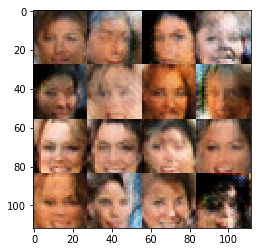

Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.2296... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.5682
Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 1.0791
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.5432
Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.9738
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.9108
Epoch 1/1... Discriminator Loss: 1.1687... Generator Loss: 0.4859
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.5939
Epoch 1/1... Discriminator Loss: 1.0941... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 1.1318... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.5868
Epoch 1/1... Discriminator Loss: 1.7591... Generator Loss: 1.0242
Epoch 1/1... Discriminator Loss: 1.8677... Generator Loss: 0.2483
Epoch 1/1.

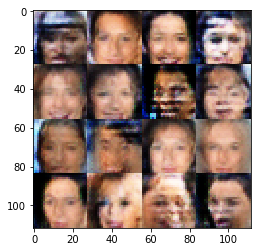

Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 1.1337... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 0.8660
Epoch 1/1... Discriminator Loss: 1.2506... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.2326... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.1729... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.0982... Generator Loss: 0.8349
Epoch 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.6705
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.3833... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 1.0948
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.4572
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.5376
Epoch 1/1... Discriminator Loss: 1.2413... Generator Loss: 1.0239
Epoch 1/1.

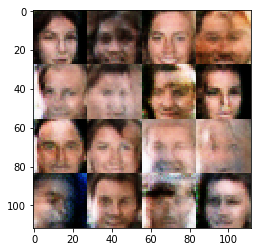

Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.8559
Epoch 1/1... Discriminator Loss: 1.3895... Generator Loss: 1.0500
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.4870
Epoch 1/1... Discriminator Loss: 1.3926... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.7414
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 1.3929... Generator Loss: 0.6201
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 1.2660
Epoch 1/1... Discriminator Loss: 1.2740... Generator Loss: 0.5943
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.7970
Epoch 1/1... Discriminator Loss: 1.2436... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.6116
Epoch 1/1... Discriminator Loss: 1.1883... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.0855... Generator Loss: 0.7851
Epoch 1/1.

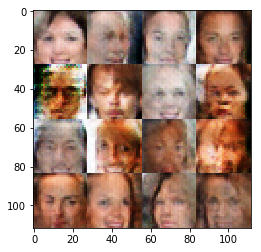

Epoch 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.8418
Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.8157
Epoch 1/1... Discriminator Loss: 1.3035... Generator Loss: 0.5893
Epoch 1/1... Discriminator Loss: 1.2656... Generator Loss: 0.6606
Epoch 1/1... Discriminator Loss: 1.3150... Generator Loss: 1.2709
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 0.4655
Epoch 1/1... Discriminator Loss: 1.1136... Generator Loss: 0.5400
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.7854
Epoch 1/1... Discriminator Loss: 1.3279... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.2967... Generator Loss: 0.8865
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.5704
Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 1.0964
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.0573... Generator Loss: 0.6064
Epoch 1/1.

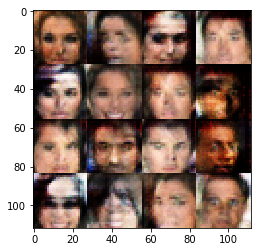

Epoch 1/1... Discriminator Loss: 0.9399... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.5330
Epoch 1/1... Discriminator Loss: 1.1204... Generator Loss: 0.6083
Epoch 1/1... Discriminator Loss: 1.4877... Generator Loss: 0.5083
Epoch 1/1... Discriminator Loss: 1.1900... Generator Loss: 1.2054
Epoch 1/1... Discriminator Loss: 1.1277... Generator Loss: 1.0427
Epoch 1/1... Discriminator Loss: 1.6438... Generator Loss: 0.2906
Epoch 1/1... Discriminator Loss: 1.1753... Generator Loss: 1.3431
Epoch 1/1... Discriminator Loss: 1.1591... Generator Loss: 0.5646
Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.8658
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.7036
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.8315
Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 0.6669
Epoch 1/1.

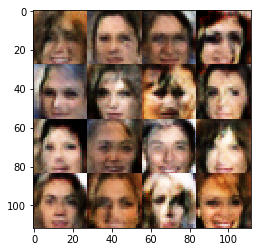

Epoch 1/1... Discriminator Loss: 1.5172... Generator Loss: 1.4514
Epoch 1/1... Discriminator Loss: 1.5598... Generator Loss: 0.4271
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.4439
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.9984
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.7789
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.4930
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.6147
Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 1.0811
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.9233
Epoch 1/1... Discriminator Loss: 1.2442... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.8294
Epoch 1/1.

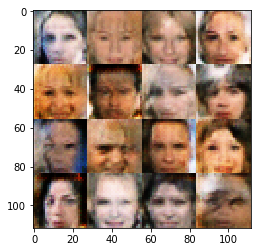

Epoch 1/1... Discriminator Loss: 1.2298... Generator Loss: 0.4774
Epoch 1/1... Discriminator Loss: 1.4749... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 1.2957... Generator Loss: 1.0208
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.4139
Epoch 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.7471
Epoch 1/1... Discriminator Loss: 1.3169... Generator Loss: 0.8798
Epoch 1/1... Discriminator Loss: 1.2094... Generator Loss: 0.6247
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.5055... Generator Loss: 1.3490
Epoch 1/1... Discriminator Loss: 1.8892... Generator Loss: 0.2318
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 1.0613
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.8003
Epoch 1/1... Discriminator Loss: 1.5671... Generator Loss: 0.2961
Epoch 1/1... Discriminator Loss: 1.1663... Generator Loss: 0.5287
Epoch 1/1.

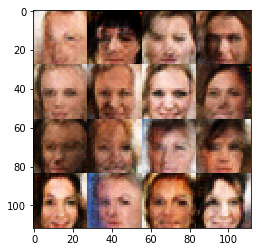

Epoch 1/1... Discriminator Loss: 1.4557... Generator Loss: 0.6438
Epoch 1/1... Discriminator Loss: 1.5022... Generator Loss: 0.3911
Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.9416
Epoch 1/1... Discriminator Loss: 1.0764... Generator Loss: 0.8173
Epoch 1/1... Discriminator Loss: 1.1809... Generator Loss: 0.5540
Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.2429... Generator Loss: 0.9098
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.9184
Epoch 1/1... Discriminator Loss: 1.2573... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.2739... Generator Loss: 0.6323
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 0.5237
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 1.1716... Generator Loss: 0.9044
Epoch 1/1.

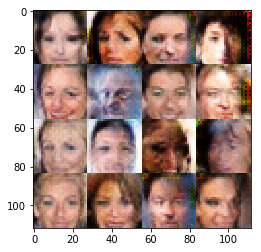

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.6765
Epoch 1/1... Discriminator Loss: 1.0961... Generator Loss: 0.5528
Epoch 1/1... Discriminator Loss: 1.0126... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 1.1135... Generator Loss: 0.9168
Epoch 1/1... Discriminator Loss: 1.1889... Generator Loss: 0.6564
Epoch 1/1... Discriminator Loss: 0.9843... Generator Loss: 0.7980
Epoch 1/1... Discriminator Loss: 1.2429... Generator Loss: 0.9400
Epoch 1/1... Discriminator Loss: 1.2952... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 1.0973... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 0.8558
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.3615
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 1.4690
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.8755
Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.5467
Epoch 1/1.

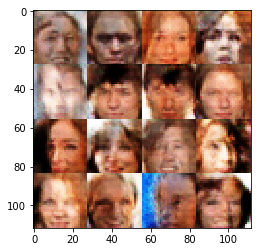

Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 1.0942
Epoch 1/1... Discriminator Loss: 1.3537... Generator Loss: 0.7276
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.3847
Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 0.6704
Epoch 1/1... Discriminator Loss: 1.5346... Generator Loss: 1.2817
Epoch 1/1... Discriminator Loss: 1.5086... Generator Loss: 0.3444
Epoch 1/1... Discriminator Loss: 1.1950... Generator Loss: 0.5499
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 1.2844
Epoch 1/1... Discriminator Loss: 1.1285... Generator Loss: 0.5628
Epoch 1/1... Discriminator Loss: 1.5706... Generator Loss: 0.4289
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.4770... Generator Loss: 0.7495
Epoch 1/1... Discriminator Loss: 1.5546... Generator Loss: 0.5021
Epoch 1/1... Discriminator Loss: 1.4910... Generator Loss: 0.5299
Epoch 1/1... Discriminator Loss: 1.1788... Generator Loss: 1.0423
Epoch 1/1.

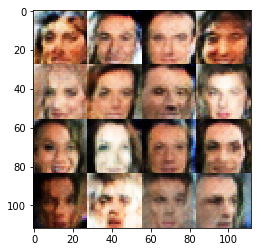

Epoch 1/1... Discriminator Loss: 1.3946... Generator Loss: 0.4849
Epoch 1/1... Discriminator Loss: 1.3049... Generator Loss: 0.8818
Epoch 1/1... Discriminator Loss: 1.1872... Generator Loss: 0.8124
Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 0.9635
Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 0.7421
Epoch 1/1... Discriminator Loss: 1.3128... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.1255... Generator Loss: 0.7225
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.9128
Epoch 1/1... Discriminator Loss: 1.1486... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.6786
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.6311
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.6486
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 0.4815
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.8020
Epoch 1/1.

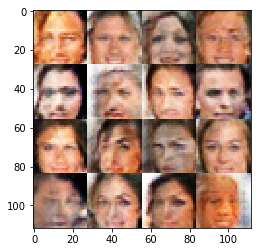

Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.7574
Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.3745
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.9652
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.4926
Epoch 1/1... Discriminator Loss: 1.3201... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.6648
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 0.6777
Epoch 1/1... Discriminator Loss: 1.0066... Generator Loss: 0.6793
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.5119
Epoch 1/1... Discriminator Loss: 1.3720... Generator Loss: 1.1145
Epoch 1/1... Discriminator Loss: 1.3357... Generator Loss: 0.9001
Epoch 1/1... Discriminator Loss: 1.4723... Generator Loss: 0.4250
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.9439
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.2127... Generator Loss: 0.5615
Epoch 1/1.

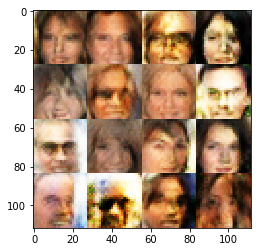

Epoch 1/1... Discriminator Loss: 1.2406... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.0687... Generator Loss: 0.9037
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 0.5570
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 1.0969
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.3719
Epoch 1/1... Discriminator Loss: 1.3146... Generator Loss: 0.5685
Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 1.1248
Epoch 1/1... Discriminator Loss: 1.7254... Generator Loss: 0.2986
Epoch 1/1... Discriminator Loss: 1.7131... Generator Loss: 1.5100
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.4598
Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.8115
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.6060
Epoch 1/1.

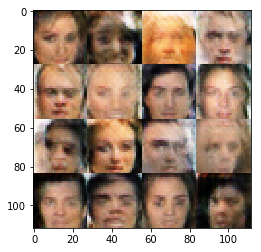

Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.4565
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 1.0302
Epoch 1/1... Discriminator Loss: 1.2428... Generator Loss: 0.6543
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 0.9709... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.1108... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.0318... Generator Loss: 0.7416
Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 1.0094
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.4347
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.8343
Epoch 1/1... Discriminator Loss: 1.2802... Generator Loss: 0.6515
Epoch 1/1... Discriminator Loss: 1.2698... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.9356
Epoch 1/1... Discriminator Loss: 1.5027... Generator Loss: 0.3709
Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.9470
Epoch 1/1.

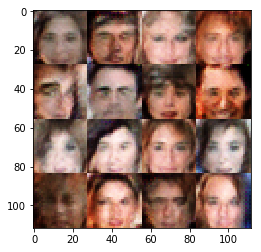

Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.7625
Epoch 1/1... Discriminator Loss: 1.2053... Generator Loss: 0.6225
Epoch 1/1... Discriminator Loss: 1.1467... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 0.6082
Epoch 1/1... Discriminator Loss: 1.1821... Generator Loss: 0.5735
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 1.0587
Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 0.6163
Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.4581
Epoch 1/1... Discriminator Loss: 1.5763... Generator Loss: 1.3755
Epoch 1/1... Discriminator Loss: 1.6576... Generator Loss: 0.3395
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.7531
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.6894
Epoch 1/1... Discriminator Loss: 1.2802... Generator Loss: 0.5034
Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.6661
Epoch 1/1.

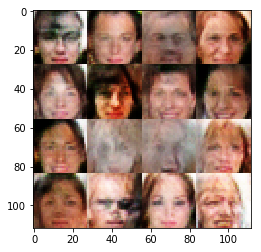

Epoch 1/1... Discriminator Loss: 1.4896... Generator Loss: 0.4796
Epoch 1/1... Discriminator Loss: 1.1739... Generator Loss: 1.0352
Epoch 1/1... Discriminator Loss: 1.1617... Generator Loss: 0.6112
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.8287
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.7586
Epoch 1/1... Discriminator Loss: 1.1750... Generator Loss: 0.8518
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.5859
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.7224
Epoch 1/1... Discriminator Loss: 1.1044... Generator Loss: 0.5679
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.8850
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.3404... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.6379
Epoch 1/1.

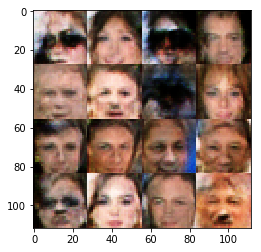

Epoch 1/1... Discriminator Loss: 1.1810... Generator Loss: 0.5724
Epoch 1/1... Discriminator Loss: 1.2227... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.0388... Generator Loss: 0.6566
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.5919... Generator Loss: 0.5203
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.4878... Generator Loss: 1.1343
Epoch 1/1... Discriminator Loss: 1.5925... Generator Loss: 0.3550
Epoch 1/1... Discriminator Loss: 1.3582... Generator Loss: 1.0628
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.5124
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.8087
Epoch 1/1... Discriminator Loss: 1.1555... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.2745... Generator Loss: 0.6002
Epoch 1/1.

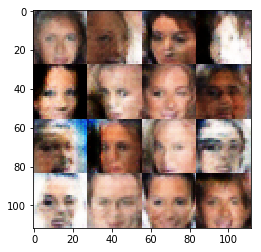

Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.9977
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.7283
Epoch 1/1... Discriminator Loss: 1.1380... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.5669
Epoch 1/1... Discriminator Loss: 1.2794... Generator Loss: 0.6007
Epoch 1/1... Discriminator Loss: 1.1497... Generator Loss: 0.6515
Epoch 1/1... Discriminator Loss: 0.9500... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.1937... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.1565... Generator Loss: 0.7276
Epoch 1/1... Discriminator Loss: 1.2467... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 1.0453
Epoch 1/1... Discriminator Loss: 1.1047... Generator Loss: 0.5487
Epoch 1/1... Discriminator Loss: 1.3736... Generator Loss: 0.5503
Epoch 1/1.

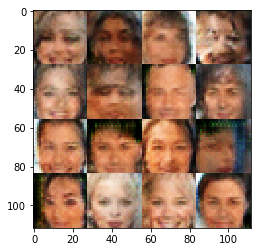

Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.4110
Epoch 1/1... Discriminator Loss: 1.1260... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.6052
Epoch 1/1... Discriminator Loss: 1.5906... Generator Loss: 0.3482
Epoch 1/1... Discriminator Loss: 1.6313... Generator Loss: 1.5136
Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 1.0232
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.5830
Epoch 1/1... Discriminator Loss: 1.3142... Generator Loss: 0.7730
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 0.5732
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.3252... Generator Loss: 0.9362
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.7028
Epoch 1/1.

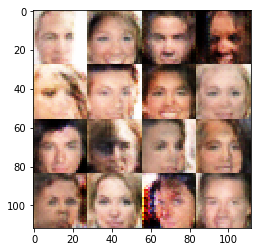

Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.2794... Generator Loss: 1.0213
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.2951... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.2318... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.1799... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.6045
Epoch 1/1... Discriminator Loss: 1.1608... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.8680
Epoch 1/1... Discriminator Loss: 1.1946... Generator Loss: 0.5082
Epoch 1/1... Discriminator Loss: 1.2975... Generator Loss: 1.0765
Epoch 1/1... Discriminator Loss: 1.6991... Generator Loss: 0.2573
Epoch 1/1... Discriminator Loss: 1.7217... Generator Loss: 0.4582
Epoch 1/1.

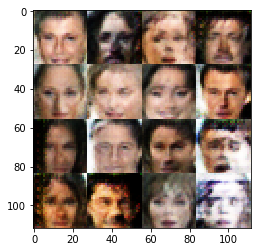

Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.5873... Generator Loss: 0.5764
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.8848
Epoch 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.5592
Epoch 1/1... Discriminator Loss: 1.2747... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.1717... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.6607
Epoch 1/1... Discriminator Loss: 1.2438... Generator Loss: 0.6162
Epoch 1/1... Discriminator Loss: 1.1547... Generator Loss: 0.6314
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 0.7800
Epoch 1/1... Discriminator Loss: 1.2697... Generator Loss: 0.8251
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.4290
Epoch 1/1.

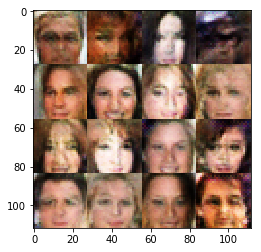

Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.7055
Epoch 1/1... Discriminator Loss: 1.4109... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.3847... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.7866
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.9420
Epoch 1/1... Discriminator Loss: 1.1814... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.5846
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.4669
Epoch 1/1... Discriminator Loss: 1.2139... Generator Loss: 0.7685
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.8823
Epoch 1/1... Discriminator Loss: 1.2875... Generator Loss: 0.4624
Epoch 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.5617
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 1.4947
Epoch 1/1... Discriminator Loss: 1.3165... Generator Loss: 0.7823
Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.4384
Epoch 1/1.

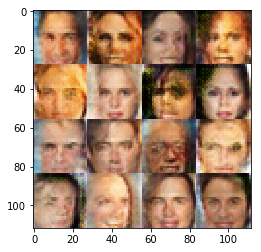

Epoch 1/1... Discriminator Loss: 1.2994... Generator Loss: 0.5586
Epoch 1/1... Discriminator Loss: 1.1082... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 0.9687... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.2801... Generator Loss: 0.6942
Epoch 1/1... Discriminator Loss: 1.3231... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.5623
Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.7849
Epoch 1/1... Discriminator Loss: 1.4466... Generator Loss: 0.4083
Epoch 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 1.2564
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.8253
Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.5782
Epoch 1/1... Discriminator Loss: 1.2059... Generator Loss: 0.7475
Epoch 1/1.

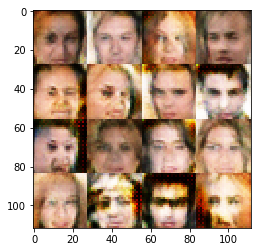

Epoch 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.5772
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.1992... Generator Loss: 0.5666
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 1.2447
Epoch 1/1... Discriminator Loss: 1.2367... Generator Loss: 0.5110
Epoch 1/1... Discriminator Loss: 1.1714... Generator Loss: 0.7322
Epoch 1/1... Discriminator Loss: 1.3184... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.8249
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.4053
Epoch 1/1... Discriminator Loss: 1.4705... Generator Loss: 1.4057
Epoch 1/1... Discriminator Loss: 1.0500... Generator Loss: 0.7682
Epoch 1/1... Discriminator Loss: 1.1527... Generator Loss: 0.5958
Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.8731
Epoch 1/1.

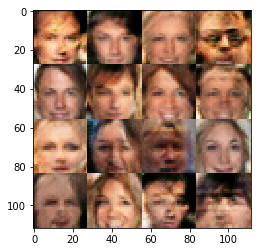

Epoch 1/1... Discriminator Loss: 1.5697... Generator Loss: 0.3814
Epoch 1/1... Discriminator Loss: 1.2959... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.7853
Epoch 1/1... Discriminator Loss: 1.2207... Generator Loss: 0.4857
Epoch 1/1... Discriminator Loss: 1.2072... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.2388... Generator Loss: 0.6167
Epoch 1/1... Discriminator Loss: 1.0244... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.0079... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.8257
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 0.4782
Epoch 1/1... Discriminator Loss: 1.3401... Generator Loss: 0.9264
Epoch 1/1... Discriminator Loss: 1.2892... Generator Loss: 0.5914
Epoch 1/1.

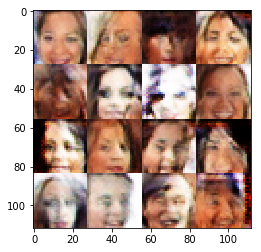

Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.5510
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.2015... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 1.1078... Generator Loss: 0.6039
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.8254
Epoch 1/1... Discriminator Loss: 1.1614... Generator Loss: 0.8906
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 0.6395
Epoch 1/1... Discriminator Loss: 1.2135... Generator Loss: 0.5429
Epoch 1/1... Discriminator Loss: 1.0576... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.8919
Epoch 1/1... Discriminator Loss: 1.5264... Generator Loss: 0.6563
Epoch 1/1... Discriminator Loss: 1.3392... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.7659
Epoch 1/1.

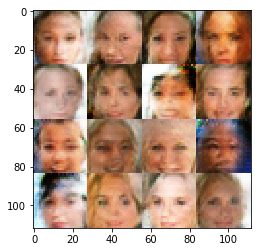

Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.8228
Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.5729
Epoch 1/1... Discriminator Loss: 1.1825... Generator Loss: 1.2117
Epoch 1/1... Discriminator Loss: 1.5712... Generator Loss: 0.4506
Epoch 1/1... Discriminator Loss: 1.2647... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.5025... Generator Loss: 1.0973
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.5831
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.5557
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.7120
Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.8308
Epoch 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.7315
Epoch 1/1.

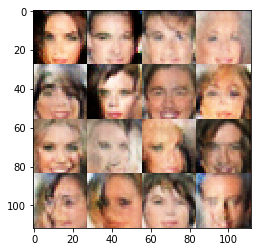

Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 1.0521
Epoch 1/1... Discriminator Loss: 1.7404... Generator Loss: 0.2653
Epoch 1/1... Discriminator Loss: 1.3409... Generator Loss: 1.1992
Epoch 1/1... Discriminator Loss: 1.5156... Generator Loss: 0.6308
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 1.0079
Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.3050... Generator Loss: 0.4724
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.1795... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.2332... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 0.7086
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 0.5097
Epoch 1/1.

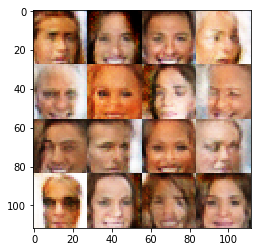

Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 1.4156
Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.4586
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.8163
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 0.7864
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 0.4986
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 0.8359
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.6367
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.0817... Generator Loss: 0.6271
Epoch 1/1... Discriminator Loss: 1.4860... Generator Loss: 1.0717
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.5613
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.7498
Epoch 1/1.

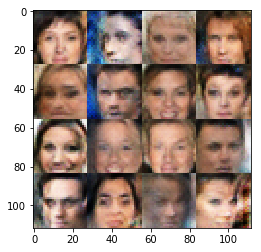

Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.4983
Epoch 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.7363
Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.5444
Epoch 1/1... Discriminator Loss: 1.3744... Generator Loss: 0.6711
Epoch 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.7124
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.8645
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.5424
Epoch 1/1... Discriminator Loss: 1.3924... Generator Loss: 0.5148
Epoch 1/1... Discriminator Loss: 1.5584... Generator Loss: 1.0558
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.5100
Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 0.4820
Epoch 1/1... Discriminator Loss: 1.0023... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.8472
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.7034
Epoch 1/1.

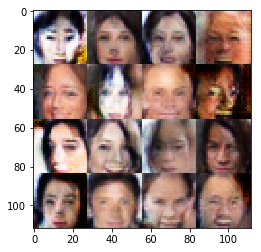

Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.9987
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.7482
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.4328
Epoch 1/1... Discriminator Loss: 1.1417... Generator Loss: 0.9451
Epoch 1/1... Discriminator Loss: 1.2559... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.5247... Generator Loss: 0.4041
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 1.0450
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.8729
Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 0.5426
Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 0.6851
Epoch 1/1... Discriminator Loss: 1.2216... Generator Loss: 1.0306
Epoch 1/1... Discriminator Loss: 1.2108... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.7378
Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 0.5916
Epoch 1/1.

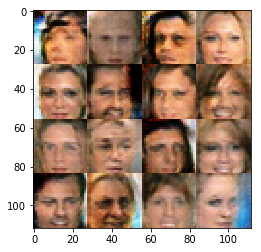

Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.1696... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.1891... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 0.5458
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.3619... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.1897... Generator Loss: 0.6732
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.8606
Epoch 1/1... Discriminator Loss: 1.5623... Generator Loss: 0.3468
Epoch 1/1... Discriminator Loss: 1.6777... Generator Loss: 1.0205
Epoch 1/1... Discriminator Loss: 1.5895... Generator Loss: 0.4398
Epoch 1/1.

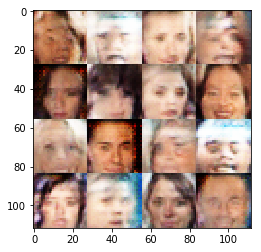

Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.7067
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.9323
Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.5596
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.9247
Epoch 1/1... Discriminator Loss: 1.2930... Generator Loss: 0.4990
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.6276
Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.9971
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.5116
Epoch 1/1... Discriminator Loss: 1.3422... Generator Loss: 0.5085
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 1.0606
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.7823
Epoch 1/1.

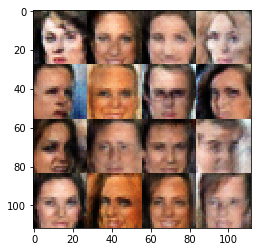

Epoch 1/1... Discriminator Loss: 1.2109... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.5223
Epoch 1/1... Discriminator Loss: 1.3157... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.8098
Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 0.9088
Epoch 1/1... Discriminator Loss: 1.5118... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.9484
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.7293
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.4916
Epoch 1/1... Discriminator Loss: 1.2358... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.1480... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 1.4327... Generator Loss: 0.8287
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.5039
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 0.8210
Epoch 1/1.

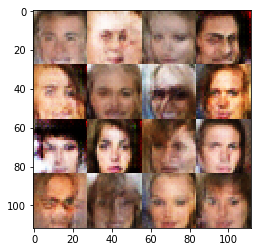

Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.2568... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.8634
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.6057
Epoch 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.6829
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.9352
Epoch 1/1... Discriminator Loss: 1.2653... Generator Loss: 0.6080
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.5831
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.8047
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.6303
Epoch 1/1... Discriminator Loss: 1.1105... Generator Loss: 0.5579
Epoch 1/1.

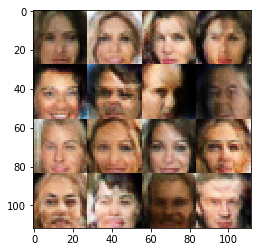

Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 0.4220
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 1.0122
Epoch 1/1... Discriminator Loss: 1.2394... Generator Loss: 1.1553
Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.6013
Epoch 1/1... Discriminator Loss: 1.1820... Generator Loss: 0.7537
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.1225... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.3658... Generator Loss: 0.8129
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.5768
Epoch 1/1... Discriminator Loss: 1.1586... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.6424
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.9324
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.5327
Epoch 1/1.

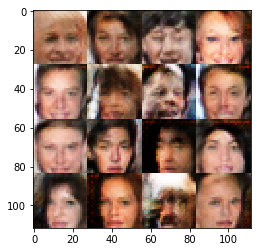

Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.5484
Epoch 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.5613
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.7187
Epoch 1/1... Discriminator Loss: 1.2930... Generator Loss: 0.6088
Epoch 1/1... Discriminator Loss: 1.2450... Generator Loss: 0.8764
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.6215
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.5008
Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.9004
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.4265
Epoch 1/1... Discriminator Loss: 1.4203... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.6973
Epoch 1/1... Discriminator Loss: 1.3000... Generator Loss: 0.6975
Epoch 1/1.

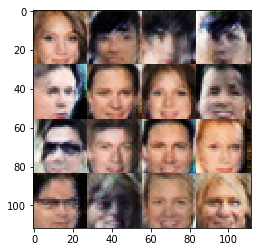

Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 0.5006
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.8839
Epoch 1/1... Discriminator Loss: 1.5009... Generator Loss: 0.4571
Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.6102
Epoch 1/1... Discriminator Loss: 1.3565... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.4869... Generator Loss: 0.5440
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.9743
Epoch 1/1... Discriminator Loss: 1.3447... Generator Loss: 0.5480
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.5601
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.3484... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.5300
Epoch 1/1... Discriminator Loss: 1.3799... Generator Loss: 0.8531
Epoch 1/1.

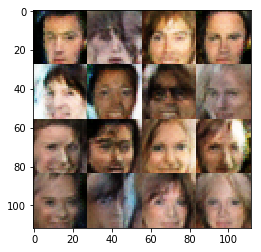

Epoch 1/1... Discriminator Loss: 1.1179... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.1573... Generator Loss: 0.8141
Epoch 1/1... Discriminator Loss: 1.3257... Generator Loss: 0.7872
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.7796
Epoch 1/1... Discriminator Loss: 1.3619... Generator Loss: 0.6265
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.5648
Epoch 1/1... Discriminator Loss: 1.3047... Generator Loss: 0.7874
Epoch 1/1... Discriminator Loss: 1.2747... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.1965... Generator Loss: 0.4522
Epoch 1/1... Discriminator Loss: 1.1279... Generator Loss: 0.6568
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 0.9438
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.7938
Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.6378
Epoch 1/1.

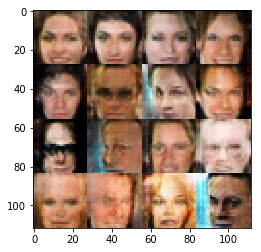

Epoch 1/1... Discriminator Loss: 1.5182... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.5311
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.8983
Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.9059
Epoch 1/1... Discriminator Loss: 1.3372... Generator Loss: 0.6006
Epoch 1/1... Discriminator Loss: 1.2377... Generator Loss: 0.4644
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.8430
Epoch 1/1... Discriminator Loss: 1.4427... Generator Loss: 0.5273
Epoch 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.6814
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.7253
Epoch 1/1.

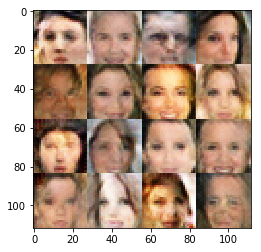

Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.4934
Epoch 1/1... Discriminator Loss: 1.2463... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.7827
Epoch 1/1... Discriminator Loss: 1.5453... Generator Loss: 0.3797
Epoch 1/1... Discriminator Loss: 1.3252... Generator Loss: 1.3654
Epoch 1/1... Discriminator Loss: 1.5380... Generator Loss: 0.4235
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.9135
Epoch 1/1... Discriminator Loss: 1.2220... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.6445
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.9196
Epoch 1/1... Discriminator Loss: 1.2487... Generator Loss: 0.7144
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.5739
Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.7557
Epoch 1/1.

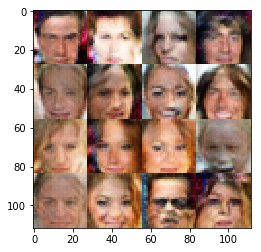

Epoch 1/1... Discriminator Loss: 1.1305... Generator Loss: 0.7247
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.7672
Epoch 1/1... Discriminator Loss: 1.2594... Generator Loss: 0.5676
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.7600
Epoch 1/1... Discriminator Loss: 1.2717... Generator Loss: 0.7828
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.2220... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.8305
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 0.5934
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.8046
Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.8598
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.7381
Epoch 1/1... Discriminator Loss: 1.1413... Generator Loss: 0.7649
Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 0.6272
Epoch 1/1.

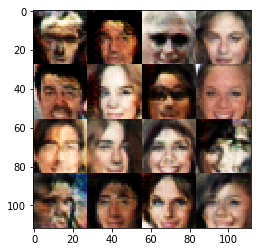

Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.9086
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.4377
Epoch 1/1... Discriminator Loss: 1.2687... Generator Loss: 0.9644
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.3135... Generator Loss: 0.5758
Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 0.6830
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7957
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.6483
Epoch 1/1... Discriminator Loss: 1.2096... Generator Loss: 0.5267
Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.8762
Epoch 1/1... Discriminator Loss: 1.2442... Generator Loss: 0.8466
Epoch 1/1... Discriminator Loss: 1.3922... Generator Loss: 0.5948
Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.6141
Epoch 1/1.

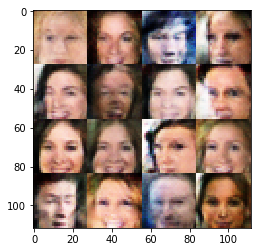

Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.1863... Generator Loss: 0.5499
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 1.3650... Generator Loss: 0.8029
Epoch 1/1... Discriminator Loss: 1.3053... Generator Loss: 0.8339
Epoch 1/1... Discriminator Loss: 1.3754... Generator Loss: 0.9068
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.5923
Epoch 1/1... Discriminator Loss: 1.2231... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 0.7822
Epoch 1/1... Discriminator Loss: 1.2345... Generator Loss: 0.7747
Epoch 1/1... Discriminator Loss: 1.1983... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.5266
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.2983... Generator Loss: 0.8664
Epoch 1/1.

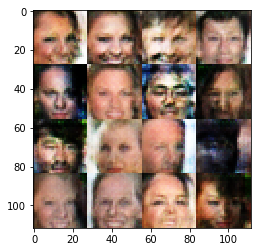

Epoch 1/1... Discriminator Loss: 1.2289... Generator Loss: 0.6883
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.1367... Generator Loss: 0.5808
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.8917
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.5551
Epoch 1/1... Discriminator Loss: 1.2794... Generator Loss: 0.6250
Epoch 1/1... Discriminator Loss: 1.3023... Generator Loss: 0.8349
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 1.1938... Generator Loss: 0.4744
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 1.0186
Epoch 1/1... Discriminator Loss: 1.3029... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 0.6027
Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.9665
Epoch 1/1.

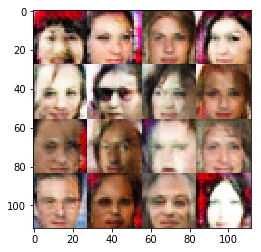

Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.7512
Epoch 1/1... Discriminator Loss: 1.1775... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.5355
Epoch 1/1... Discriminator Loss: 1.2065... Generator Loss: 0.6009
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.2615... Generator Loss: 0.5088
Epoch 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.5670
Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.8532
Epoch 1/1... Discriminator Loss: 1.2223... Generator Loss: 0.7640
Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.6586
Epoch 1/1... Discriminator Loss: 1.5238... Generator Loss: 0.4583
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 1.1236
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.6013
Epoch 1/1... Discriminator Loss: 1.6071... Generator Loss: 0.3197
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.8352
Epoch 1/1.

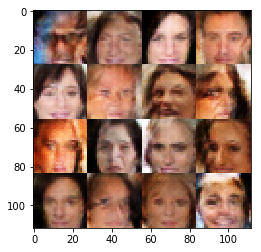

Epoch 1/1... Discriminator Loss: 1.3253... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 0.9556
Epoch 1/1... Discriminator Loss: 1.2653... Generator Loss: 0.8339
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 1.2035... Generator Loss: 0.8766
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.4198
Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.5261
Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.4594
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.5397
Epoch 1/1.

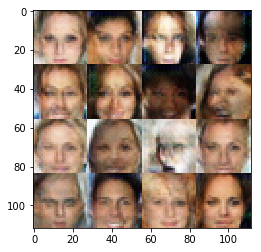

Epoch 1/1... Discriminator Loss: 1.3991... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 0.5536
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.2994... Generator Loss: 0.6152
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.5831
Epoch 1/1... Discriminator Loss: 1.5436... Generator Loss: 0.5323
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.3375... Generator Loss: 1.0543
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.4586
Epoch 1/1... Discriminator Loss: 1.2697... Generator Loss: 0.5372
Epoch 1/1... Discriminator Loss: 1.0469... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.1748... Generator Loss: 0.8388
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 0.5423
Epoch 1/1.

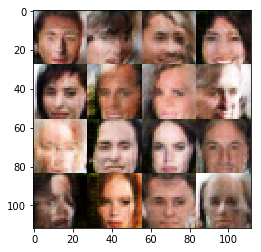

Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.6591... Generator Loss: 0.3487
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 1.0169
Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 0.8311
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.5333
Epoch 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 1.3546... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.6708
Epoch 1/1... Discriminator Loss: 1.1383... Generator Loss: 0.5895
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.8195
Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.5002
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.5328
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 0.9197
Epoch 1/1.

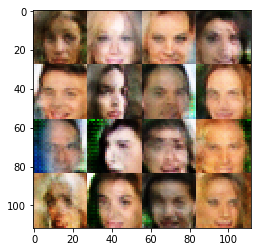

Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.4111
Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 0.9134
Epoch 1/1... Discriminator Loss: 1.2578... Generator Loss: 1.0174
Epoch 1/1... Discriminator Loss: 1.2325... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.4384
Epoch 1/1... Discriminator Loss: 1.1978... Generator Loss: 0.7321
Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.8013
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 0.7985
Epoch 1/1... Discriminator Loss: 1.4249... Generator Loss: 0.9309
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.5977
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.2766... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 0.6983
Epoch 1/1.

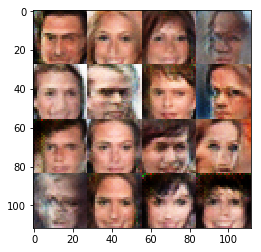

Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.7857
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.5549
Epoch 1/1... Discriminator Loss: 1.1601... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.5759
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.8304
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.5320
Epoch 1/1... Discriminator Loss: 1.4148... Generator Loss: 0.5724
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.8796
Epoch 1/1.

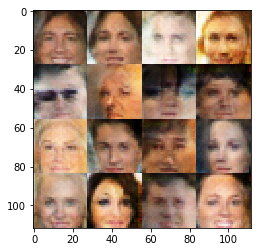

Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.6492
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.8992
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.8589
Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.6298
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.5877
Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.6506
Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 0.5543
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.7060
Epoch 1/1... Discriminator Loss: 1.0733... Generator Loss: 0.5852
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.5540
Epoch 1/1... Discriminator Loss: 1.5356... Generator Loss: 1.3607
Epoch 1/1... Discriminator Loss: 1.3852... Generator Loss: 0.4708
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.5164
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.7221
Epoch 1/1.

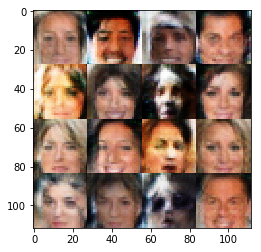

Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.8466
Epoch 1/1... Discriminator Loss: 1.2951... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.1495... Generator Loss: 0.7973
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 0.8542
Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.3225... Generator Loss: 0.5399
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.8504
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.2678... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.2010... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.0923... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 1.0371... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.1335... Generator Loss: 0.7643
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.5988
Epoch 1/1.

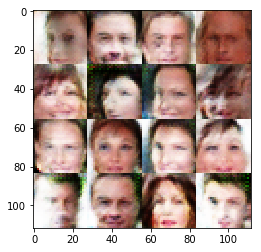

Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.5680
Epoch 1/1... Discriminator Loss: 1.2370... Generator Loss: 0.6931
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.9104
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.8718
Epoch 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.5099
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.2170... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 1.2287... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 1.1710
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.5627
Epoch 1/1... Discriminator Loss: 1.5390... Generator Loss: 0.3921
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.7279
Epoch 1/1.

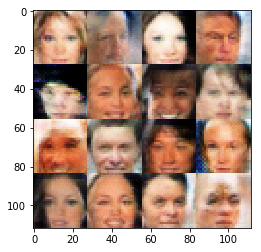

Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.4247... Generator Loss: 0.9072
Epoch 1/1... Discriminator Loss: 1.3385... Generator Loss: 0.6958
Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.7468
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.5759
Epoch 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.6014
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.5862
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.6550
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 0.6374
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.5152
Epoch 1/1.

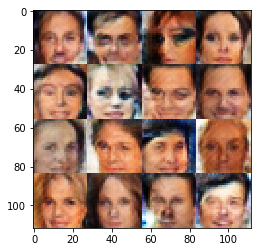

Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.5778
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.4016
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 1.0014
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.5893
Epoch 1/1... Discriminator Loss: 1.1678... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.2547... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.5507
Epoch 1/1... Discriminator Loss: 1.3812... Generator Loss: 0.5965
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.9169
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 1.1160... Generator Loss: 0.5662
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.6032
Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 1.0360
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.5234
Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.7034
Epoch 1/1.

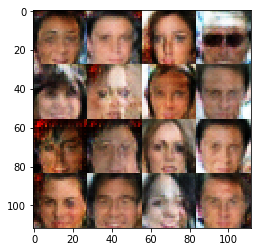

Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.4394
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.2698... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.2300... Generator Loss: 0.6486
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 1.2992... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.0830... Generator Loss: 0.5583
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.1123... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.4894
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 1.2328
Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.8979
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.8467
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 1.3225... Generator Loss: 0.6925
Epoch 1/1.

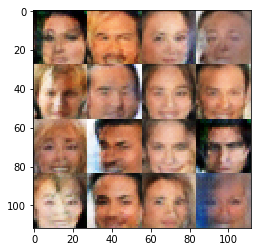

Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.5833
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 0.4978
Epoch 1/1... Discriminator Loss: 1.4672... Generator Loss: 1.3850
Epoch 1/1... Discriminator Loss: 1.3214... Generator Loss: 0.7880
Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.4302
Epoch 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.6451
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 1.1062... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 1.0794... Generator Loss: 0.6803
Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 0.8874
Epoch 1/1... Discriminator Loss: 0.9978... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 1.0375
Epoch 1/1... Discriminator Loss: 1.4606... Generator Loss: 0.9983
Epoch 1/1... Discriminator Loss: 1.4150... Generator Loss: 0.6038
Epoch 1/1.

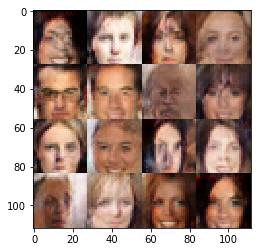

Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.7685
Epoch 1/1... Discriminator Loss: 1.3934... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.6316
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.6002
Epoch 1/1... Discriminator Loss: 1.2907... Generator Loss: 1.1592
Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 1.2893... Generator Loss: 0.8414
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.2241... Generator Loss: 0.5558
Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.8266
Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.2348... Generator Loss: 0.4912
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.5886
Epoch 1/1.

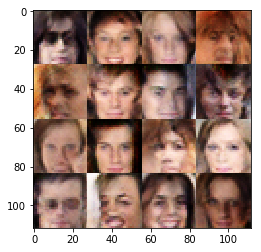

Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.4462
Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 1.0430
Epoch 1/1... Discriminator Loss: 1.1868... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 1.3339... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.7976
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.6822
Epoch 1/1... Discriminator Loss: 1.1897... Generator Loss: 0.6030
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.8809
Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 0.7830
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.7005
Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.6108
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.8772
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.1895... Generator Loss: 0.6489
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 1.1650
Epoch 1/1.

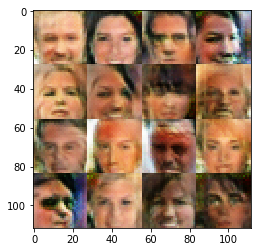

Epoch 1/1... Discriminator Loss: 1.3180... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.9241
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 1.0121
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.5193
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.5353
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 0.7558
Epoch 1/1... Discriminator Loss: 1.1447... Generator Loss: 0.7018
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.4478
Epoch 1/1.

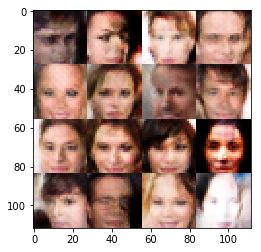

Epoch 1/1... Discriminator Loss: 1.5008... Generator Loss: 0.4966
Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.9073
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.5975... Generator Loss: 0.4911
Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.6645
Epoch 1/1... Discriminator Loss: 1.3008... Generator Loss: 1.0350
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.7528
Epoch 1/1... Discriminator Loss: 1.3495... Generator Loss: 0.6549
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.2485... Generator Loss: 0.7607
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.6339
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.2620... Generator Loss: 0.7417
Epoch 1/1.

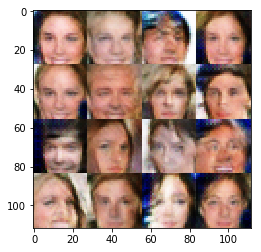

Epoch 1/1... Discriminator Loss: 1.2088... Generator Loss: 0.8167
Epoch 1/1... Discriminator Loss: 1.1970... Generator Loss: 0.9536
Epoch 1/1... Discriminator Loss: 1.2504... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.6312
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.6500
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.6066
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.7687
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 0.5837
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.5468
Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 0.6522
Epoch 1/1... Discriminator Loss: 1.0220... Generator Loss: 0.6630
Epoch 1/1.

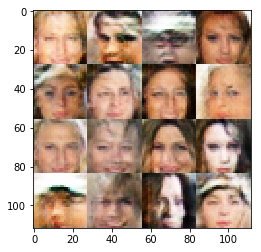

Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6340
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 1.0054
Epoch 1/1... Discriminator Loss: 1.5761... Generator Loss: 0.3571
Epoch 1/1... Discriminator Loss: 1.2496... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.8752
Epoch 1/1... Discriminator Loss: 1.2194... Generator Loss: 0.4887
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.1307... Generator Loss: 0.5635
Epoch 1/1... Discriminator Loss: 1.5349... Generator Loss: 1.5459
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 1.6408... Generator Loss: 0.3193
Epoch 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.8662
Epoch 1/1.

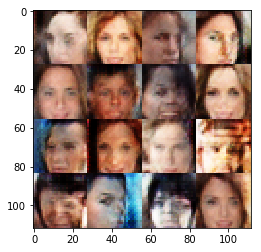

Epoch 1/1... Discriminator Loss: 1.1818... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.1152... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.3213... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.1708... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.5185... Generator Loss: 0.5175
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.7190
Epoch 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.6751
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.6235
Epoch 1/1... Discriminator Loss: 1.3131... Generator Loss: 0.7280
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.5991
Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 0.5495
Epoch 1/1.

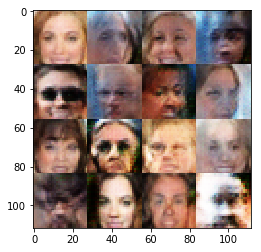

Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.3864
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 0.6118
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.4873... Generator Loss: 0.8687
Epoch 1/1... Discriminator Loss: 1.5190... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.5526... Generator Loss: 0.3787
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 1.2615
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.4797
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.6794
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 1.1812
Epoch 1/1... Discriminator Loss: 1.3231... Generator Loss: 0.5120
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.5849
Epoch 1/1... Discriminator Loss: 1.1513... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.7296
Epoch 1/1.

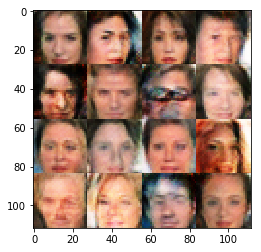

Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.2248... Generator Loss: 0.6076
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.6009
Epoch 1/1... Discriminator Loss: 1.2046... Generator Loss: 0.5922
Epoch 1/1... Discriminator Loss: 1.2378... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 1.1327... Generator Loss: 0.6673
Epoch 1/1... Discriminator Loss: 1.2877... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 1.6145
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.7425
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.3881
Epoch 1/1... Discriminator Loss: 1.5488... Generator Loss: 0.5332
Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 1.1140
Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.5875
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.8359
Epoch 1/1.

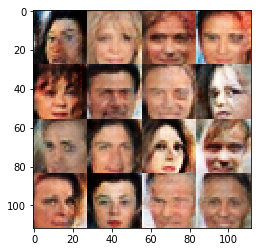

Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.6619
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.2917... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.2358... Generator Loss: 0.8404
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.7362
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.7930
Epoch 1/1... Discriminator Loss: 1.3244... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.5732
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.7384
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.2804... Generator Loss: 0.5988
Epoch 1/1... Discriminator Loss: 1.3054... Generator Loss: 0.5837
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.6460
Epoch 1/1... Discriminator Loss: 1.2114... Generator Loss: 0.6576
Epoch 1/1.

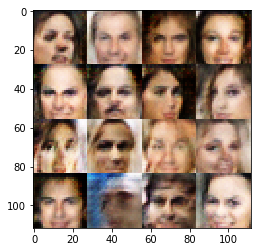

Epoch 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.8398
Epoch 1/1... Discriminator Loss: 1.2400... Generator Loss: 0.7594
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.8166
Epoch 1/1... Discriminator Loss: 1.3973... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.5742
Epoch 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.5782
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.6379
Epoch 1/1... Discriminator Loss: 1.1086... Generator Loss: 0.6492
Epoch 1/1... Discriminator Loss: 1.2559... Generator Loss: 0.5953
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.2289... Generator Loss: 0.5426
Epoch 1/1... Discriminator Loss: 1.2393... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 1.1699
Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.6093
Epoch 1/1.

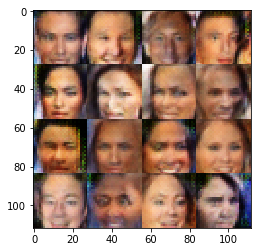

Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.7032
Epoch 1/1... Discriminator Loss: 1.1586... Generator Loss: 0.5582
Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.5848
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.9080
Epoch 1/1... Discriminator Loss: 1.2968... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.5033
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.2392... Generator Loss: 0.8582
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.8651
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.4867
Epoch 1/1... Discriminator Loss: 1.3412... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.9096
Epoch 1/1... Discriminator Loss: 1.1957... Generator Loss: 0.6444
Epoch 1/1.

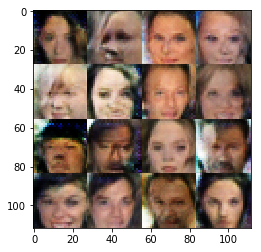

Epoch 1/1... Discriminator Loss: 1.3325... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.2324... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.7697
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.1925... Generator Loss: 0.6078


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.4
tf.reset_default_graph()


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.